# Wasserstein GAN with Gradient Penalty (WGAN-GP)

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
torch.manual_seed(0) 

def show_tensor_images(data_tensor, label, save=False, name='my_img.png'):
    electrical_theft = data_tensor[(label[:, :, -1]==1).reshape(-1)]
    normal_custormer = data_tensor[(label[:, :, -1]==0).reshape(-1)]
    plt.plot(range(electrical_theft.shape[1] * electrical_theft.shape[2]), torch.mean(electrical_theft.cpu().detach(), dim=0).reshape(-1), label="electrical theft")
    plt.plot(range(normal_custormer.shape[1] * normal_custormer.shape[2]), torch.mean(normal_custormer.cpu().detach(), dim=0).reshape(-1), label="normal custormer")
    plt.legend()
    if save:
        plt.savefig(name,dpi=1200)
    plt.show()
    
def show_diff_images(real, real_label, fake, fake_label, save=False, name='my_img.png'):
    electrical_theft_real = real[(real_label[:, :, -1]==1).reshape(-1)]
    normal_custormer_real = real[(real_label[:, :, -1]==0).reshape(-1)]
    electrical_theft_fake = fake[(fake_label[:, :, -1]==1).reshape(-1)]
    normal_custormer_fake = fake[(fake_label[:, :, -1]==0).reshape(-1)]
    plt.plot(range(electrical_theft_fake.shape[1] * electrical_theft_fake.shape[2]), torch.mean(electrical_theft_fake.cpu().detach(), dim=0).reshape(-1), label="electrical theft (fake)", linewidth=1, alpha=1)
    plt.plot(range(normal_custormer_fake.shape[1] * normal_custormer_fake.shape[2]), torch.mean(normal_custormer_fake.cpu().detach(), dim=0).reshape(-1), label="normal custormer (fake)", linewidth=1, alpha=1)
    plt.plot(range(electrical_theft_real.shape[1] * electrical_theft_real.shape[2]), torch.mean(electrical_theft_real.cpu().detach(), dim=0).reshape(-1), label="electrical theft (real)", linewidth=1, alpha=1)
    plt.plot(range(normal_custormer_real.shape[1] * normal_custormer_real.shape[2]), torch.mean(normal_custormer_real.cpu().detach(), dim=0).reshape(-1), label="normal custormer (real)", linewidth=1, alpha=1)
    plt.ylabel("Electricity Consumption(kWh)")
    plt.xlabel("Date")
    plt.legend()
    if save:
        plt.savefig(name,dpi=1200)
    plt.show()

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    def __init__(self, z_dim=64, out_chan=64, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim),
            self.make_gen_block(hidden_dim, hidden_dim * 2),
            self.make_gen_block(hidden_dim * 2, out_chan, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, final_layer=False):
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose1d(input_channels, output_channels, kernel_size=3, stride=3),
                nn.BatchNorm1d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose1d(input_channels, output_channels, kernel_size=3, stride=3),
                nn.Linear(7*3*3*3, 7),
            )

    def forward(self, noise):
        # input noise (n, 148+1, 37)
        output = self.gen(noise)
        return output # (n, 148, 7)

def get_noise(n_samples, weeks, z_dim, device='cpu'):
    return torch.randn(n_samples, weeks, z_dim, device=device)

#### Critic

In [3]:
class Critic(nn.Module):
    def __init__(self, in_chan=64, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(in_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, hidden_dim * 4),
            self.make_crit_block(hidden_dim * 4, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, final_layer=False):
        if not final_layer:
            return nn.Sequential(
                nn.Conv1d(input_channels, output_channels, kernel_size=3, stride=1, padding=1), 
                nn.BatchNorm1d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv1d(input_channels, output_channels, kernel_size=3, stride=1, padding=1), 
            )

    def forward(self, image):
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations




In [4]:
n_epochs = 200
weeks = 128
z_dim = 7
out_chan = 148
in_chan = 148
display_step = 50
batch_size = 64
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 1
crit_repeats = 5
device = 'cuda'

real_data = np.load('real_data.npz')
X = torch.tensor(real_data["X"], dtype=torch.float32)
Y = torch.tensor(real_data["Y"], dtype=torch.float32)
print(X.shape)
print(Y.shape)

X_train, X_test, Y_train, Y_test = train_test_split(real_data["X"], real_data["Y"], test_size=0.2, random_state=99, stratify=Y)
print("number of class 0 in training set: " + str(np.sum(Y_train==0)))
print("number of class 1 in training set: " + str(np.sum(Y_train==1)))
print("number of class 0 in testing set: " + str(np.sum(Y_test==0)))
print("number of class 1 in testing set: " + str(np.sum(Y_test==1)))

X = torch.tensor(X_train, dtype=torch.float32)
Y = torch.tensor(Y_train, dtype=torch.float32)
print(X.shape)
print(Y.shape)

torch.Size([25357, 148, 7])
torch.Size([25357])
number of class 0 in training set: 18633
number of class 1 in training set: 1652
number of class 0 in testing set: 4659
number of class 1 in testing set: 413
torch.Size([20285, 148, 7])
torch.Size([20285])


In [5]:
gen = Generator(weeks+1, 148).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic(in_chan+1).to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.normal_(m.weight, 0.0, 0.1)
    if isinstance(m, nn.BatchNorm1d):
        torch.nn.init.normal_(m.weight, 0.0, 0.1)
        torch.nn.init.constant_(m.bias, 0)
# gen = gen.apply(weights_init)
# crit = crit.apply(weights_init)


## Gradient Penalty

In [6]:
def get_gradient(crit, real, fake, epsilon, label):
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)
    mixed_images = torch.cat((mixed_images, label), 1)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=mixed_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [7]:
def gradient_penalty(gradient):
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    penalty = torch.mean((gradient_norm - 1)**2)
    return penalty

## Losses

In [8]:
def get_gen_loss(crit_fake_pred):
    gen_loss = -1. * torch.mean(crit_fake_pred)
    return gen_loss

In [9]:
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    crit_loss = torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda * gp
    return crit_loss

In [10]:
def random_shuffle(X, Y, random):
    # random but each batch consists of data with the same class
    Y_1 = Y==1
    Y_0 = Y==0
    X_1, Y_1 = X[Y_1], torch.ones(torch.sum(Y_1), 1, 7)
    X_0, Y_0 = X[Y_0], torch.zeros(torch.sum(Y_0), 1, 7)

    idx = torch.randperm(X_1.shape[0])
    X_1 = X_1[idx].view(X_1.size())
    Y_1 = Y_1[idx].view((Y_1.shape[0], 1, 7))
    X_Y_1 = torch.cat((X_1, Y_1), 1)

    idx = torch.randperm(X_0.shape[0])
    # balanced data
    X_0 = X_0[idx].view(X_0.size())[:X_1.shape[0]]
    Y_0 = Y_0[idx].view((Y_0.shape[0], 1, 7))[:X_1.shape[0]]
    # imbalanced data
    #X_0 = X_0[idx].view(X_0.size())
    #Y_0 = Y_0[idx].view((Y_0.shape[0], 1, 7))
    X_Y_0 = torch.cat((X_0, Y_0), 1)

    X_Y = torch.cat((X_Y_1, X_Y_0), 0)
    X_Y_batch = torch.split(X_Y, batch_size)
    
    return iter(X_Y_batch)

def get_one_hot_vector(label, weeks=148, num_class=2, device='cpu'):
    label = label.long()
    one_hot_vector = torch.zeros(label.shape[0], 1, 7) # (n, 1, 7)
    one_hot_vector[(label[:, :, -1]==1).reshape(-1)] = 1
    one_hot_vector = one_hot_vector.to(device)
    
    return one_hot_vector

pretrain generator loss:4.31711
pretrain generator loss:0.9779656
pretrain generator loss:10.01501
pretrain generator loss:2.0805357
pretrain generator loss:1.9057779
pretrain generator loss:1.954138
pretrain generator loss:3.215475
pretrain generator loss:2.5583563
pretrain generator loss:6.0626554
pretrain generator loss:1.2906854
pretrain generator loss:3.4727314
pretrain generator loss:7.0655637
pretrain generator loss:3.1002352
pretrain generator loss:6.454845
pretrain generator loss:6.1037664
pretrain generator loss:3.770348
pretrain generator loss:1.6895707
pretrain generator loss:1.2287947
pretrain generator loss:3.8618593
pretrain generator loss:5.367505
pretrain generator loss:2.933671
pretrain generator loss:2.680167
pretrain generator loss:1.7975237
pretrain generator loss:3.054474
pretrain generator loss:2.6242347
pretrain generator loss:2.1597269
pretrain generator loss:0.66330504
pretrain generator loss:0.47866413
pretrain generator loss:1.3357981
pretrain generator loss

pretrain generator loss:0.39528382
pretrain generator loss:0.37415656
pretrain generator loss:1.846172
pretrain generator loss:0.26488042
pretrain generator loss:4.4933777
pretrain generator loss:5.1568646
pretrain generator loss:1.6476991
pretrain generator loss:0.9679314
pretrain generator loss:2.0649824
pretrain generator loss:4.3894925
pretrain generator loss:1.3559877
pretrain generator loss:4.091874
pretrain generator loss:7.734984
pretrain generator loss:2.3903708
pretrain generator loss:4.70759
pretrain generator loss:6.369246
pretrain generator loss:3.9205317
pretrain generator loss:1.3735745
pretrain generator loss:1.9391296
pretrain generator loss:2.4447722
pretrain generator loss:2.5888853
pretrain generator loss:7.652353
pretrain generator loss:2.3009484
pretrain generator loss:2.8695657
pretrain generator loss:0.8948064
pretrain generator loss:3.186137
pretrain generator loss:1.6216395
pretrain generator loss:5.832807
pretrain generator loss:6.2829165
pretrain generator l

Step 50: Generator loss: 2.2386275011301042, critic loss: -1.0391173265725373


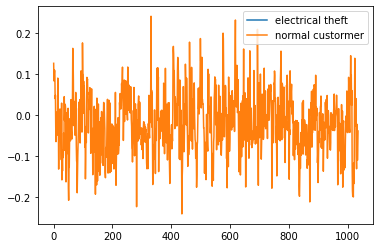

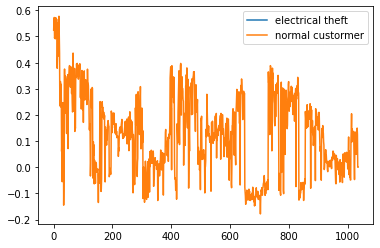

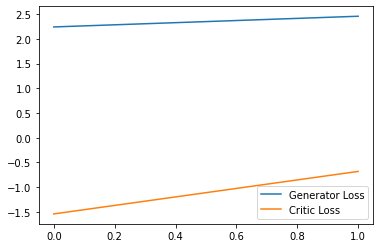

Step 100: Generator loss: 2.758567762374878, critic loss: -0.9613375890254977


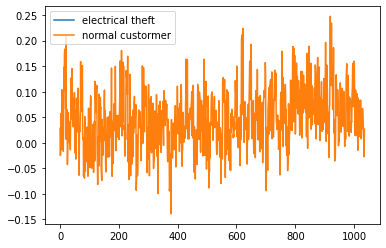

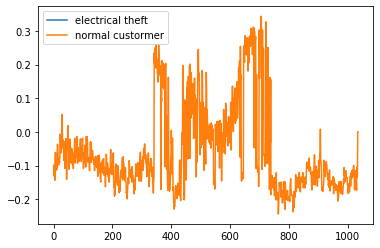

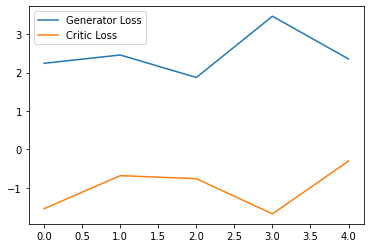

Step 150: Generator loss: 3.198304622173309, critic loss: -1.1113501880168917


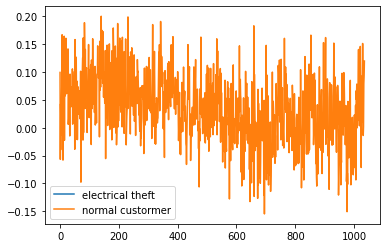

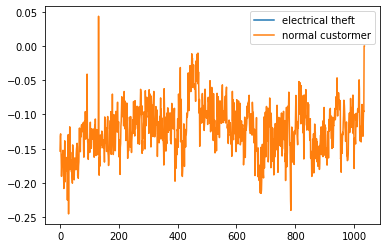

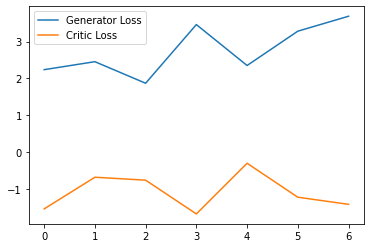

Step 200: Generator loss: 3.583816342353821, critic loss: -0.8012992827296256


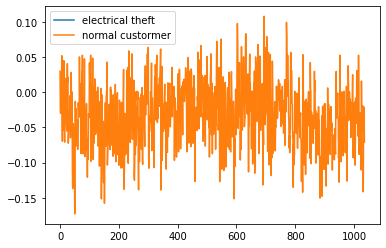

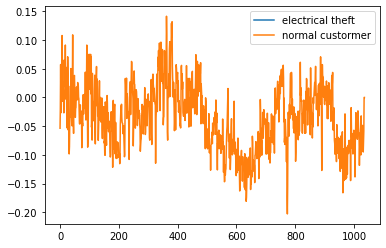

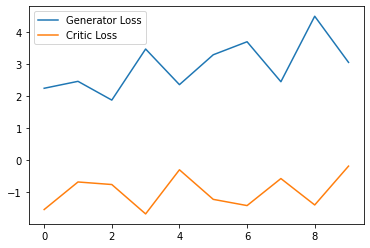

Step 250: Generator loss: 3.461818208694458, critic loss: -0.8432284153103825


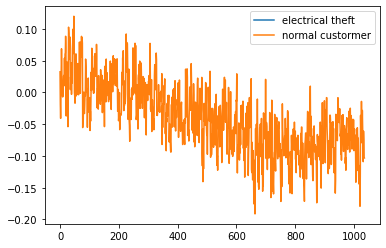

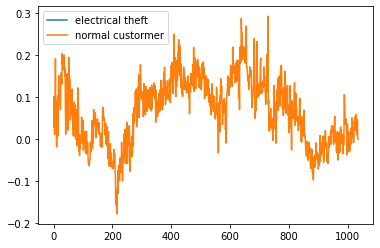

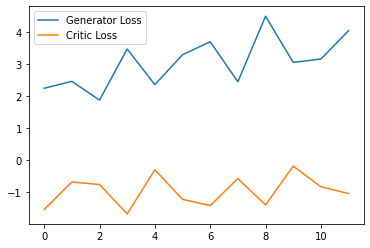

Step 300: Generator loss: 3.961711201667786, critic loss: -0.8524806255996228


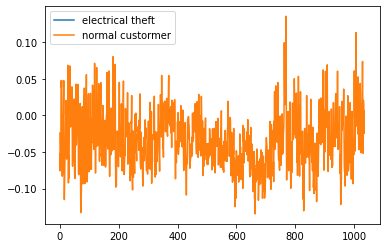

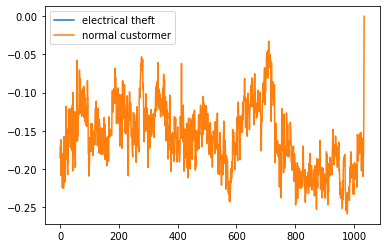

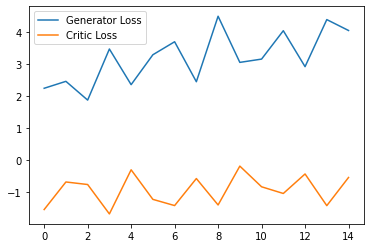

Step 350: Generator loss: 3.658452377319336, critic loss: -0.8052508748471738


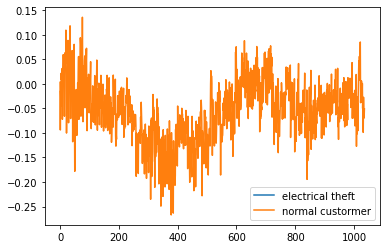

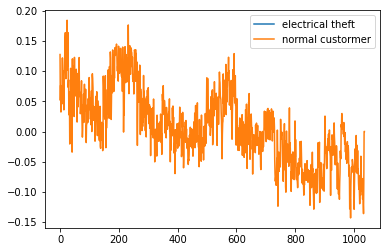

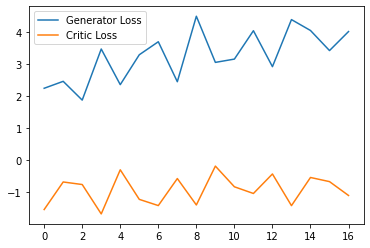

Step 400: Generator loss: 3.7287624883651733, critic loss: -0.6990234452784062


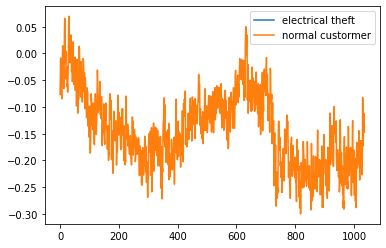

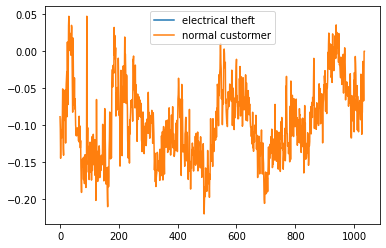

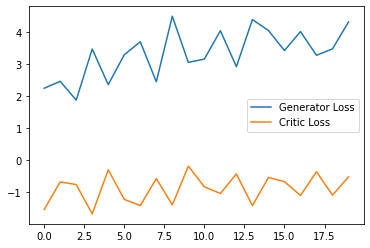

Step 450: Generator loss: 3.703882918357849, critic loss: -0.6789432421028616


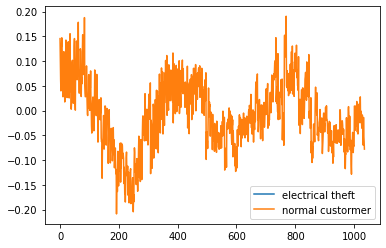

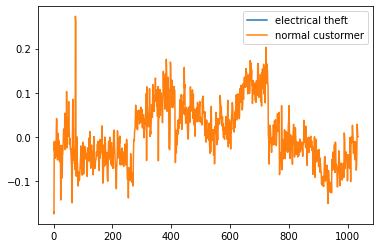

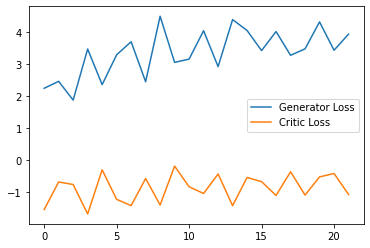

Step 500: Generator loss: 3.843380479812622, critic loss: -0.7970031555593013


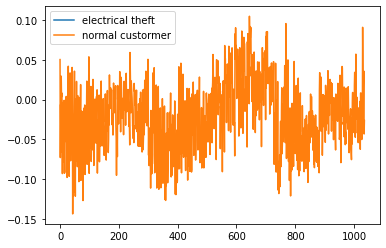

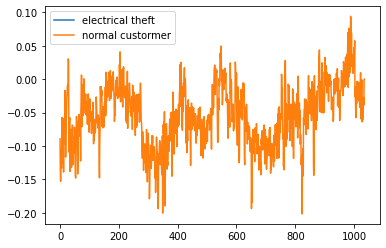

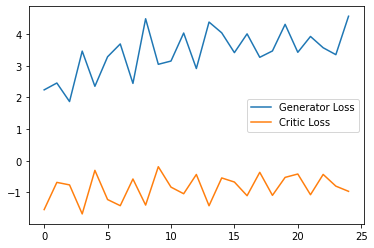

Step 550: Generator loss: 3.6622351694107054, critic loss: -0.7264053067713978


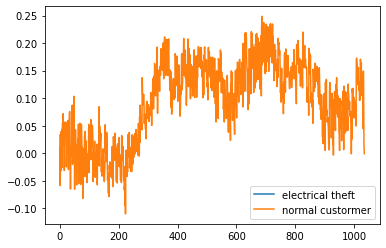

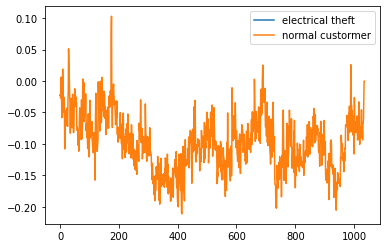

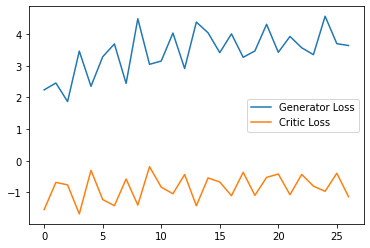

Step 600: Generator loss: 3.23231454372406, critic loss: -0.7136493614017967


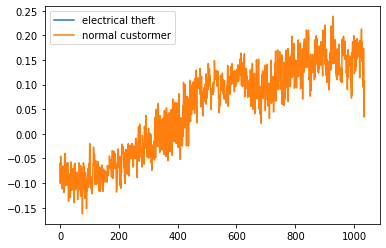

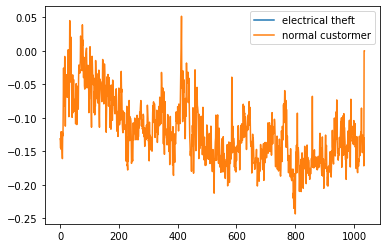

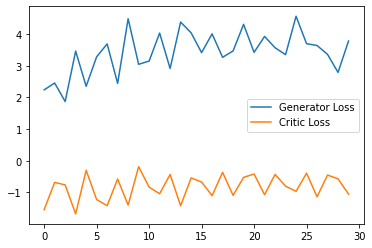

Step 650: Generator loss: 3.600546889305115, critic loss: -0.7711373370885848


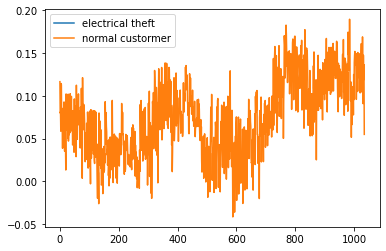

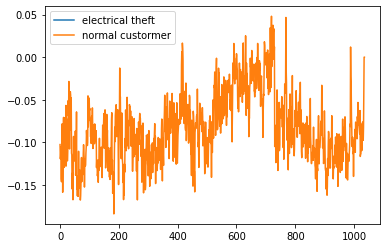

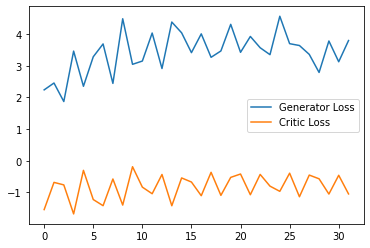

Step 700: Generator loss: 3.4327169609069825, critic loss: -0.8301426705121995


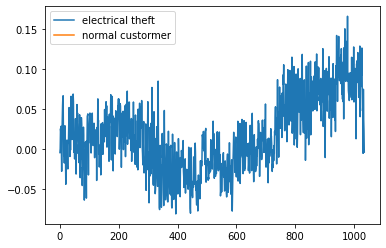

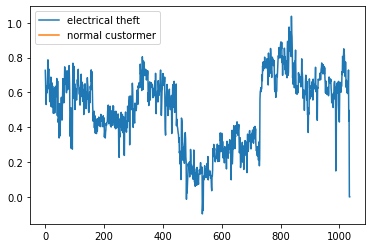

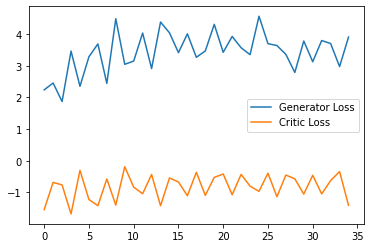

Step 750: Generator loss: 3.918140163421631, critic loss: -0.717739846587181


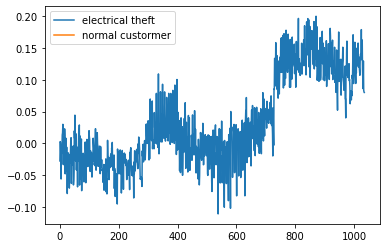

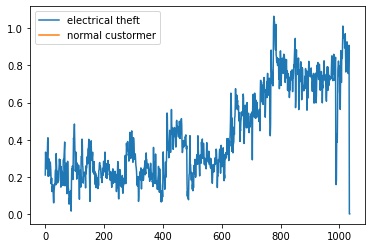

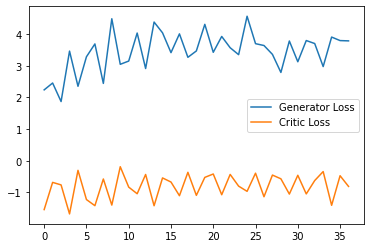

Step 800: Generator loss: 4.030488948822022, critic loss: -0.8473754201531409


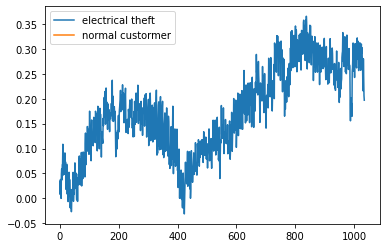

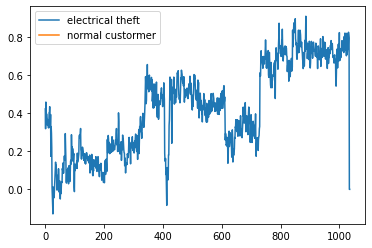

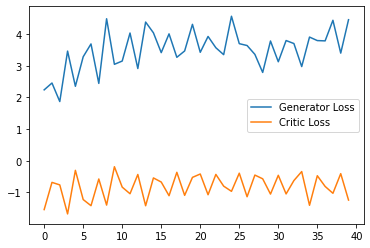

Step 850: Generator loss: 3.0932070446014404, critic loss: -0.6538867336213587


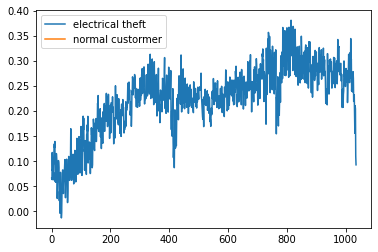

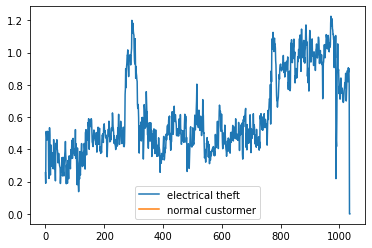

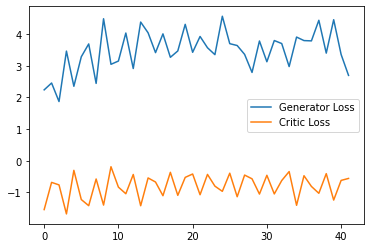

Step 900: Generator loss: 3.944331479072571, critic loss: -0.7920815519988538


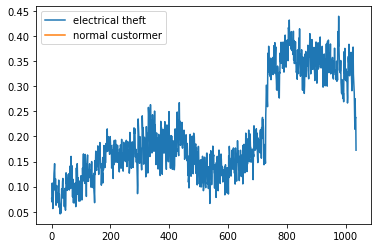

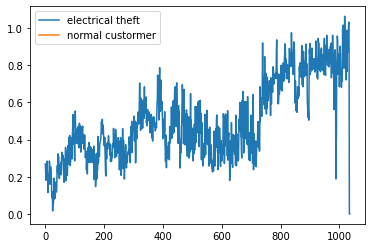

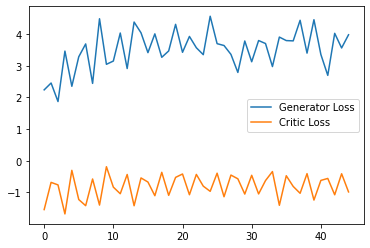

Step 950: Generator loss: 3.5235988664627076, critic loss: -0.7188978137075901


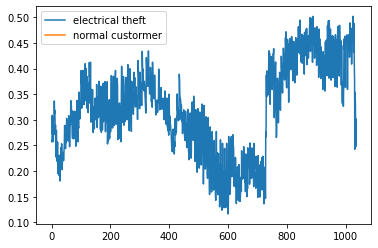

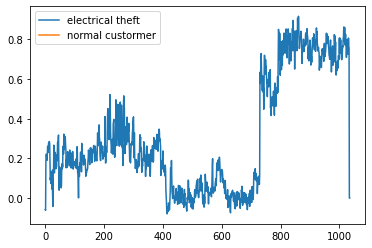

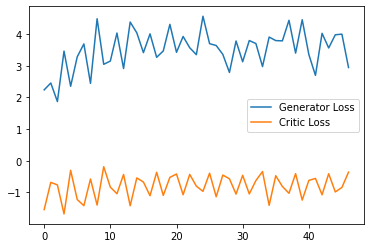

Step 1000: Generator loss: 3.965950164794922, critic loss: -0.8063712968528272


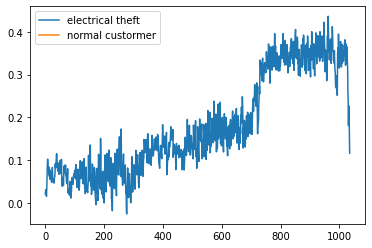

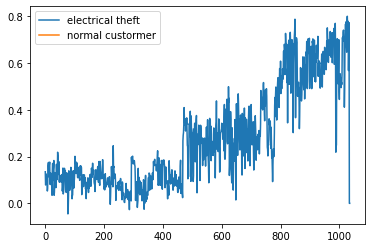

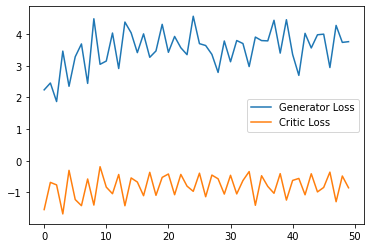

Step 1050: Generator loss: 3.797195944786072, critic loss: -0.7879952064603567


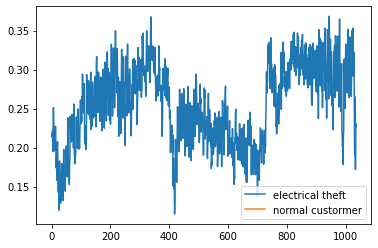

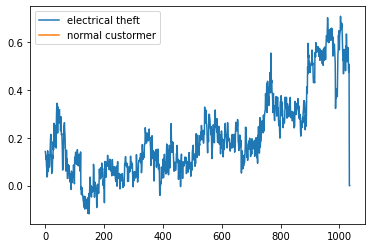

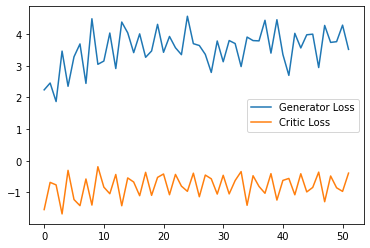

Step 1100: Generator loss: 3.854889235496521, critic loss: -0.8688147120177746


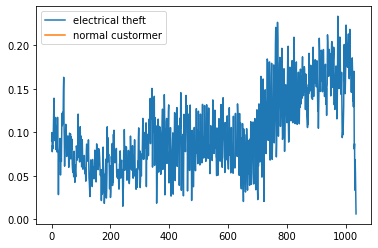

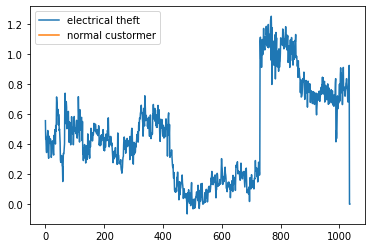

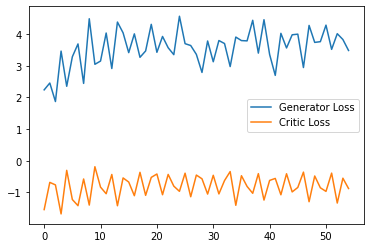

Step 1150: Generator loss: 3.9340998983383177, critic loss: -0.6296980865299703


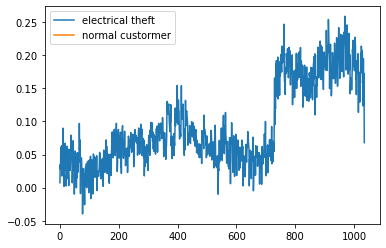

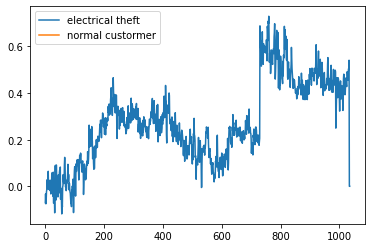

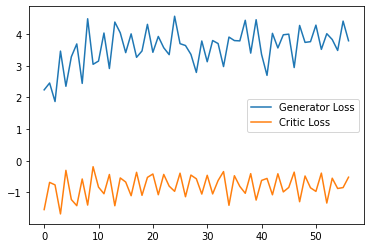

Step 1200: Generator loss: 3.8748221158981324, critic loss: -0.8141355241537096


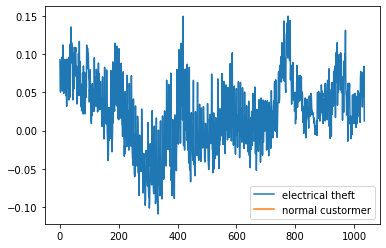

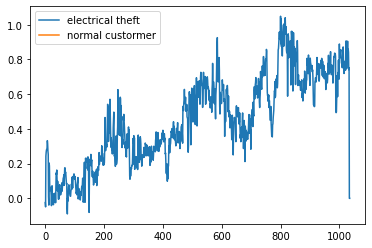

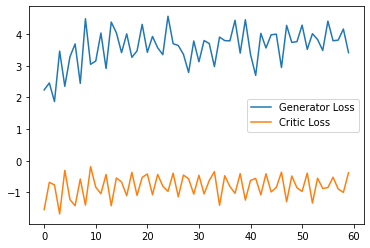

Step 1250: Generator loss: 3.5763903570175173, critic loss: -0.8024524952471258


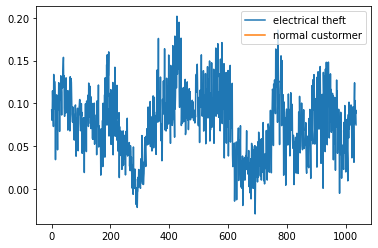

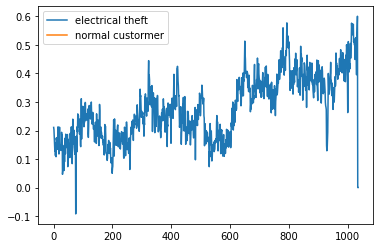

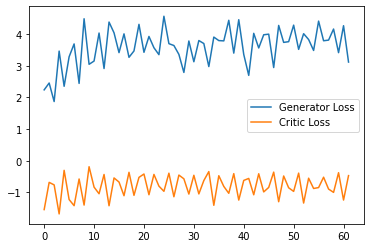

Step 1300: Generator loss: 3.4158367252349855, critic loss: -0.7305729025602341


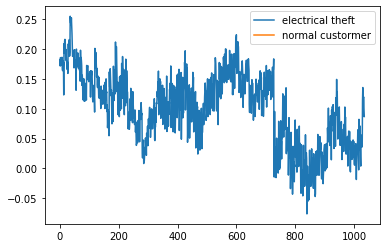

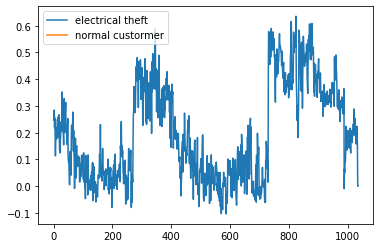

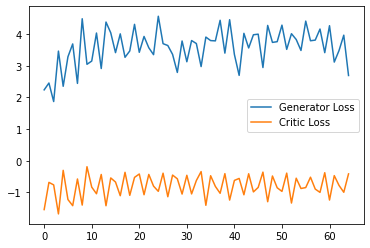

Step 1350: Generator loss: 3.447716722488403, critic loss: -0.8023880664110181


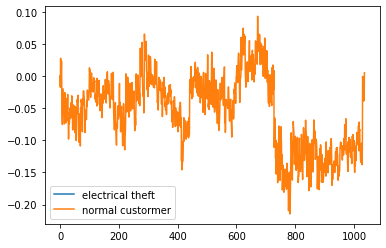

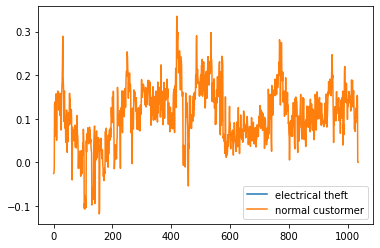

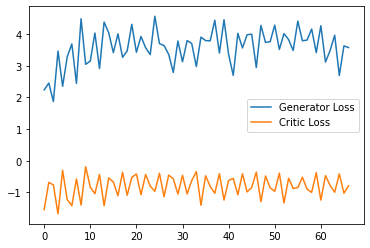

Step 1400: Generator loss: 3.424620351791382, critic loss: -0.8210297402441501


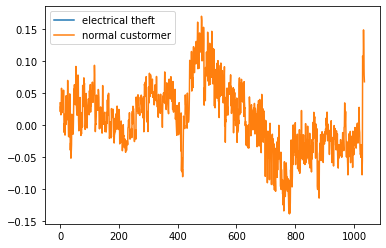

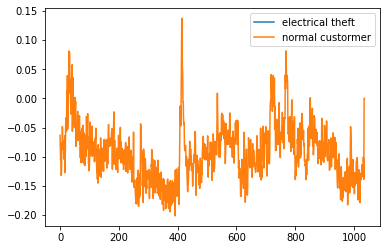

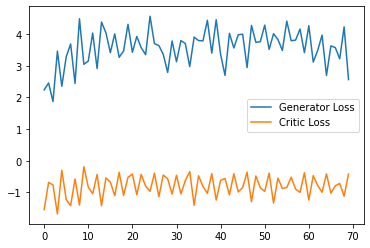

Step 1450: Generator loss: 3.4217467045784, critic loss: -0.6947519261538979


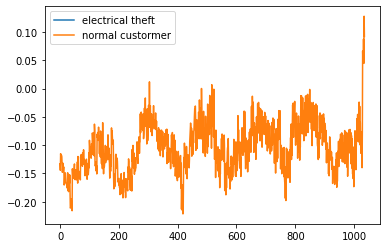

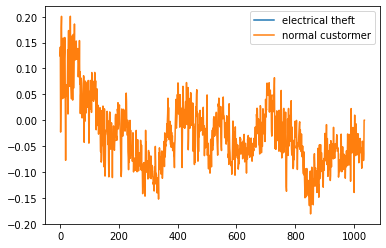

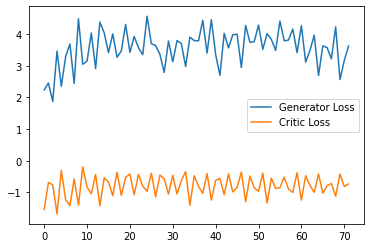

Step 1500: Generator loss: 3.712368450164795, critic loss: -0.8218923313617704


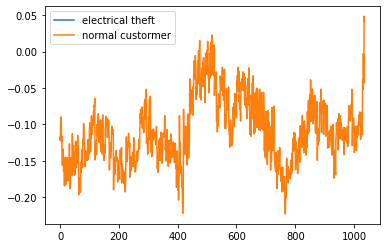

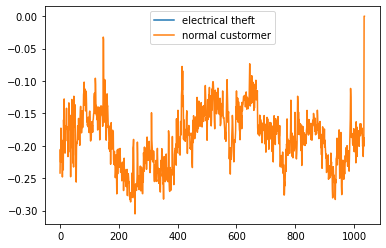

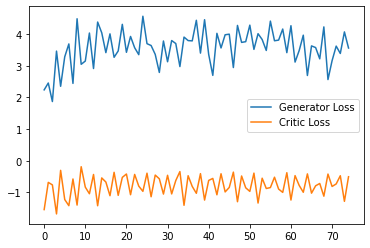

Step 1550: Generator loss: 3.427002663612366, critic loss: -0.646846034437418


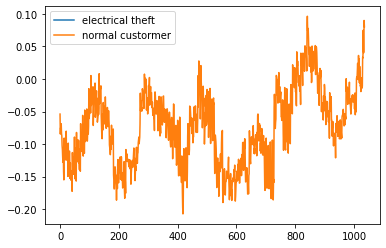

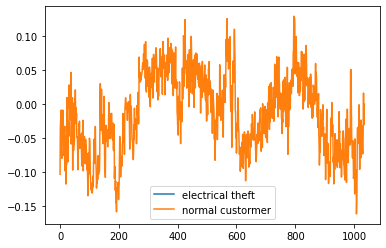

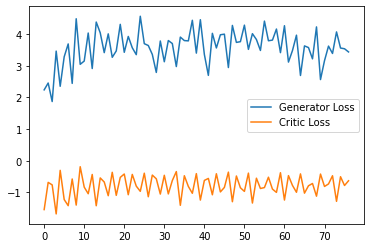

Step 1600: Generator loss: 3.378716917037964, critic loss: -0.6987766634821888


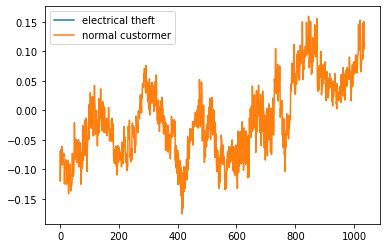

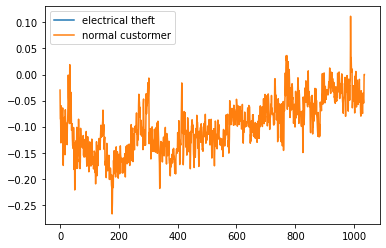

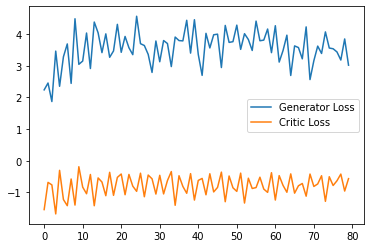

Step 1650: Generator loss: 3.5837091588974, critic loss: -0.6615218611955642


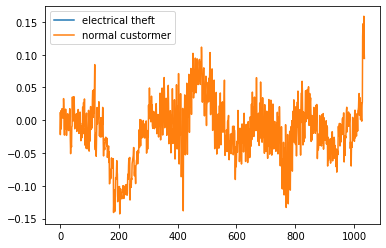

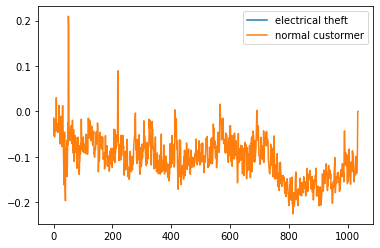

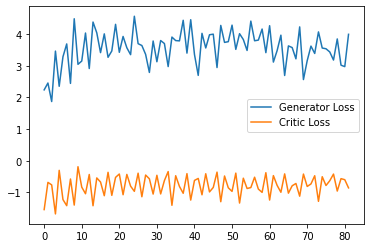

Step 1700: Generator loss: 4.128897304534912, critic loss: -0.7655806470811366


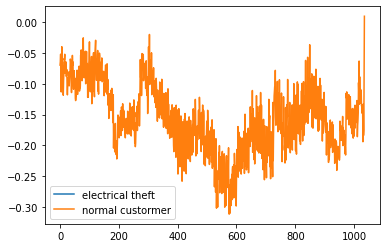

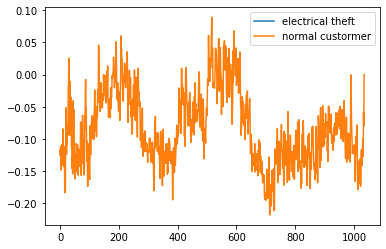

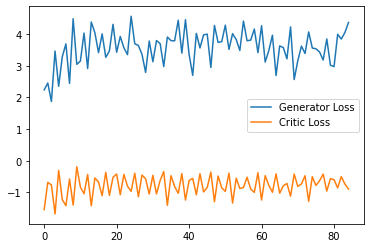

Step 1750: Generator loss: 4.084403777122498, critic loss: -0.7756044709086423


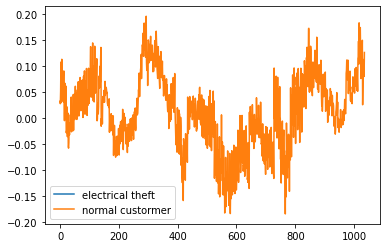

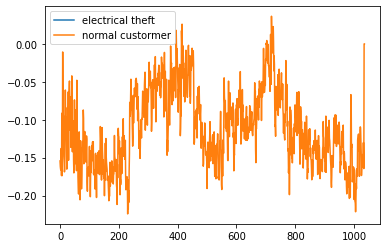

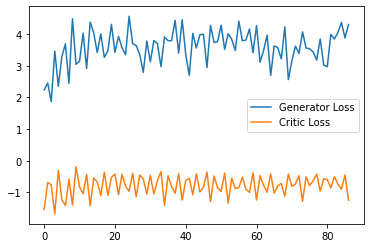

Step 1800: Generator loss: 3.6550899171829223, critic loss: -0.702766756862402


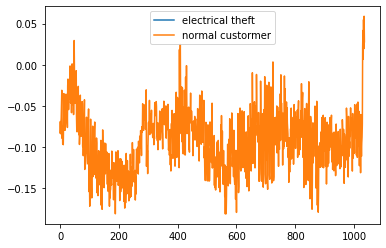

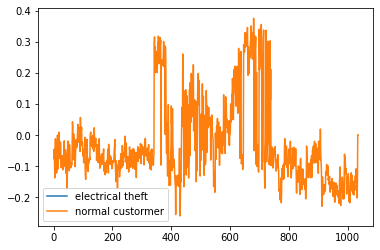

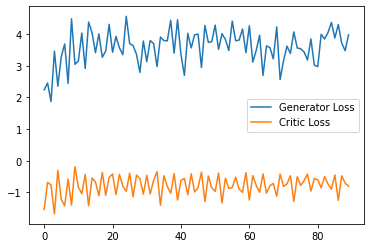

Step 1850: Generator loss: 3.7168019151687623, critic loss: -0.8156715756654742


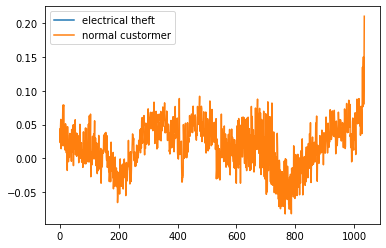

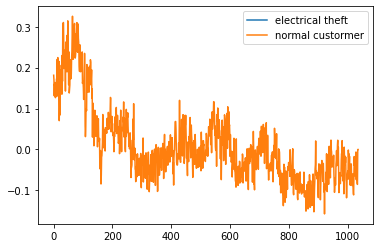

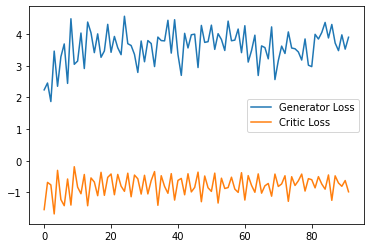

Step 1900: Generator loss: 3.5193669843673705, critic loss: -0.7133683454394343


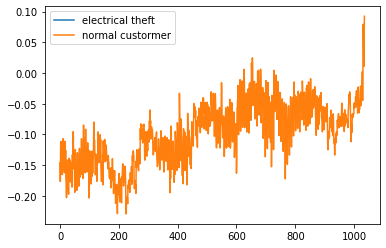

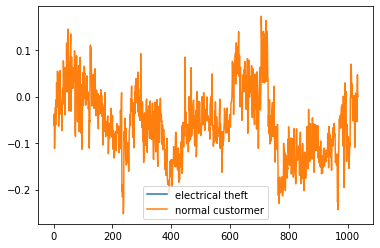

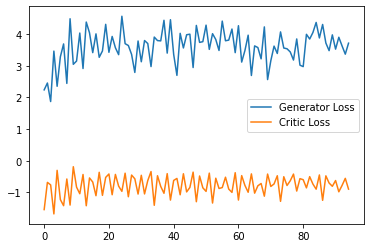

Step 1950: Generator loss: 3.238859119415283, critic loss: -0.6826807941794394


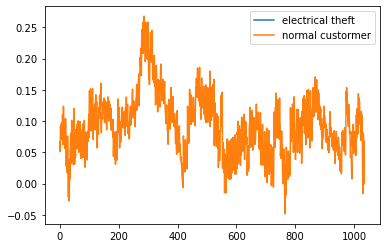

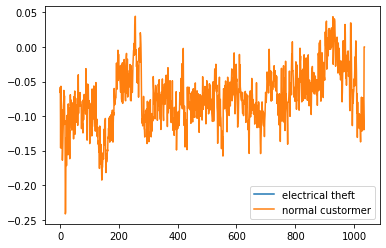

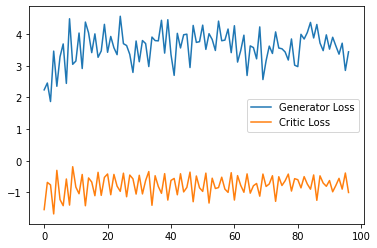

Step 2000: Generator loss: 3.4882860231399535, critic loss: -0.7489827969968319


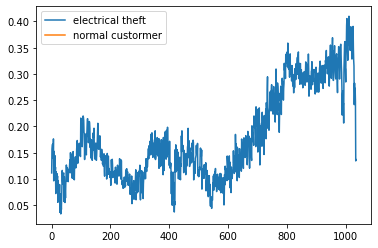

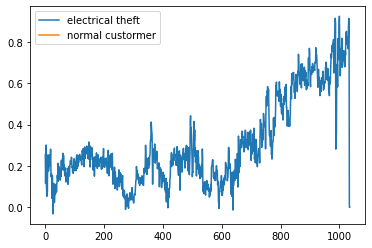

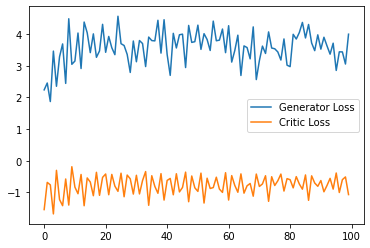

Step 2050: Generator loss: 3.5531132411956787, critic loss: -0.6903434596955778


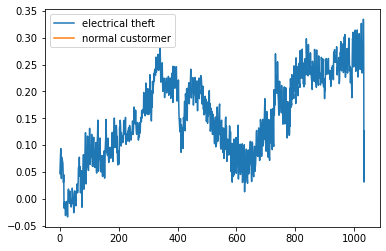

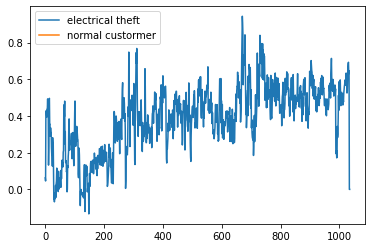

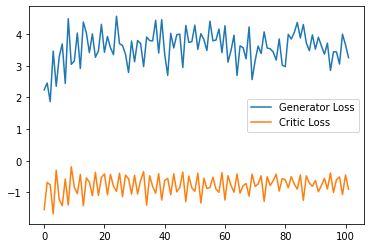

Step 2100: Generator loss: 3.585737042427063, critic loss: -0.7399857379198075


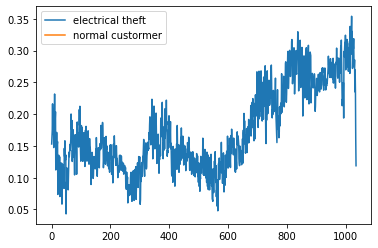

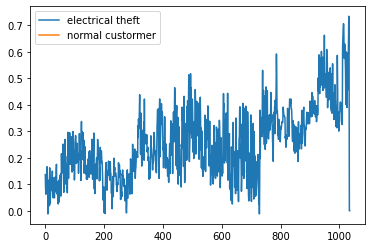

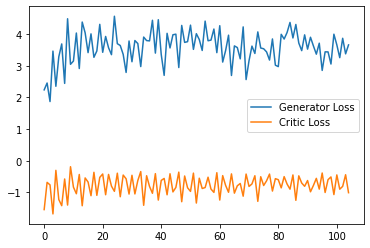

Step 2150: Generator loss: 3.5118981266021727, critic loss: -0.6303178640007973


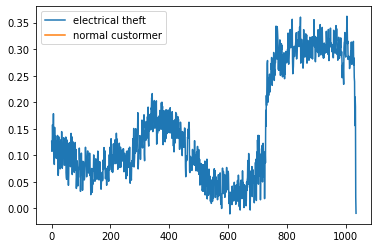

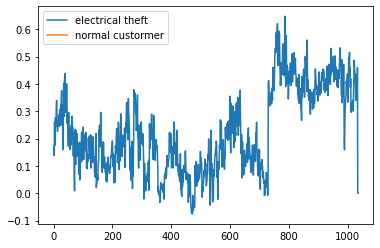

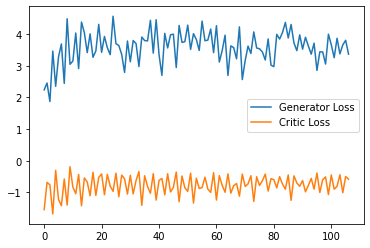

Step 2200: Generator loss: 3.25006667137146, critic loss: -0.6233841176033018


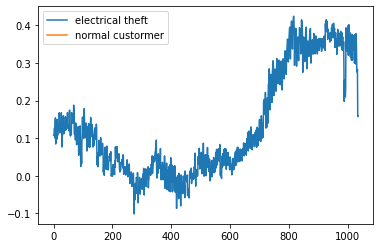

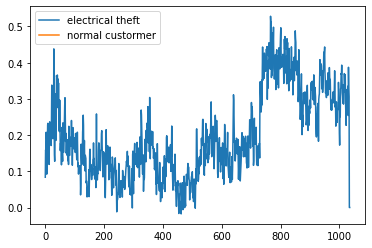

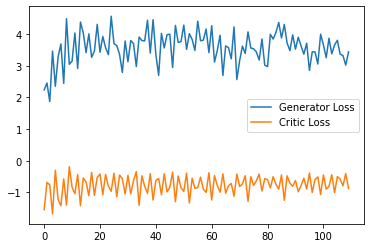

Step 2250: Generator loss: 3.3414918041229247, critic loss: -0.800346906006336


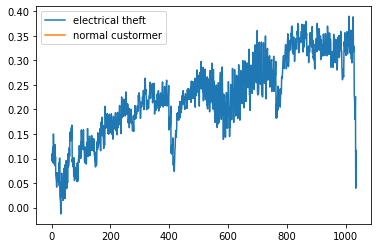

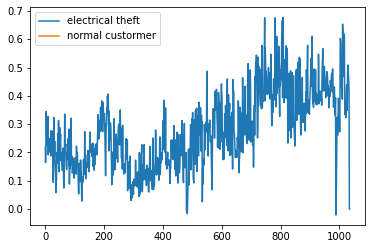

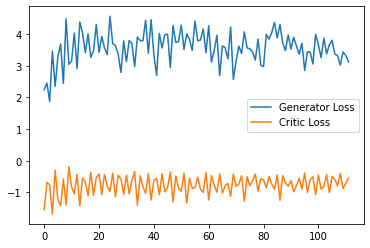

Step 2300: Generator loss: 3.394519240856171, critic loss: -0.7321615089774131


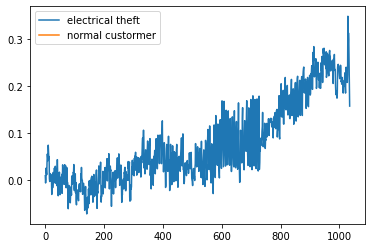

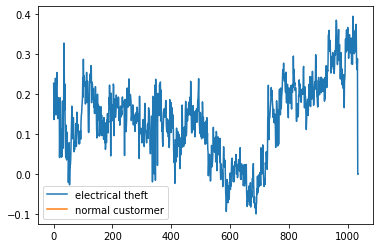

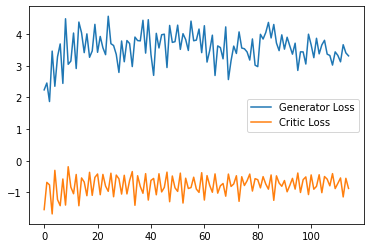

Step 2350: Generator loss: 3.401917371749878, critic loss: -0.6492754638195037


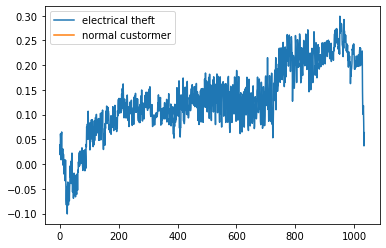

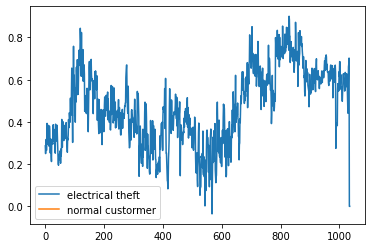

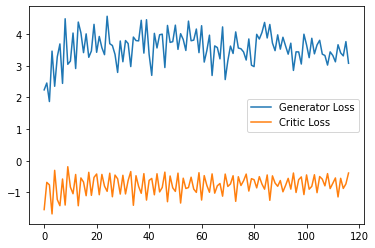

Step 2400: Generator loss: 3.3004995822906493, critic loss: -0.7334591447710993


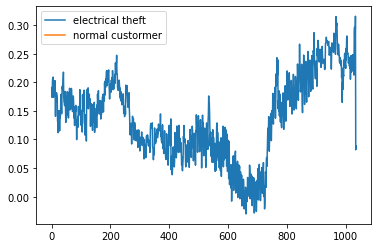

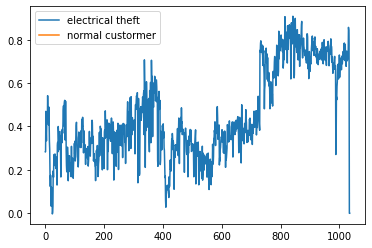

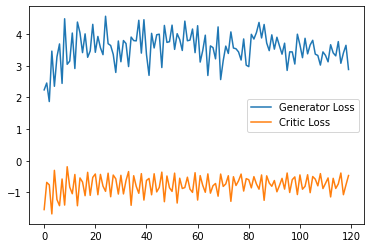

Step 2450: Generator loss: 3.1296889066696165, critic loss: -0.7227250943779944


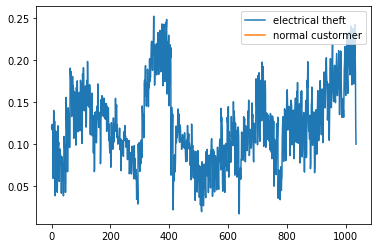

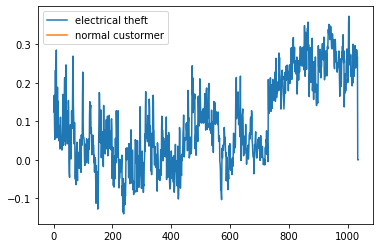

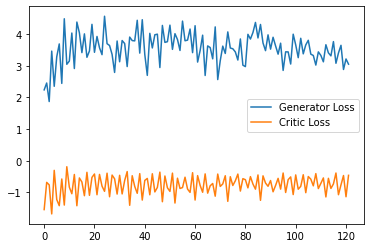

Step 2500: Generator loss: 2.8707543325424196, critic loss: -0.6754255450963973


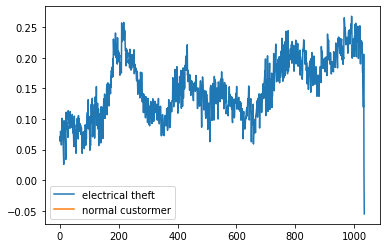

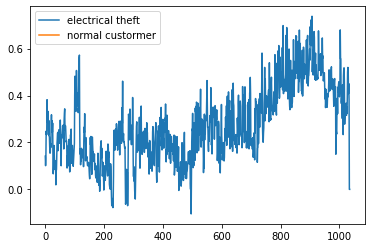

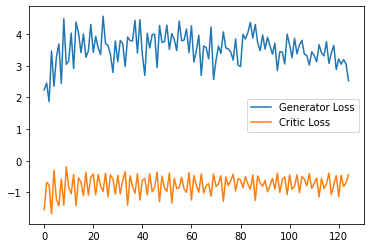

Step 2550: Generator loss: 2.9862336039543154, critic loss: -0.7057307659387589


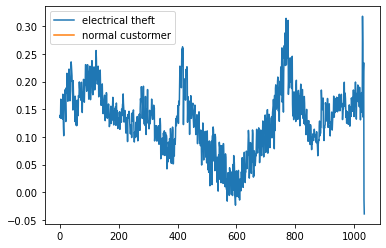

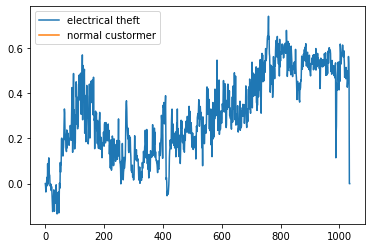

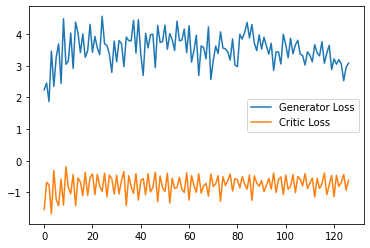

Step 2600: Generator loss: 2.821824718117714, critic loss: -0.7096387740075588


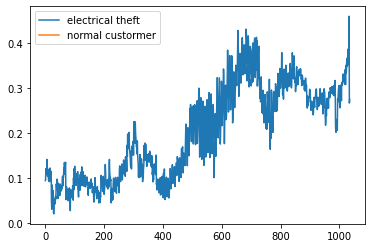

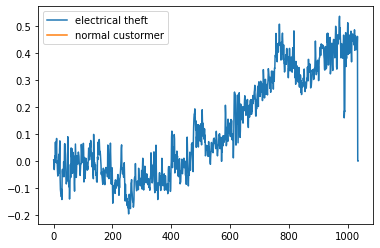

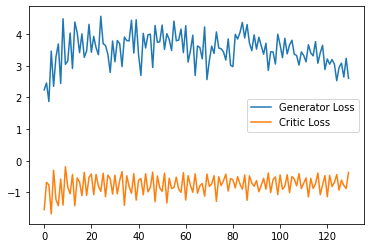

Step 2650: Generator loss: 2.7303018093109133, critic loss: -0.6673346047401426


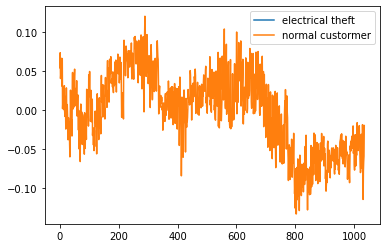

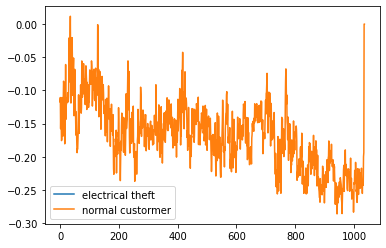

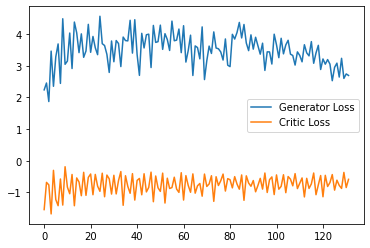

Step 2700: Generator loss: 3.0778297424316405, critic loss: -0.7155109713971614


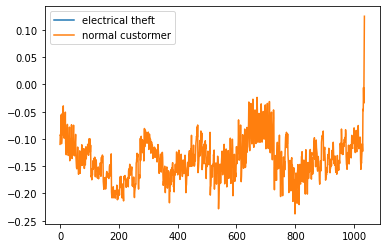

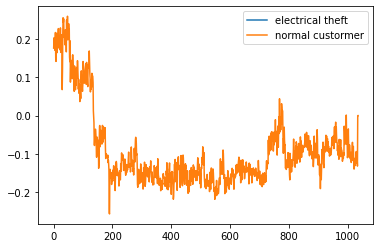

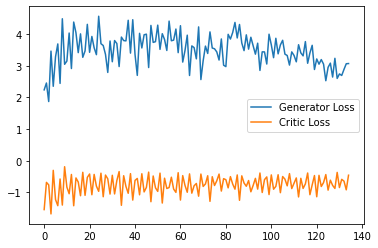

Step 2750: Generator loss: 3.0331761598587037, critic loss: -0.6862785736322401


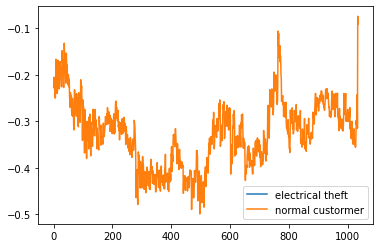

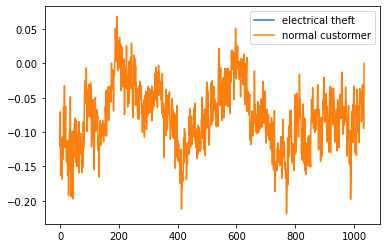

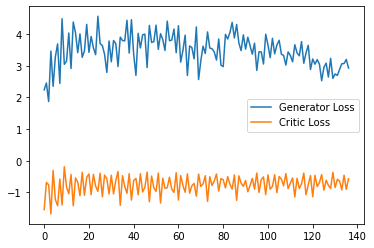

Step 2800: Generator loss: 3.437325553894043, critic loss: -0.8023164282143118


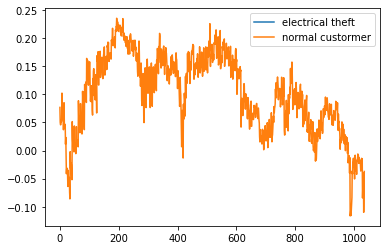

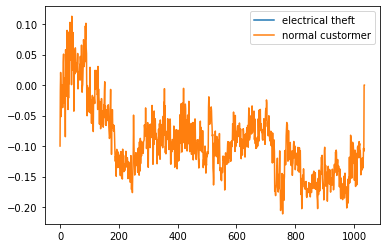

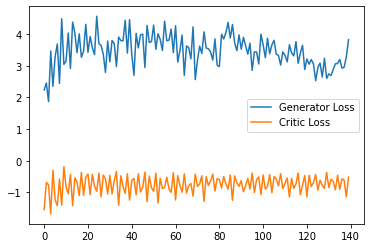

Step 2850: Generator loss: 3.4530095624923707, critic loss: -0.7458111114501953


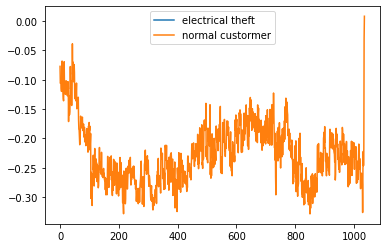

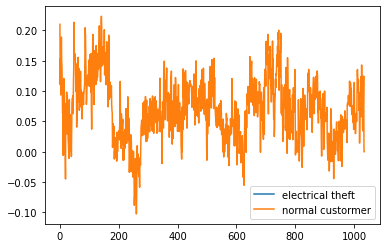

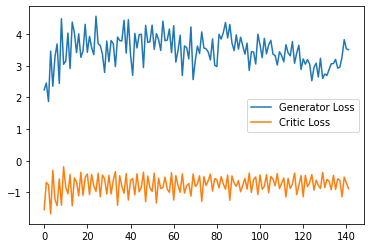

Step 2900: Generator loss: 3.355504961013794, critic loss: -0.6380417862832547


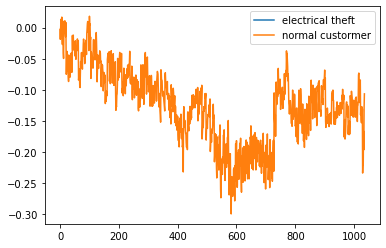

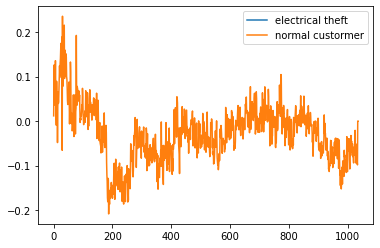

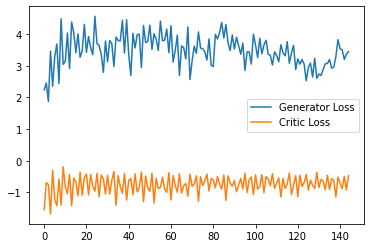

Step 2950: Generator loss: 3.323653678894043, critic loss: -0.7029933159351347


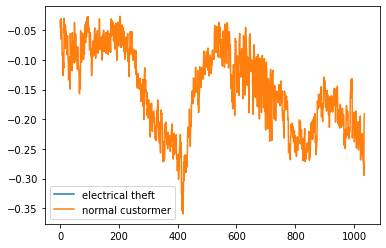

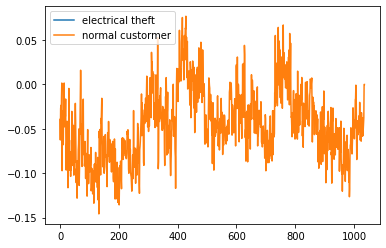

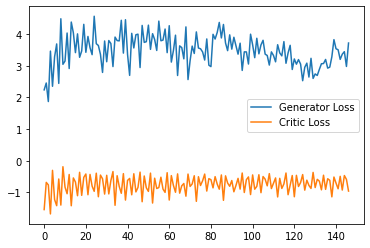

Step 3000: Generator loss: 3.170219180583954, critic loss: -0.6687870355844495


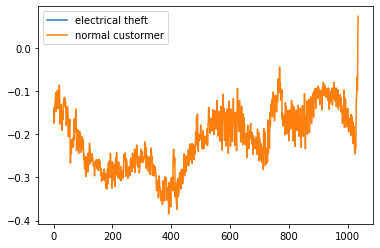

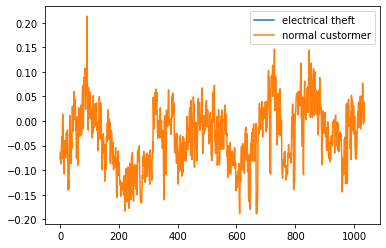

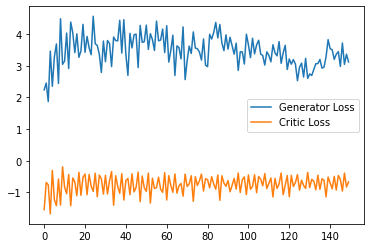

Step 3050: Generator loss: 3.3035638904571534, critic loss: -0.6316079151034356


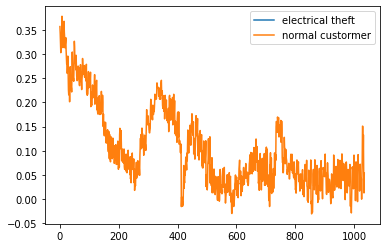

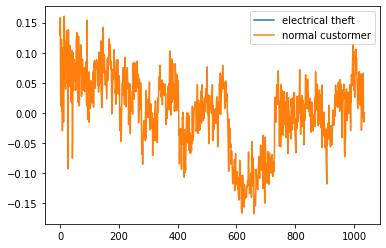

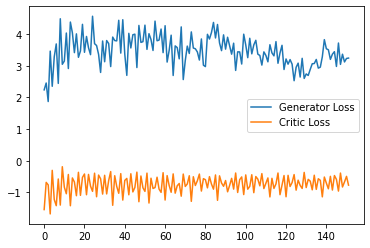

Step 3100: Generator loss: 3.3212631702423097, critic loss: -0.7146733762323856


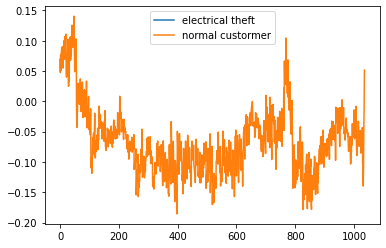

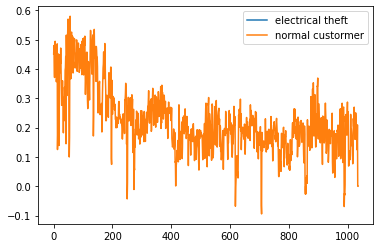

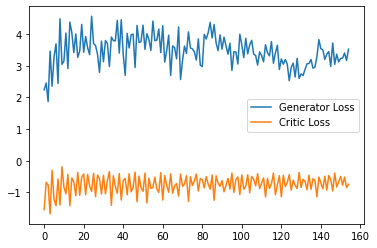

Step 3150: Generator loss: 3.3171660566329955, critic loss: -0.6633671104013921


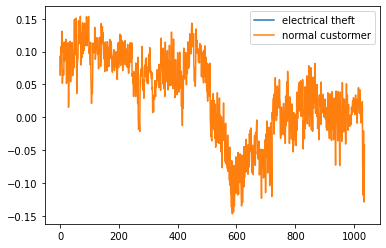

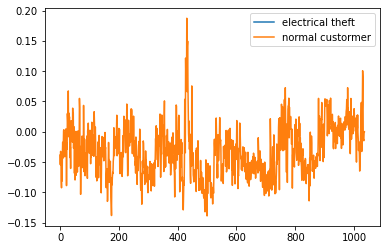

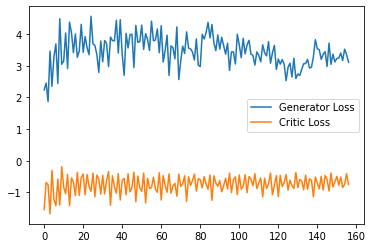

Step 3200: Generator loss: 3.415652937889099, critic loss: -0.6578914222717285


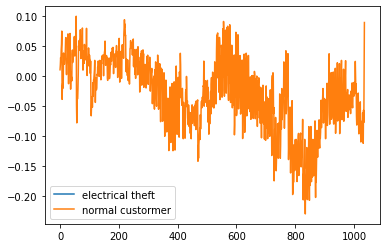

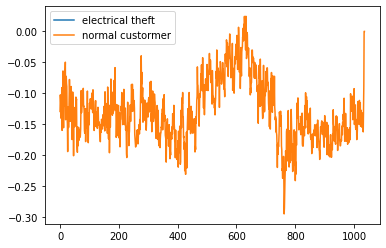

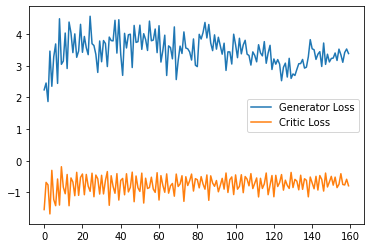

Step 3250: Generator loss: 3.5285625505447387, critic loss: -0.64407137966156


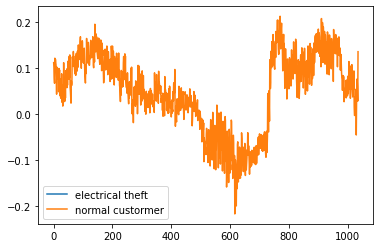

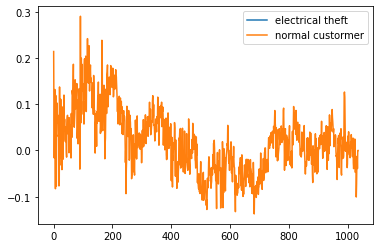

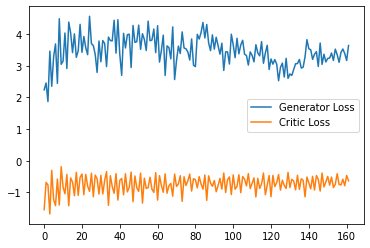

Step 3300: Generator loss: 3.3430290985107423, critic loss: -0.6556854634881019


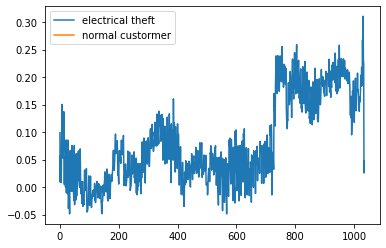

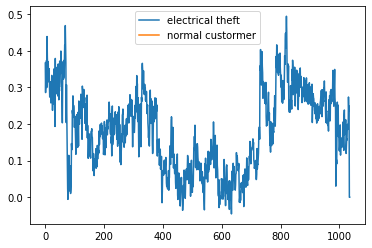

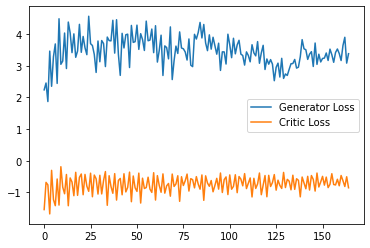

Step 3350: Generator loss: 3.478322055339813, critic loss: -0.7089648706912993


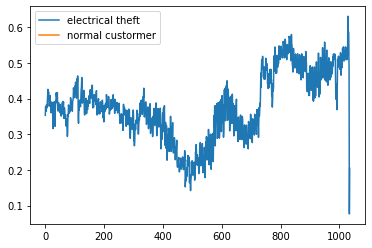

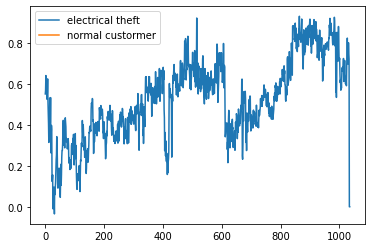

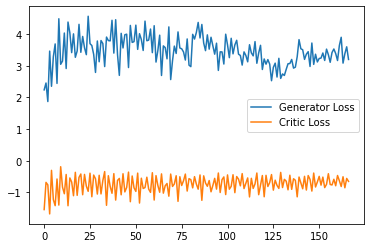

Step 3400: Generator loss: 3.144701008796692, critic loss: -0.6123819472938776


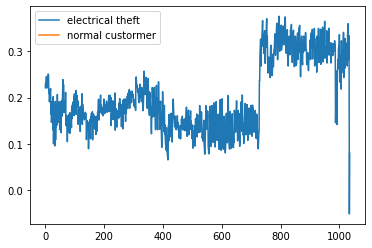

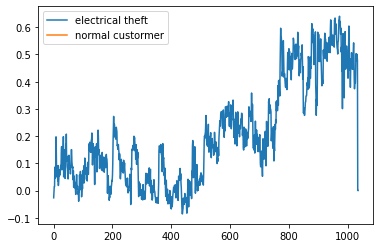

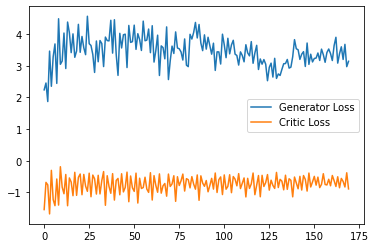

Step 3450: Generator loss: 2.685166175365448, critic loss: -0.6446891040802002


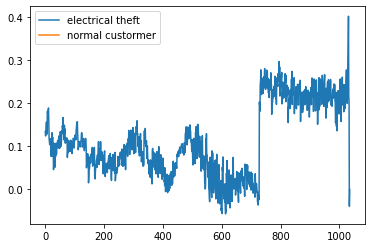

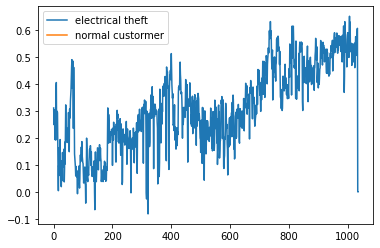

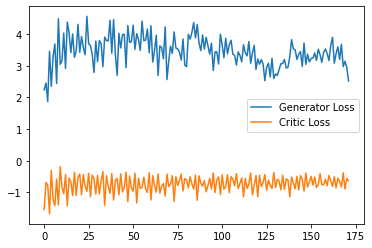

Step 3500: Generator loss: 2.7608068704605104, critic loss: -0.7352365806400775


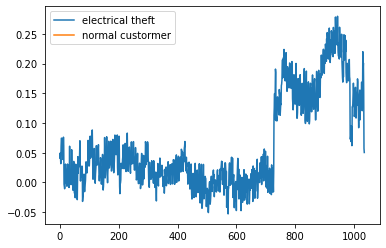

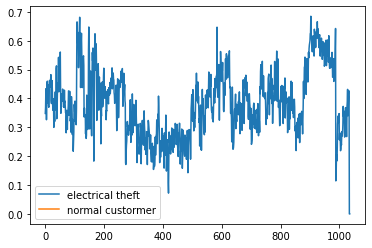

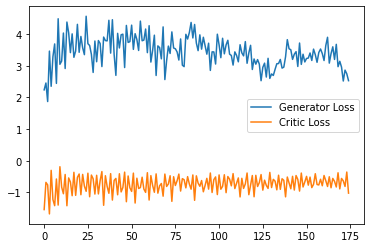

Step 3550: Generator loss: 3.0306565284729006, critic loss: -0.6160591884851456


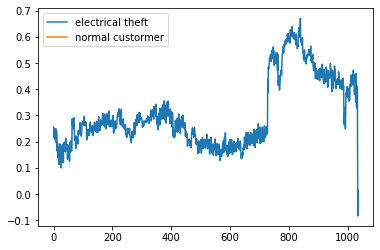

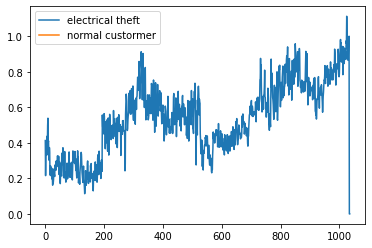

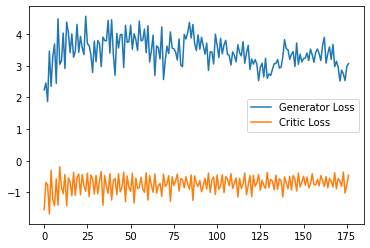

Step 3600: Generator loss: 2.8447804713249205, critic loss: -0.6104516653120516


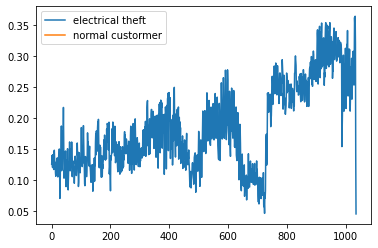

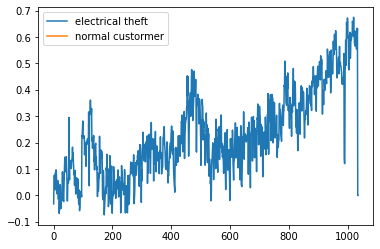

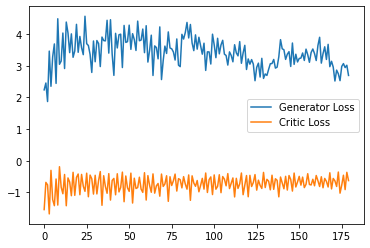

Step 3650: Generator loss: 2.914063115119934, critic loss: -0.5968298917859793


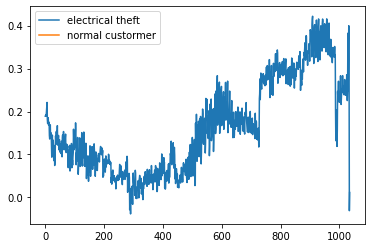

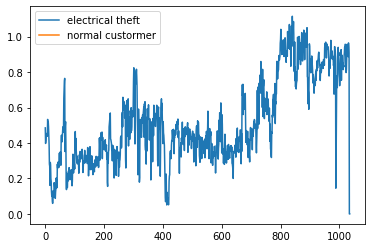

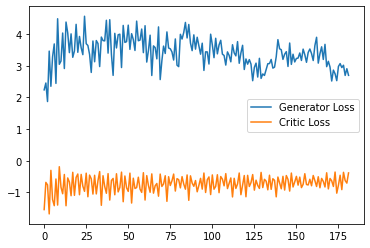

Step 3700: Generator loss: 2.587481527328491, critic loss: -0.5768621786832807


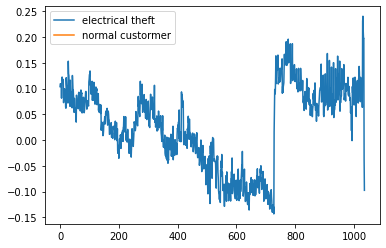

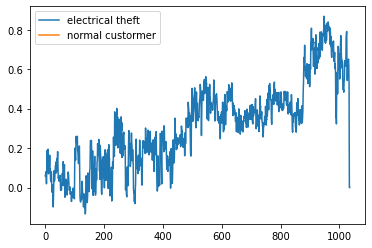

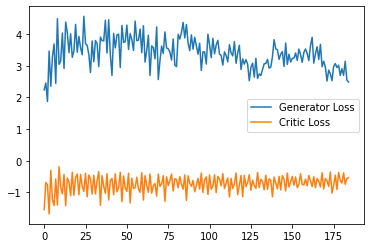

Step 3750: Generator loss: 2.2785963559150697, critic loss: -0.6257573335021734


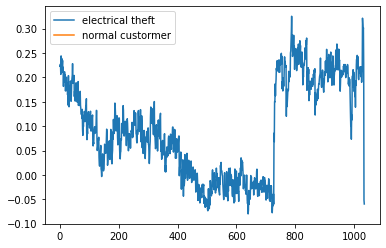

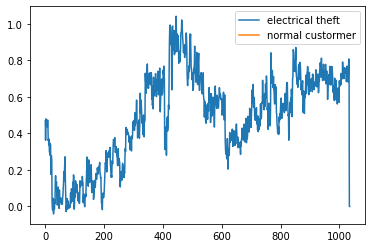

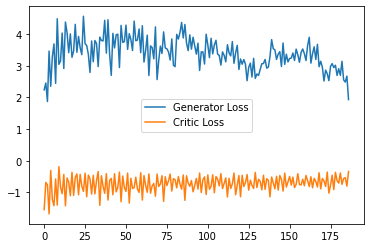

Step 3800: Generator loss: 2.838406512737274, critic loss: -0.6267916960418224


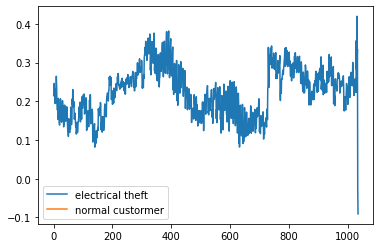

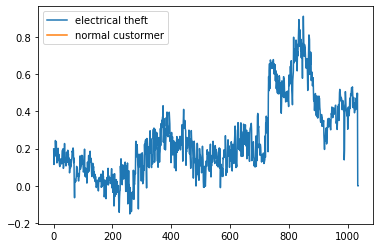

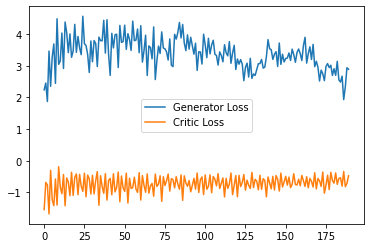

Step 3850: Generator loss: 2.804688220024109, critic loss: -0.562032928019762


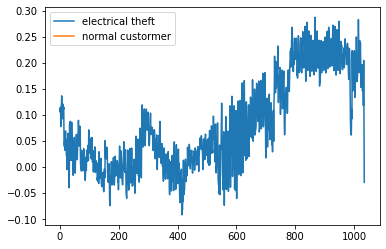

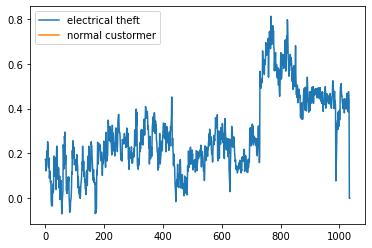

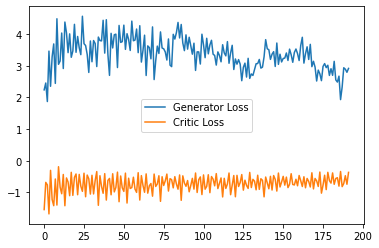

Step 3900: Generator loss: 3.156818833351135, critic loss: -0.6386569714248178


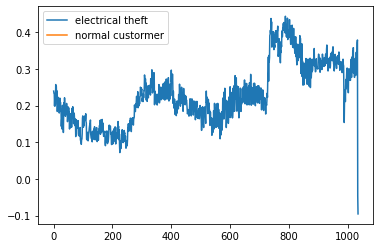

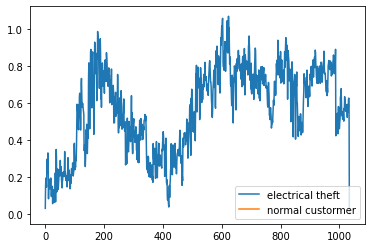

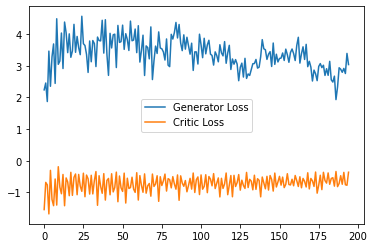

Step 3950: Generator loss: 3.3458915042877195, critic loss: -0.654166908800602


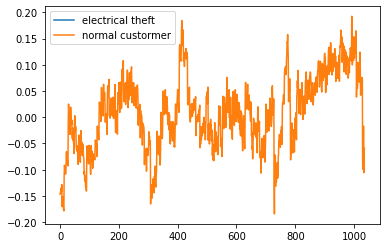

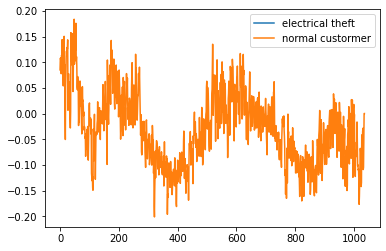

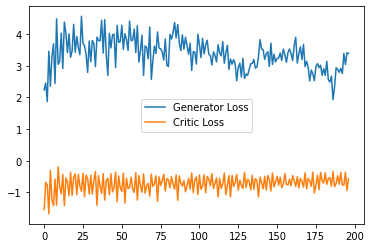

Step 4000: Generator loss: 3.4260878467559817, critic loss: -0.6690076925754547


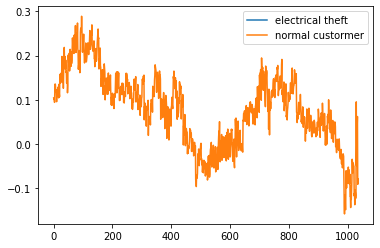

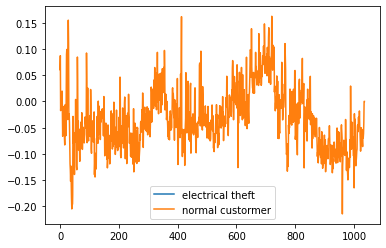

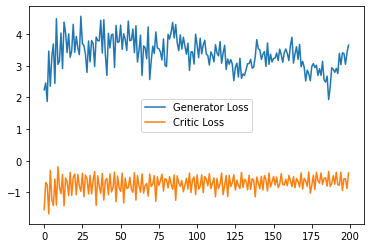

Step 4050: Generator loss: 3.1254504561424254, critic loss: -0.6614844470918178


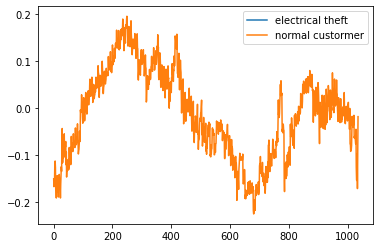

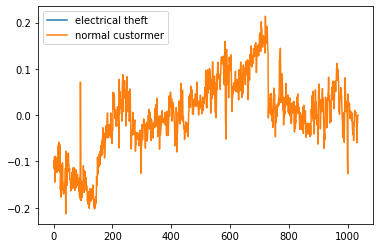

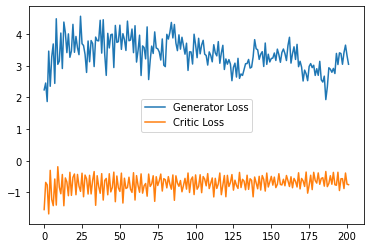

Step 4100: Generator loss: 3.118659634590149, critic loss: -0.5943229915350673


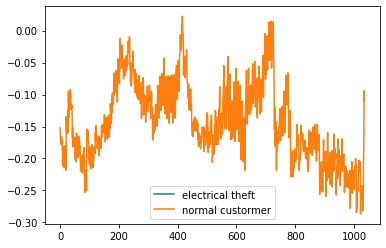

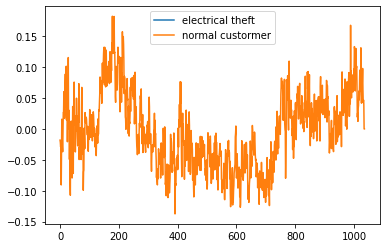

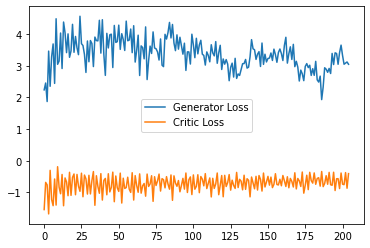

Step 4150: Generator loss: 2.977571930885315, critic loss: -0.6677166268080473


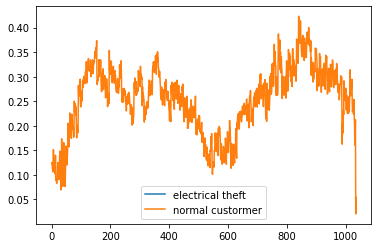

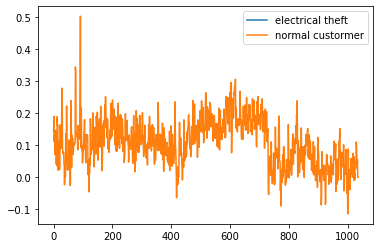

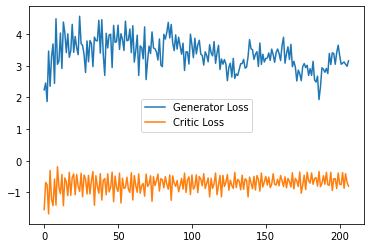

Step 4200: Generator loss: 3.002158136367798, critic loss: -0.642622633472085


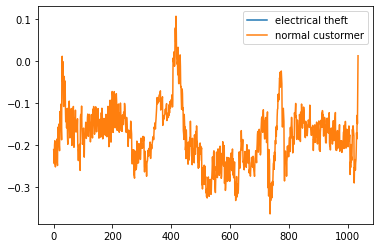

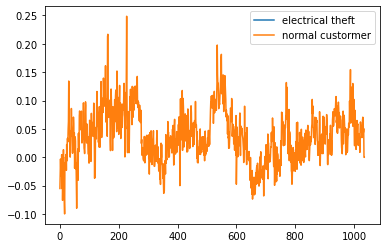

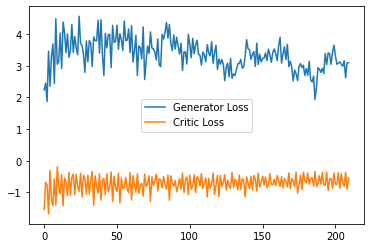

Step 4250: Generator loss: 2.7264749866724016, critic loss: -0.6909240642338991


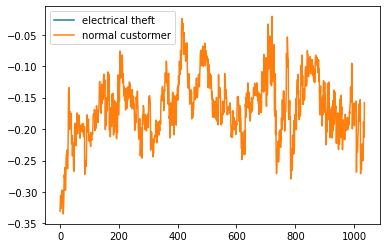

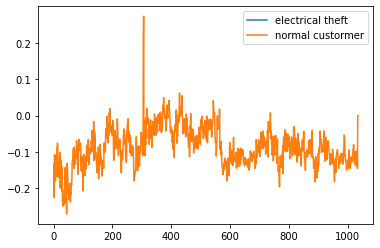

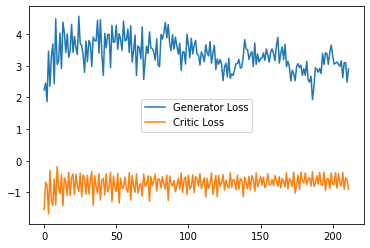

Step 4300: Generator loss: 2.586415243148804, critic loss: -0.6252568211406468


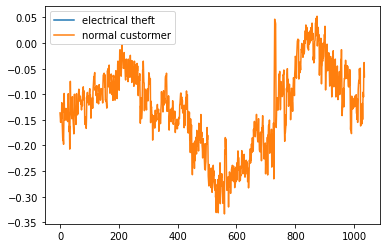

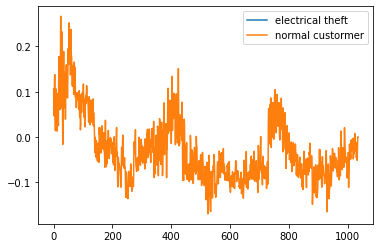

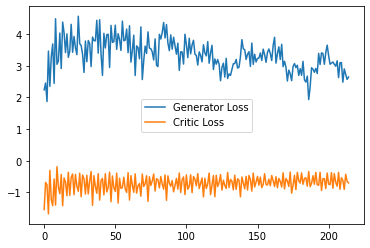

Step 4350: Generator loss: 2.6449068450927733, critic loss: -0.6221634956598282


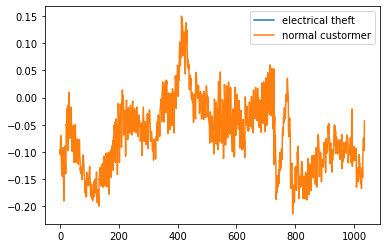

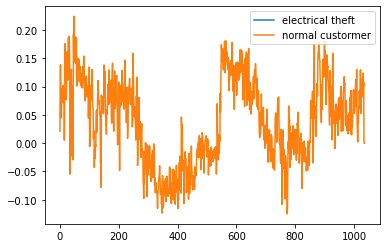

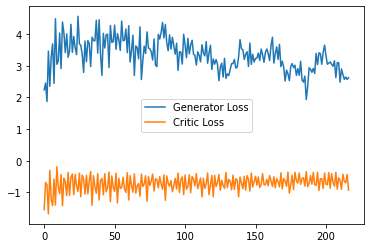

Step 4400: Generator loss: 2.6067235469818115, critic loss: -0.5446284822821617


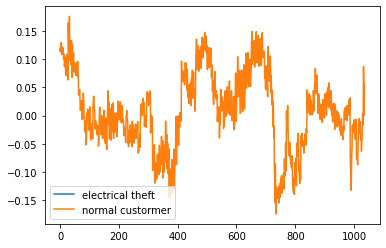

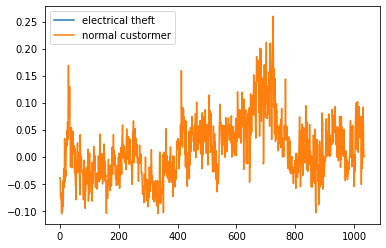

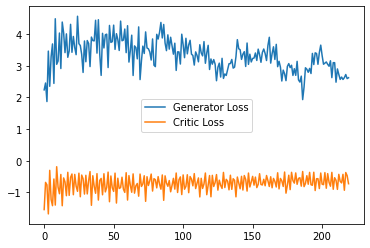

Step 4450: Generator loss: 2.6858846855163576, critic loss: -0.6810642104148864


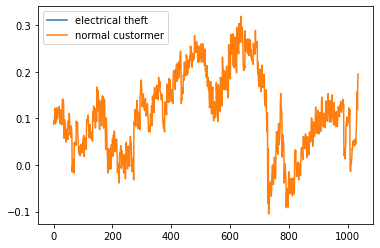

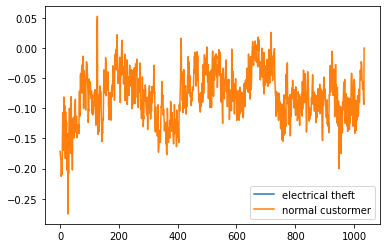

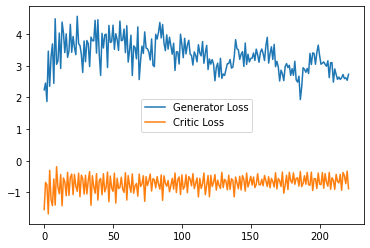

Step 4500: Generator loss: 2.8494031620025635, critic loss: -0.6912580711245537


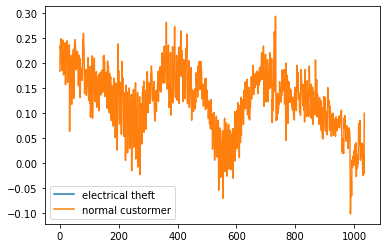

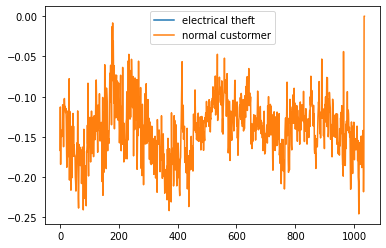

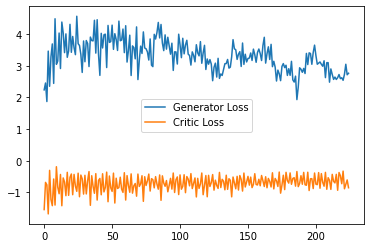

Step 4550: Generator loss: 2.6653382420539855, critic loss: -0.6656237104237078


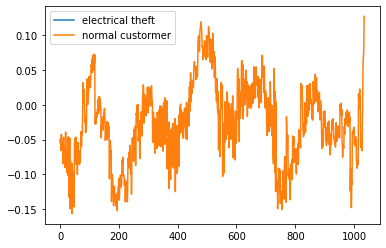

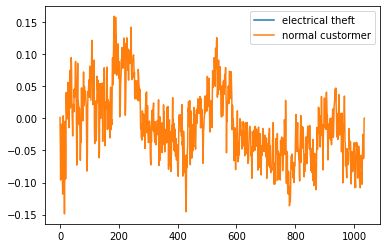

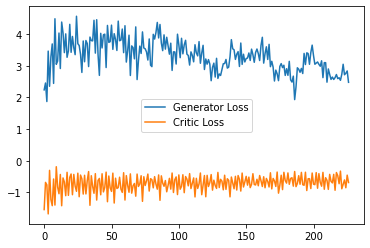

Step 4600: Generator loss: 3.139551010131836, critic loss: -0.7006445626616479


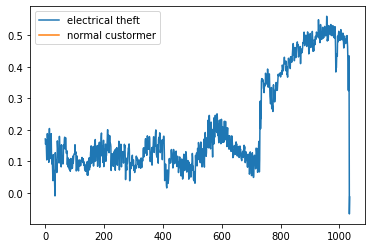

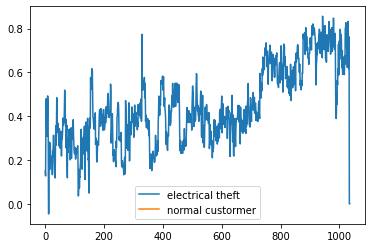

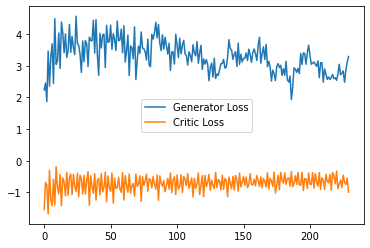

Step 4650: Generator loss: 3.0736838293075563, critic loss: -0.6433406546264887


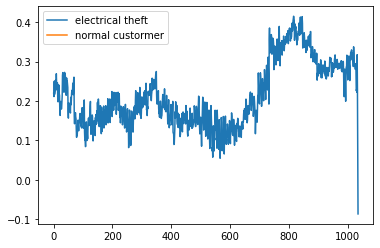

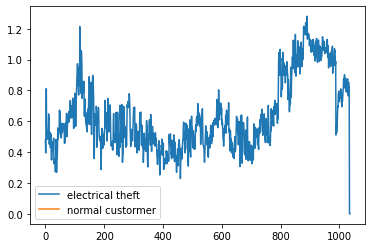

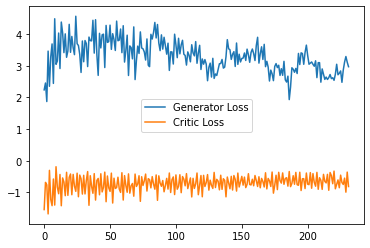

Step 4700: Generator loss: 2.868195128440857, critic loss: -0.7003816045224669


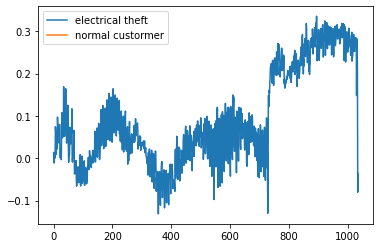

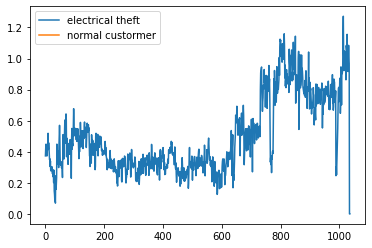

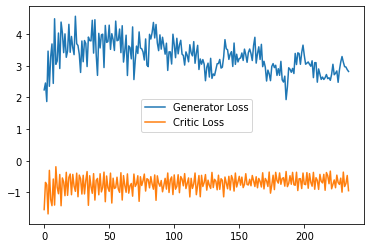

Step 4750: Generator loss: 2.872498564720154, critic loss: -0.5928322030752897


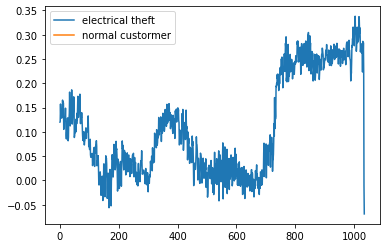

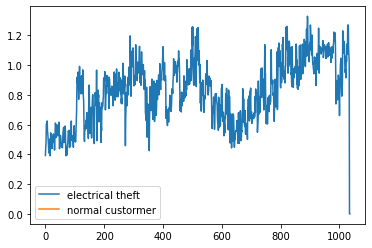

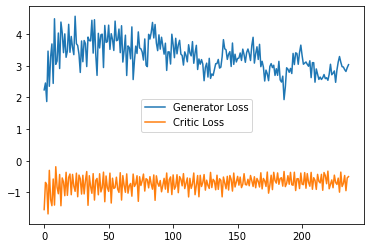

Step 4800: Generator loss: 2.6003745579719544, critic loss: -0.6735077627897263


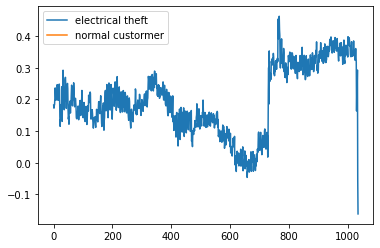

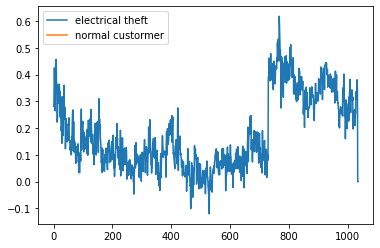

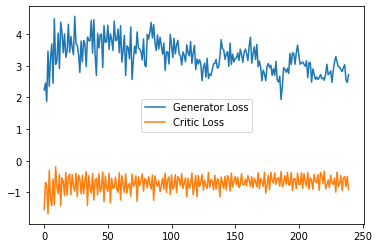

Step 4850: Generator loss: 2.659565279483795, critic loss: -0.5695999180972577


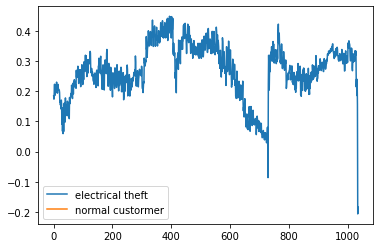

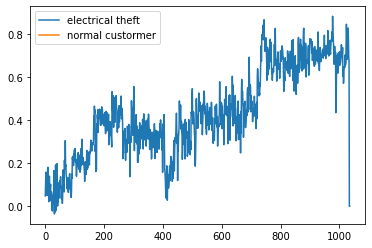

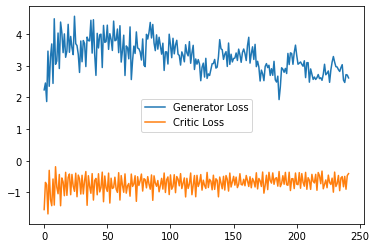

Step 4900: Generator loss: 2.4298463702201842, critic loss: -0.6291947924941779


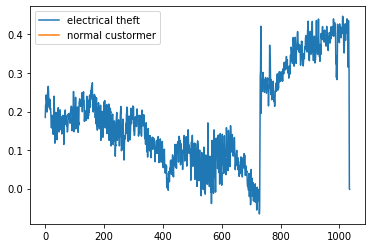

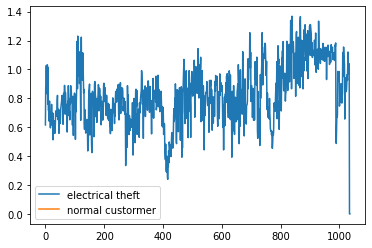

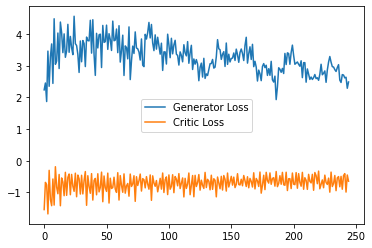

Step 4950: Generator loss: 2.7988963866233827, critic loss: -0.5594298725426199


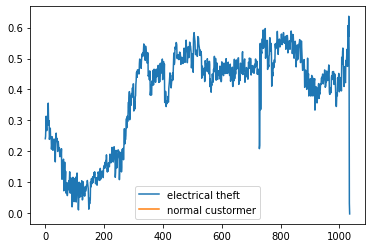

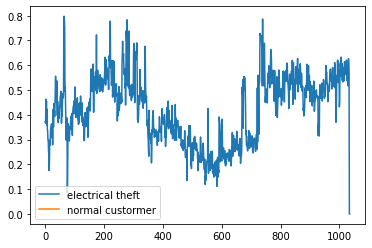

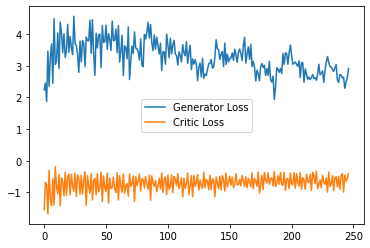

Step 5000: Generator loss: 3.0129244112968445, critic loss: -0.6510705915093422


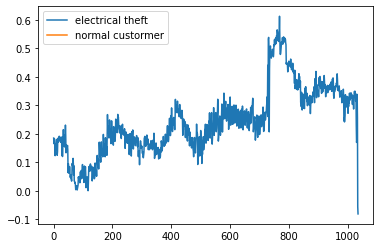

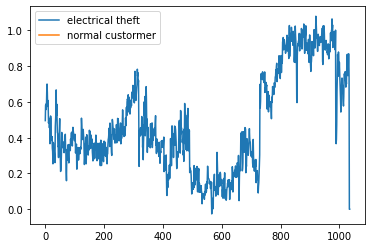

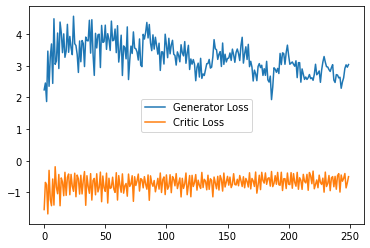

Step 5050: Generator loss: 2.839468069076538, critic loss: -0.5473094487190248


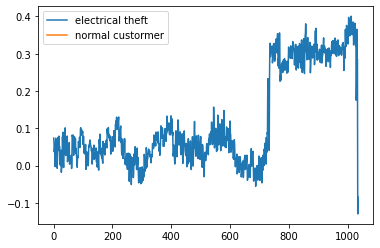

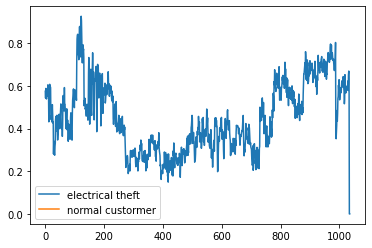

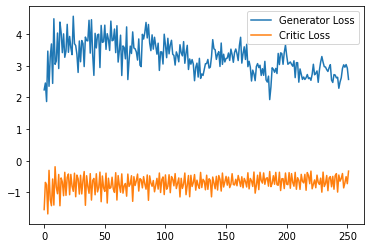

Step 5100: Generator loss: 2.9916051399707793, critic loss: -0.6930894920378922


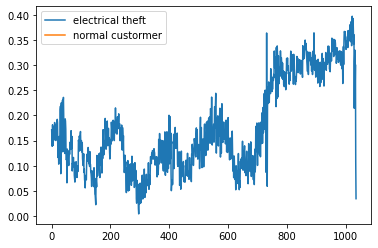

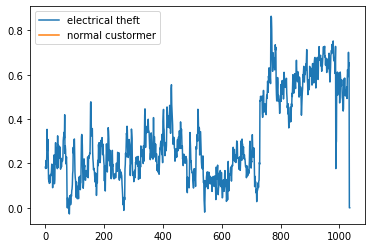

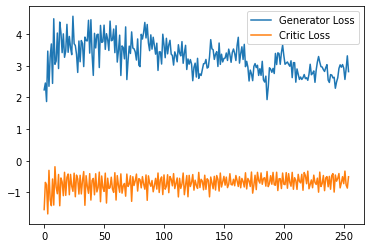

Step 5150: Generator loss: 2.5732043409347534, critic loss: -0.5252513792961835


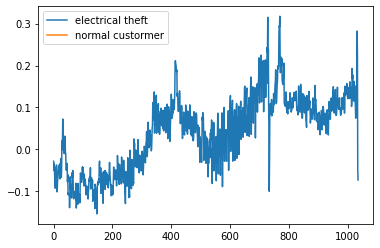

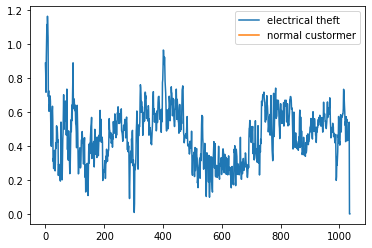

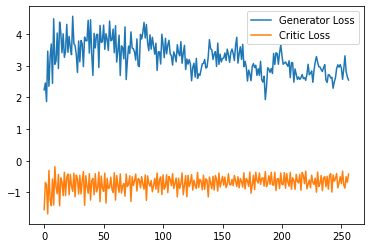

Step 5200: Generator loss: 2.6521996688842773, critic loss: -0.6603175718709825


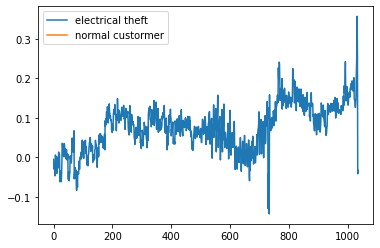

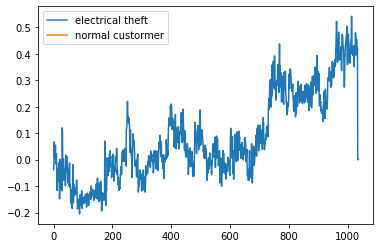

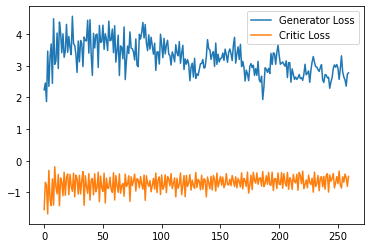

Step 5250: Generator loss: 2.6048633337020872, critic loss: -0.6380050801038744


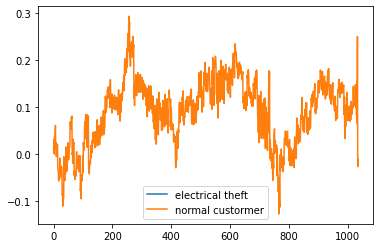

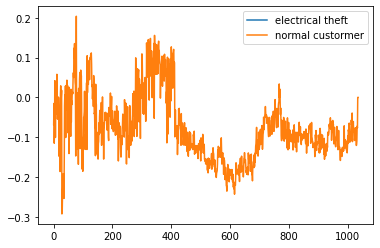

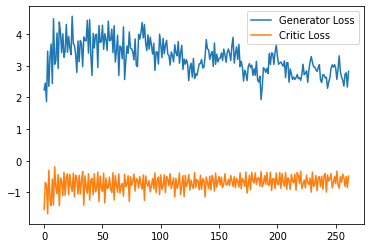

Step 5300: Generator loss: 2.631601667404175, critic loss: -0.6211360925585031


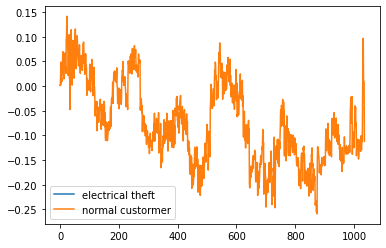

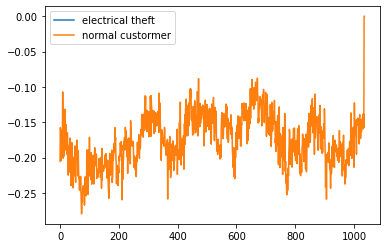

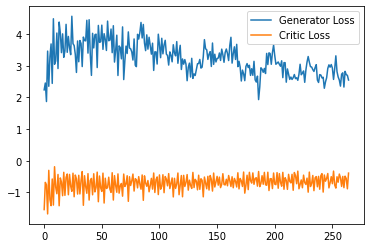

Step 5350: Generator loss: 2.4710139560699464, critic loss: -0.6778244990110395


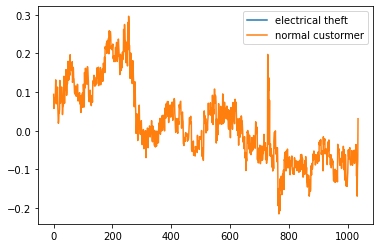

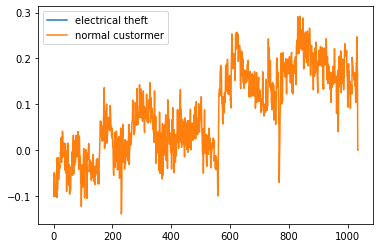

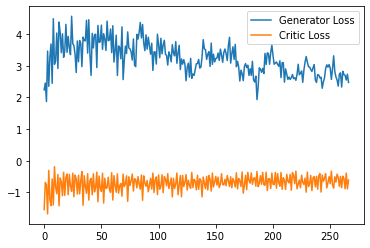

Step 5400: Generator loss: 2.443612174987793, critic loss: -0.6158611728101969


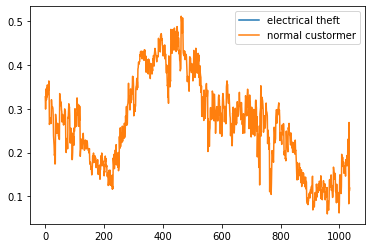

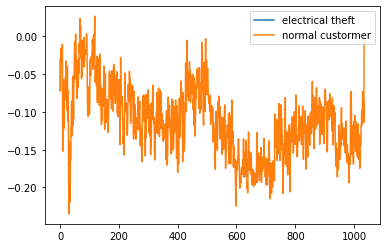

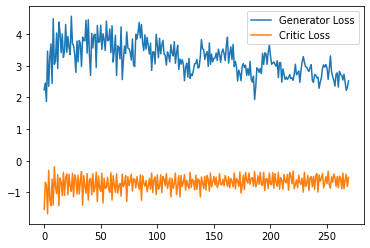

Step 5450: Generator loss: 2.214058859348297, critic loss: -0.5597534825205803


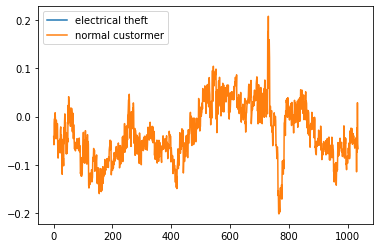

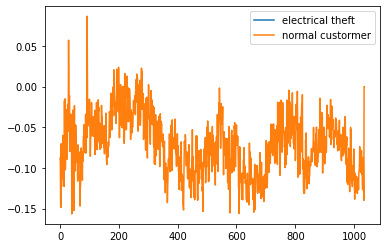

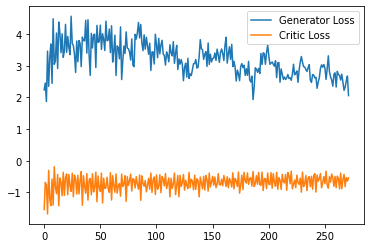

Step 5500: Generator loss: 2.0868832087516784, critic loss: -0.6501175393462181


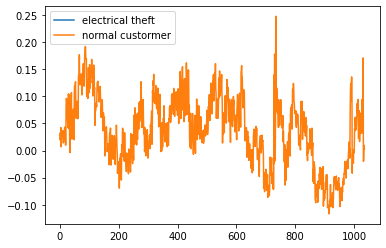

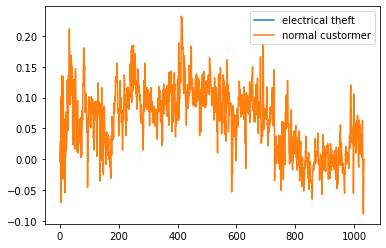

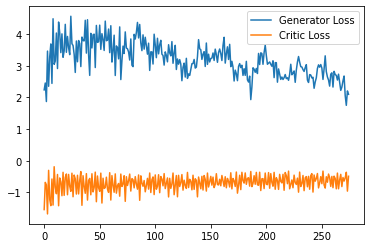

Step 5550: Generator loss: 2.0403671896457674, critic loss: -0.6625092023611069


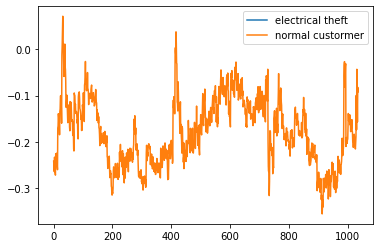

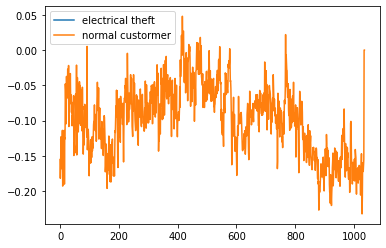

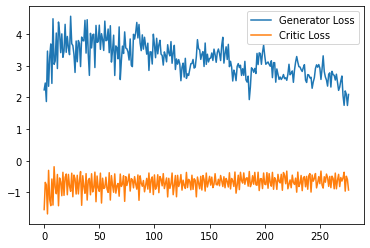

Step 5600: Generator loss: 2.1629407539963723, critic loss: -0.7408692566454411


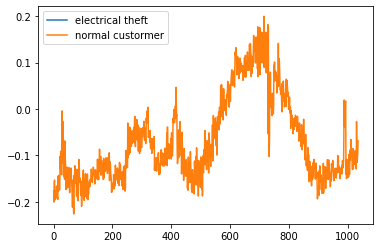

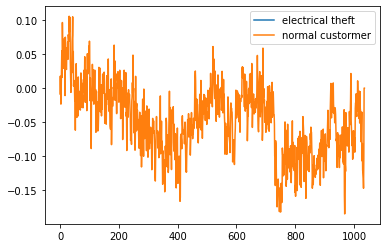

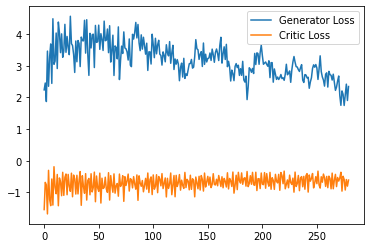

Step 5650: Generator loss: 2.1517140316963195, critic loss: -0.6970759505778552


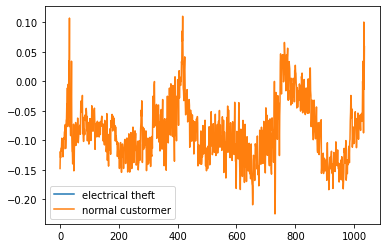

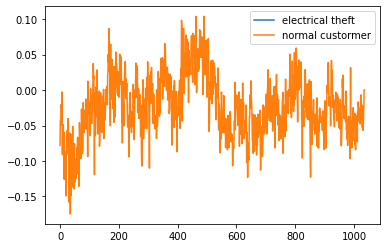

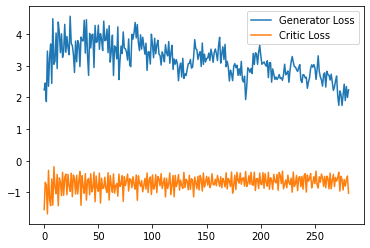

Step 5700: Generator loss: 2.0167226350307463, critic loss: -0.6535571867972613


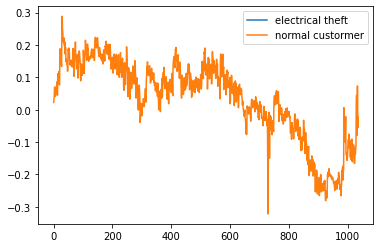

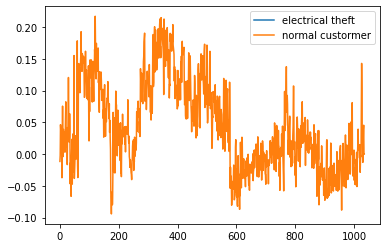

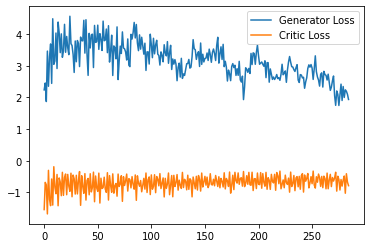

Step 5750: Generator loss: 1.982361807823181, critic loss: -0.7442762237787247


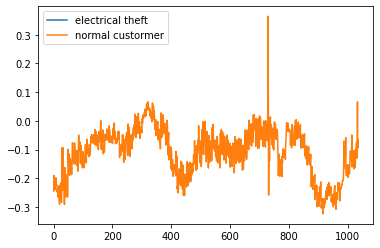

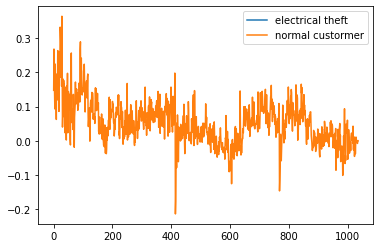

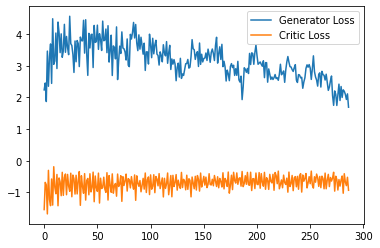

Step 5800: Generator loss: 2.314467613697052, critic loss: -0.5524467989206314


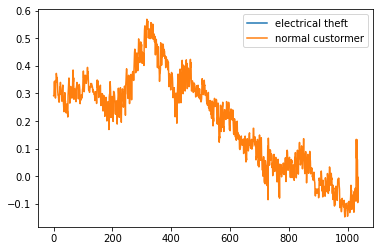

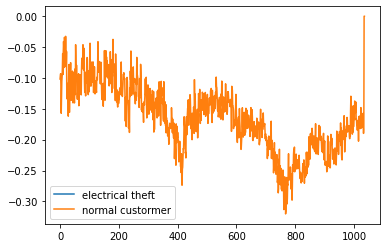

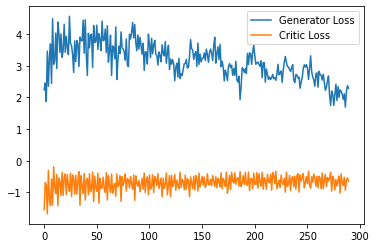

Step 5850: Generator loss: 2.1120292791724204, critic loss: -0.7042329276800158


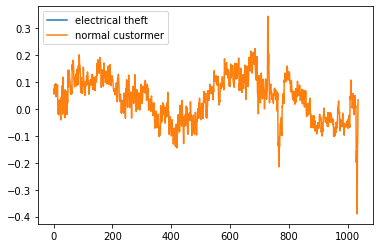

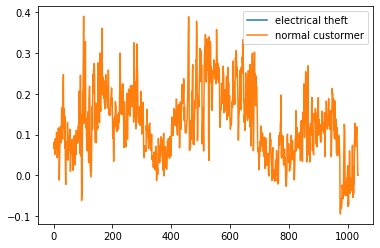

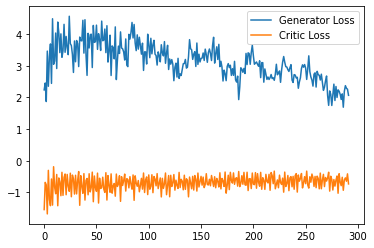

Step 5900: Generator loss: 2.43533940076828, critic loss: -0.6975565821826457


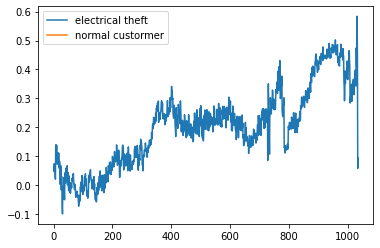

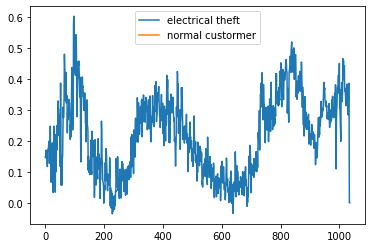

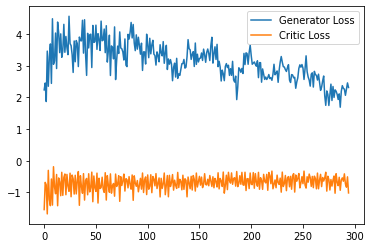

Step 5950: Generator loss: 2.2801633036136626, critic loss: -0.5938792715519667


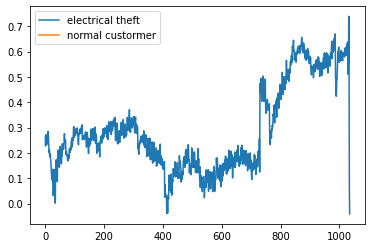

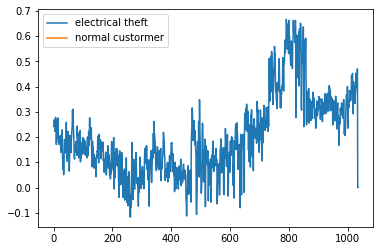

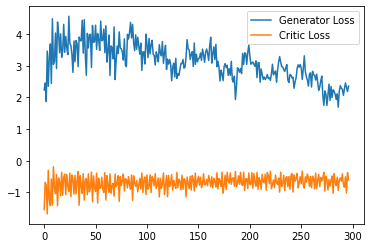

Step 6000: Generator loss: 2.5949241089820863, critic loss: -0.652390287578106


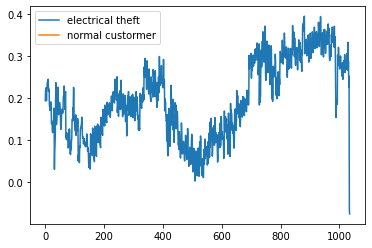

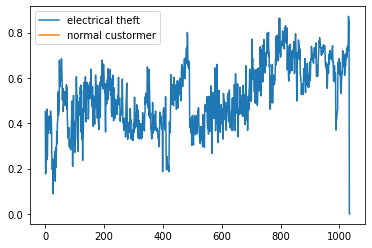

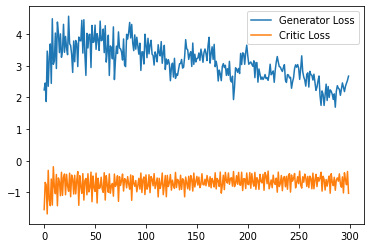

Step 6050: Generator loss: 2.3596147108078003, critic loss: -0.6609395422637461


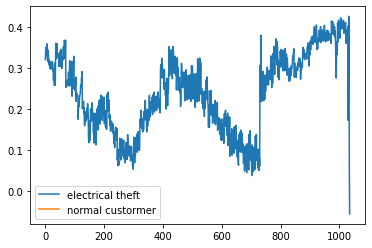

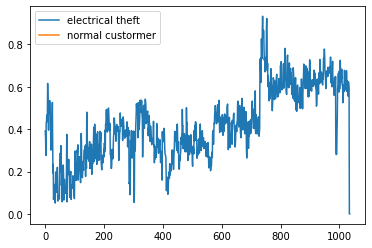

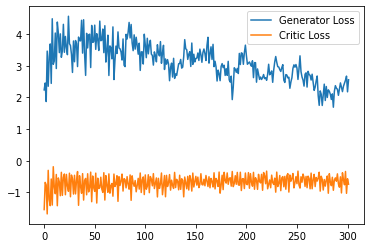

Step 6100: Generator loss: 2.0732481575012205, critic loss: -0.5431713615357876


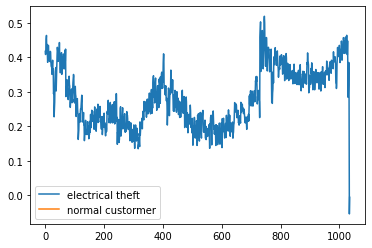

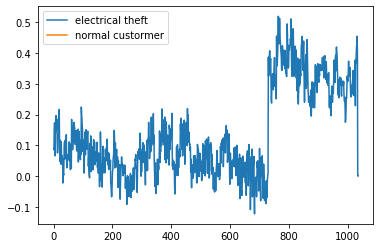

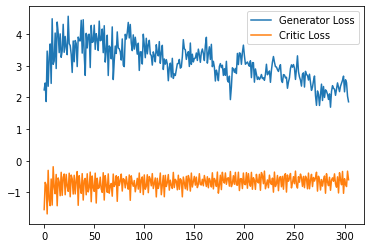

Step 6150: Generator loss: 2.0764257526397705, critic loss: -0.6701661148145795


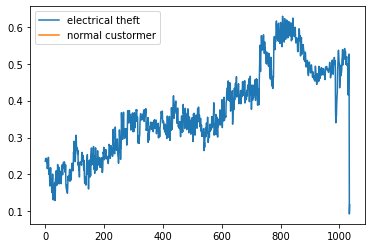

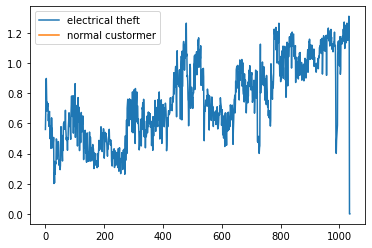

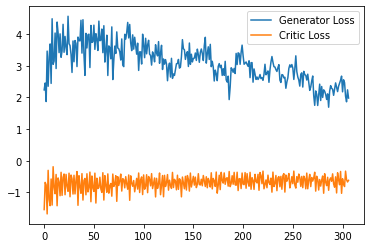

Step 6200: Generator loss: 2.0403030419349673, critic loss: -0.6559551806449891


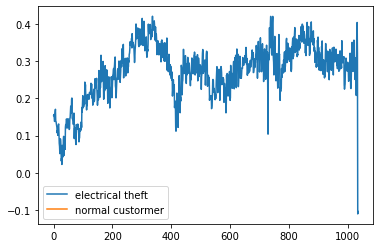

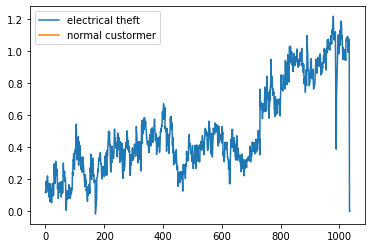

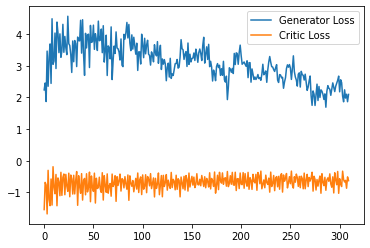

Step 6250: Generator loss: 2.0822728908061983, critic loss: -0.7514422626644371


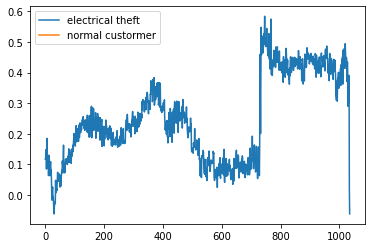

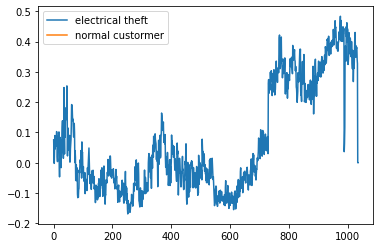

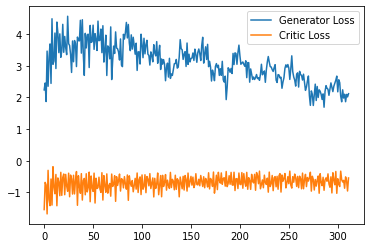

Step 6300: Generator loss: 1.7660149097442628, critic loss: -0.5910224364548922


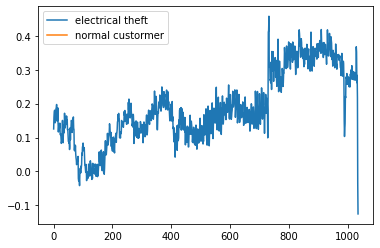

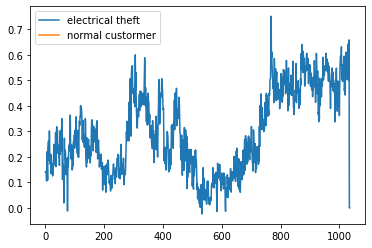

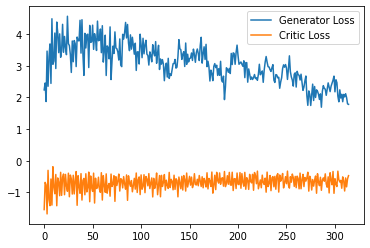

Step 6350: Generator loss: 1.9535011970996856, critic loss: -0.6589399902224539


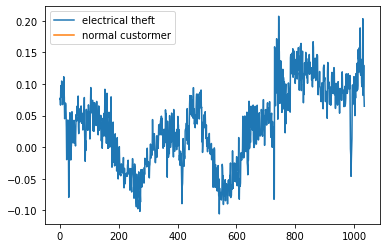

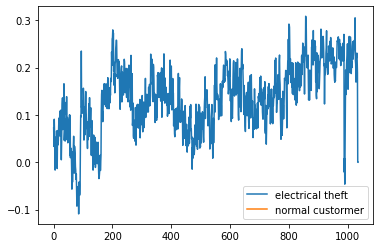

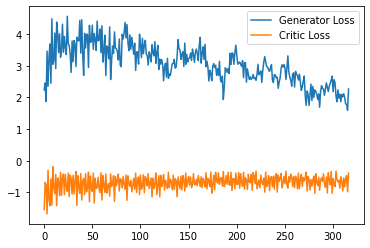

Step 6400: Generator loss: 2.104080572128296, critic loss: -0.6676548009365796


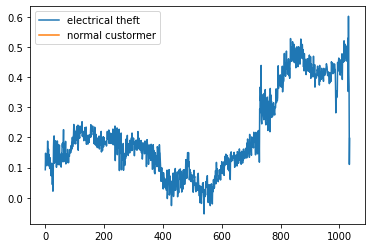

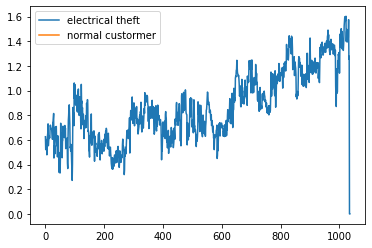

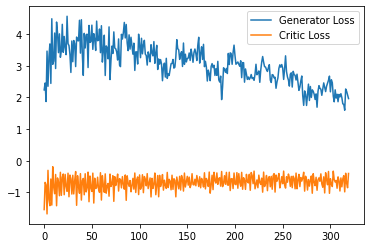

Step 6450: Generator loss: 2.14514888882637, critic loss: -0.6679383064359427


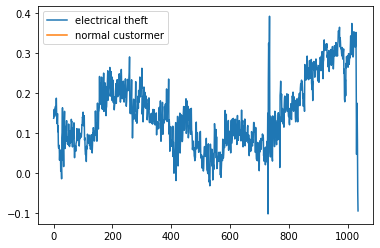

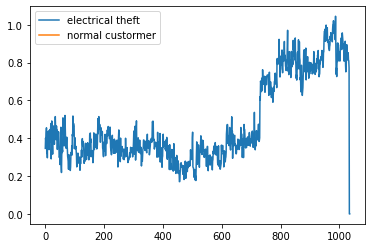

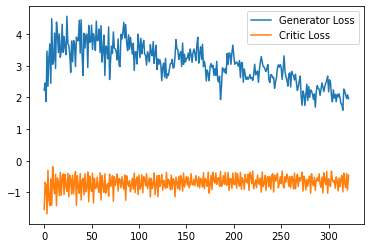

Step 6500: Generator loss: 2.19756475687027, critic loss: -0.613616837620735


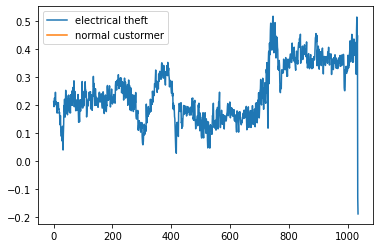

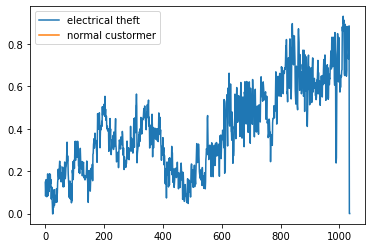

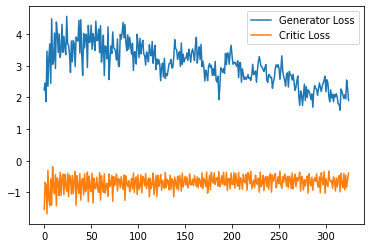

Step 6550: Generator loss: 2.0793280100822447, critic loss: -0.748928603410721


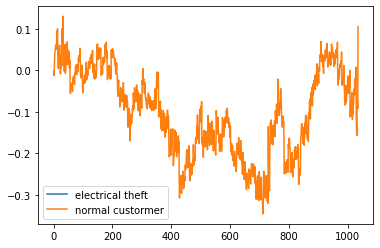

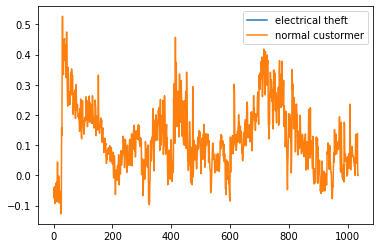

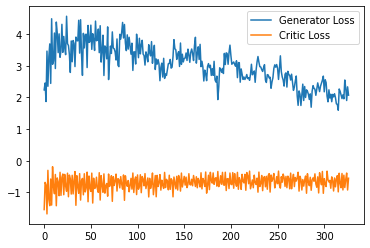

Step 6600: Generator loss: 2.0844799292087557, critic loss: -0.7188066540658475


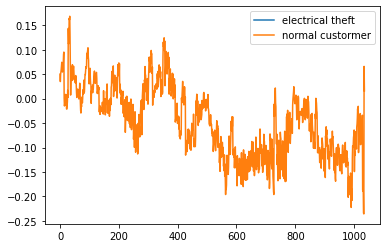

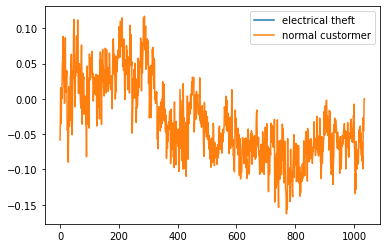

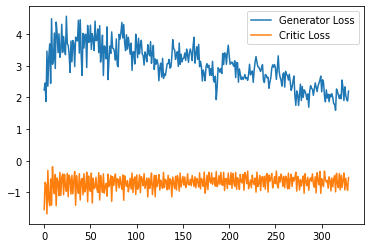

Step 6650: Generator loss: 2.0687633657455446, critic loss: -0.6725866491496562


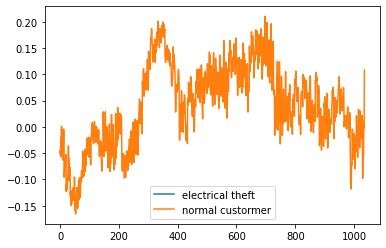

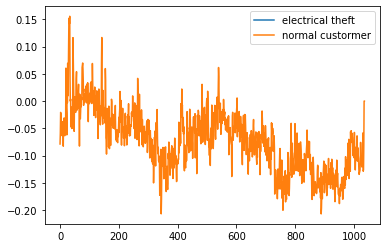

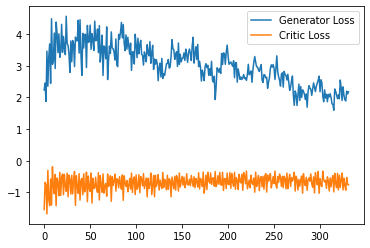

Step 6700: Generator loss: 1.7360259997844696, critic loss: -0.6817747698426246


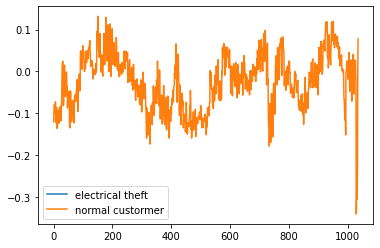

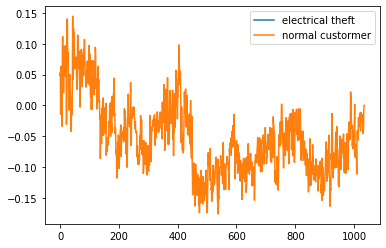

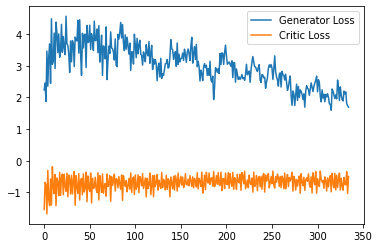

Step 6750: Generator loss: 1.806026057600975, critic loss: -0.7650821931660178


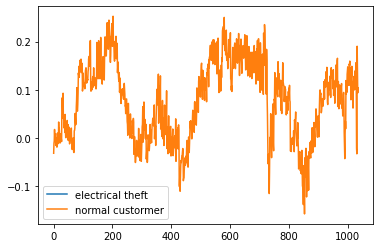

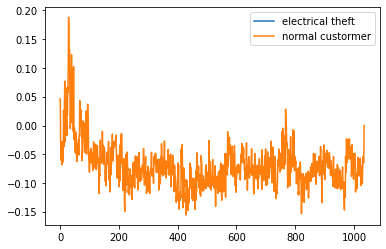

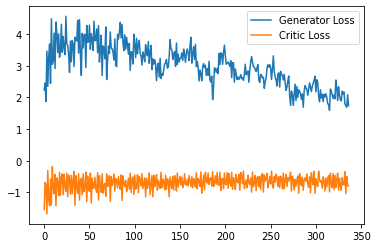

Step 6800: Generator loss: 1.5548296320438384, critic loss: -0.456917395144701


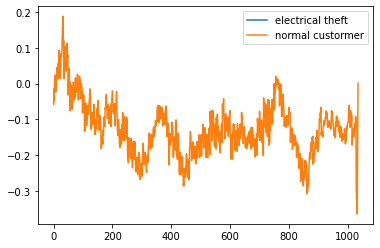

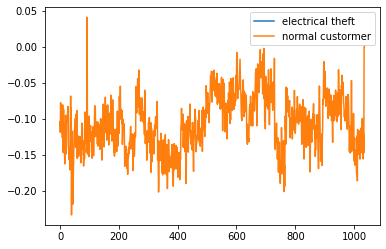

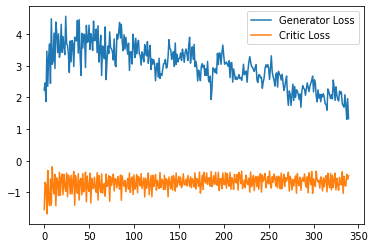

Step 6850: Generator loss: 1.570438470095396, critic loss: -0.7451563308835031


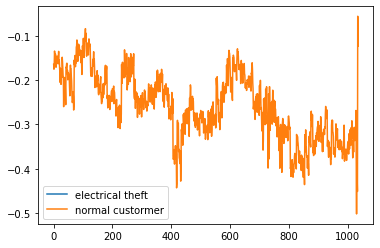

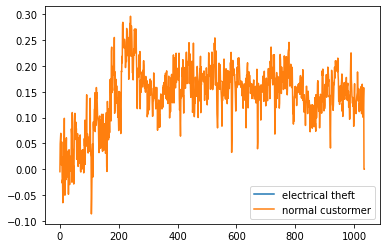

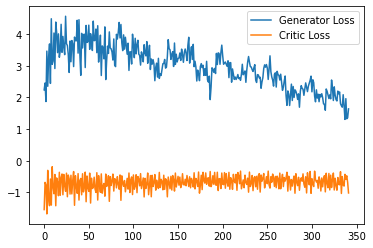

Step 6900: Generator loss: 1.6608966445922853, critic loss: -0.7644022584557533


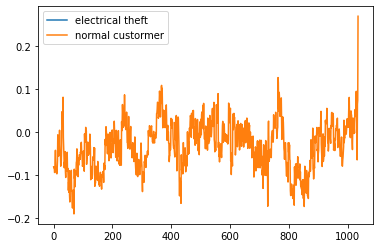

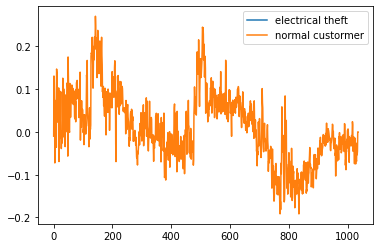

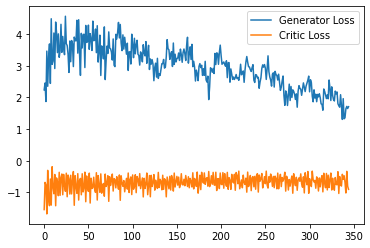

Step 6950: Generator loss: 1.9238499009609222, critic loss: -0.9120231458246708


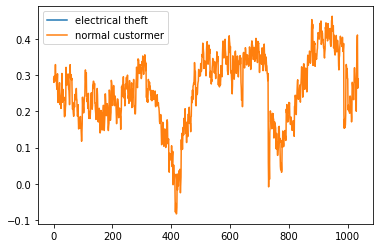

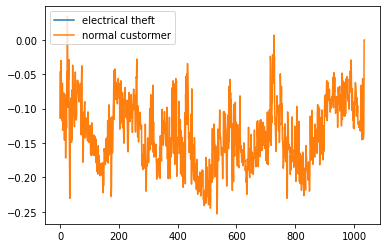

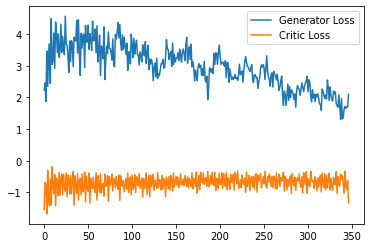

Step 7000: Generator loss: 1.784854588508606, critic loss: -0.6681731048226357


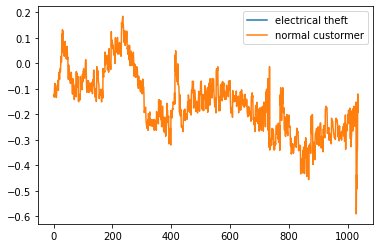

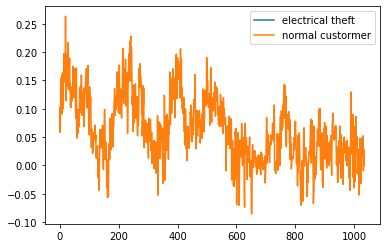

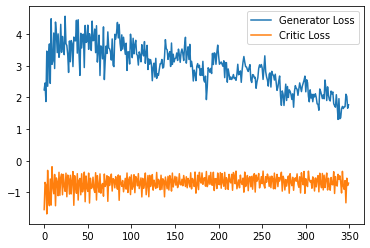

Step 7050: Generator loss: 1.729022617340088, critic loss: -0.7677377357184887


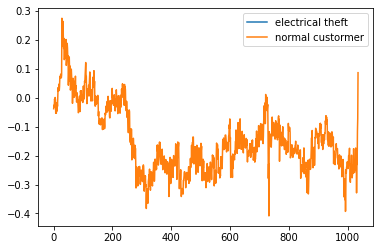

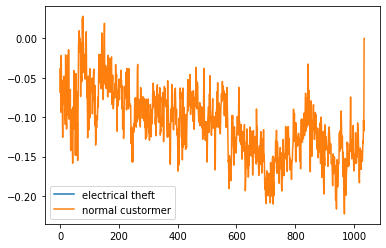

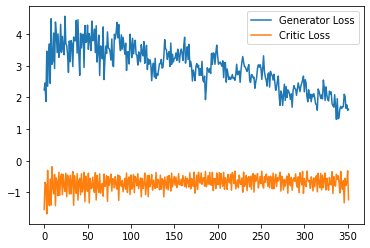

Step 7100: Generator loss: 1.9760346388816834, critic loss: -0.7656824860870841


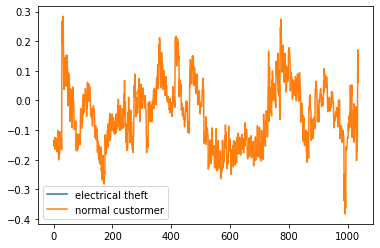

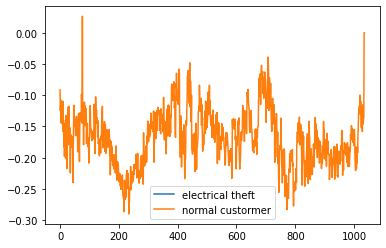

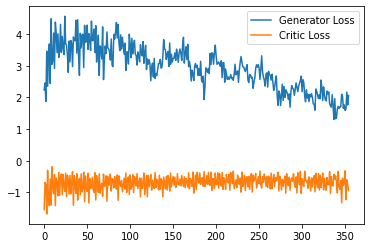

Step 7150: Generator loss: 1.9520090755820274, critic loss: -0.7544113776087761


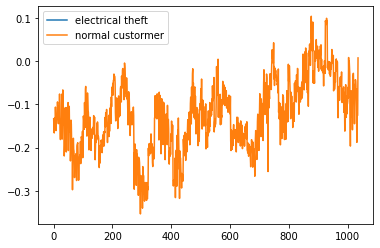

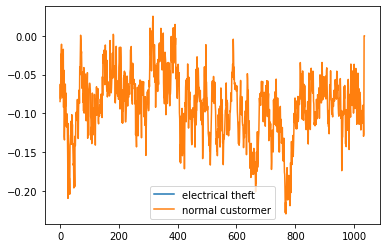

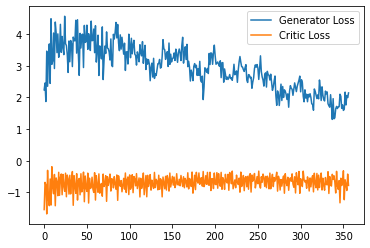

Step 7200: Generator loss: 2.2567792373895643, critic loss: -0.7237216375917197


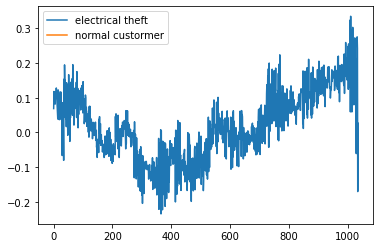

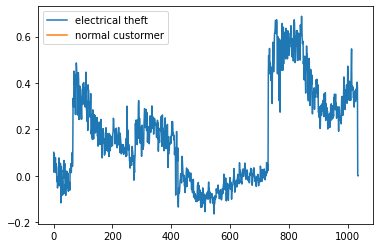

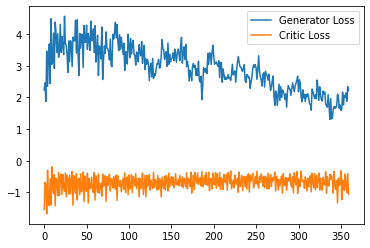

Step 7250: Generator loss: 1.5063830137252807, critic loss: -0.6951226573735475


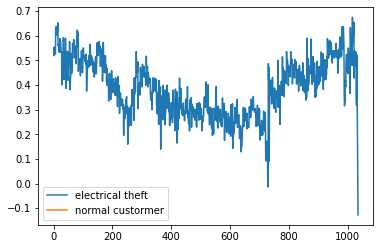

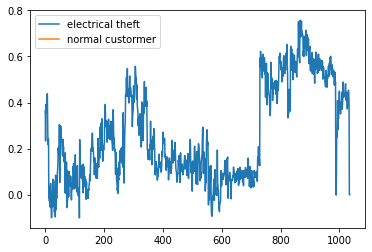

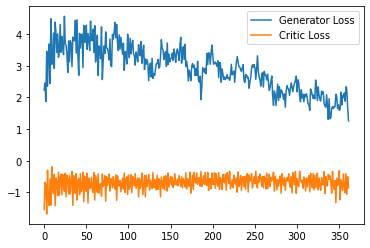

Step 7300: Generator loss: 1.5131706994771958, critic loss: -0.646673293977976


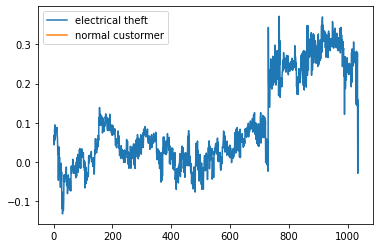

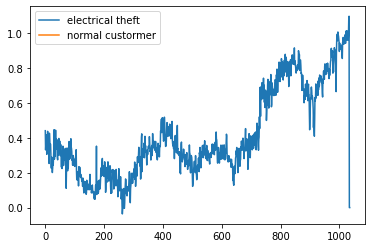

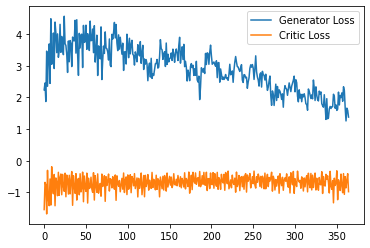

Step 7350: Generator loss: 1.1914136427640916, critic loss: -0.7763451385796069


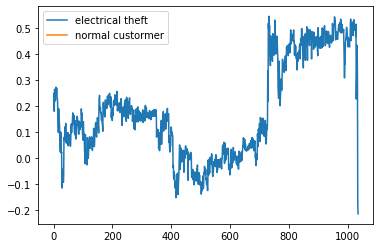

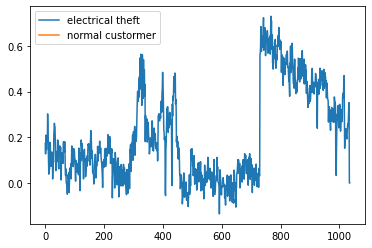

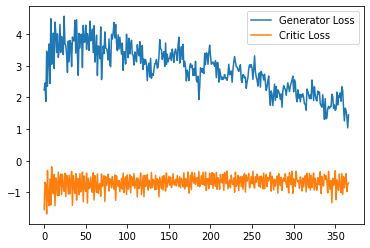

Step 7400: Generator loss: 1.4781662234663964, critic loss: -0.8340577843785284


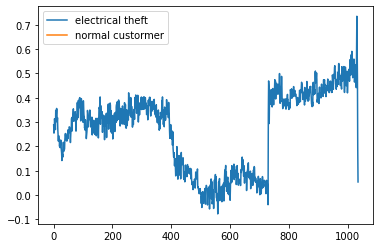

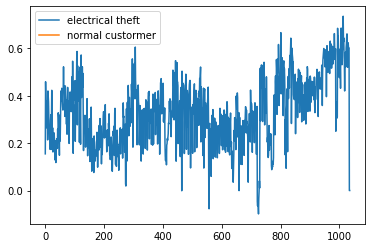

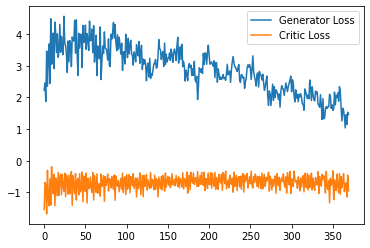

Step 7450: Generator loss: 1.5697776633501053, critic loss: -0.8200155158638951


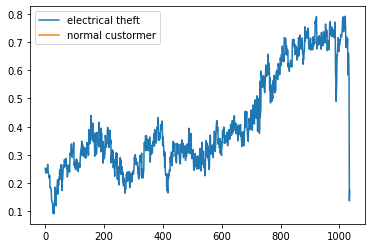

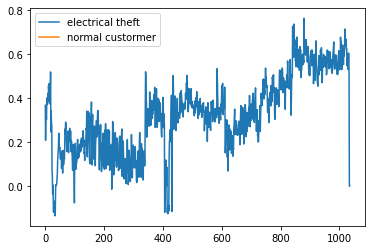

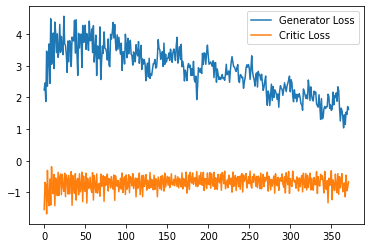

Step 7500: Generator loss: 1.165413807630539, critic loss: -0.6381815076470374


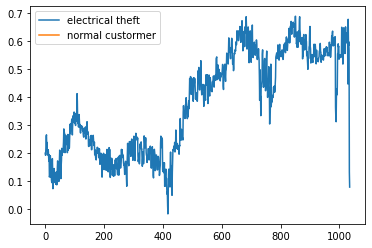

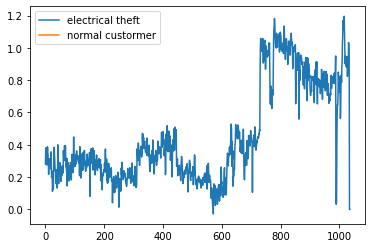

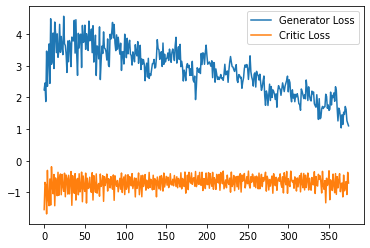

Step 7550: Generator loss: 1.2386247527599334, critic loss: -0.7208776947557927


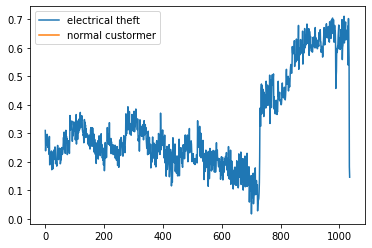

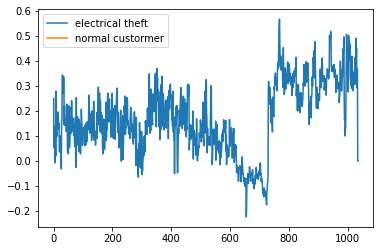

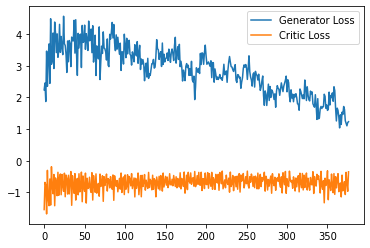

Step 7600: Generator loss: 1.0552273052930832, critic loss: -0.5494225769042967


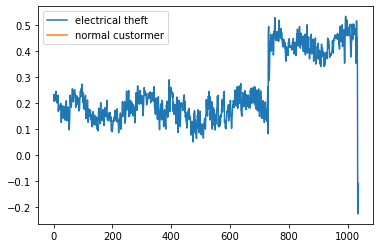

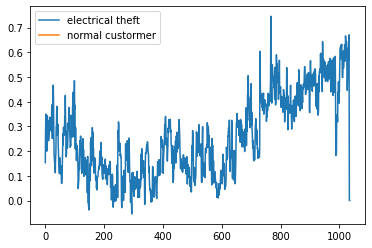

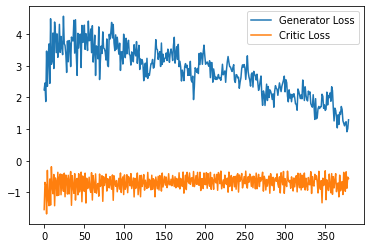

Step 7650: Generator loss: 1.1317303013801574, critic loss: -0.8090995221436024


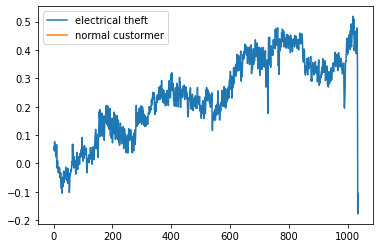

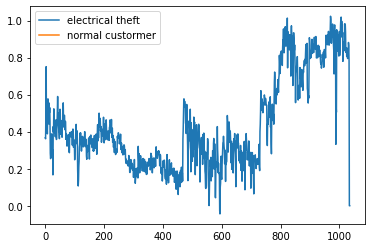

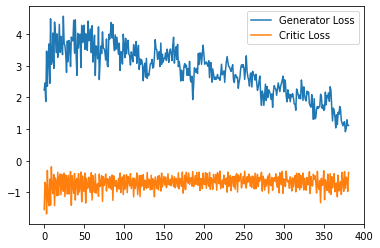

Step 7700: Generator loss: 1.4762686759233474, critic loss: -0.7638153331726791


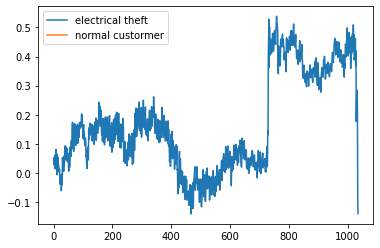

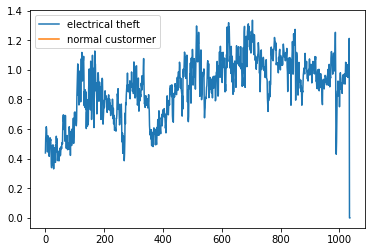

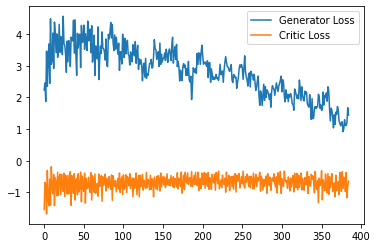

Step 7750: Generator loss: 1.6199283850193025, critic loss: -0.6536335929036141


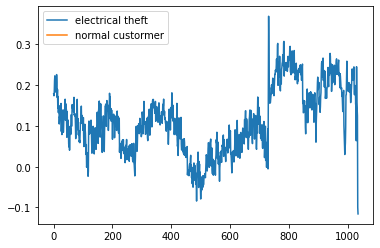

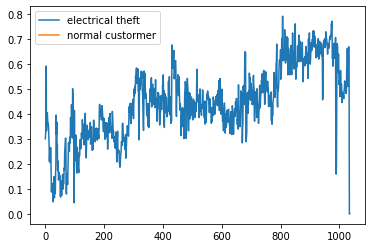

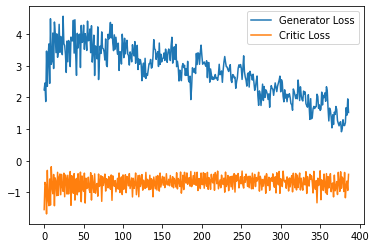

Step 7800: Generator loss: 1.4532600700855256, critic loss: -0.7527499817609791


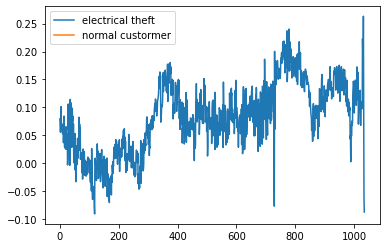

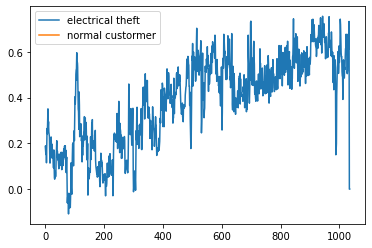

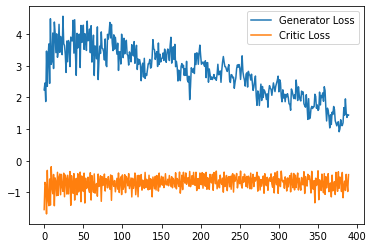

Step 7850: Generator loss: 1.115206673145294, critic loss: -0.8727214503884313


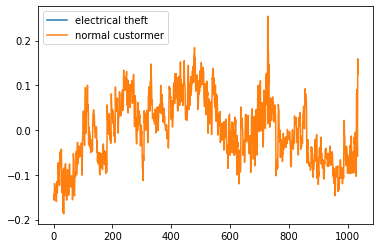

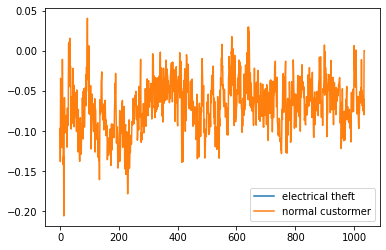

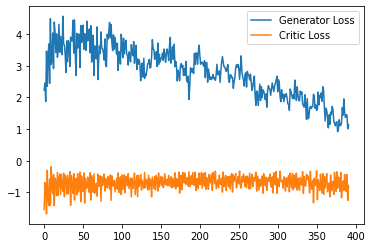

Step 7900: Generator loss: 1.0876681035757065, critic loss: -0.7334198570847511


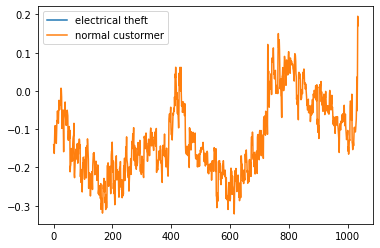

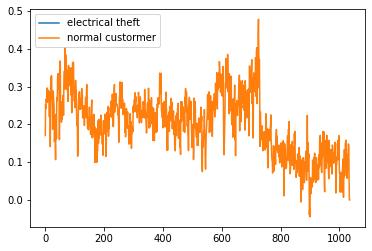

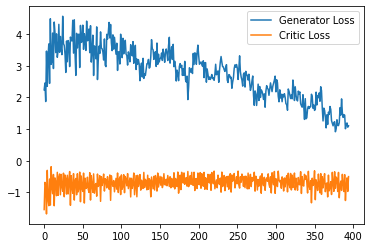

Step 7950: Generator loss: 1.414420039653778, critic loss: -0.8643584820479155


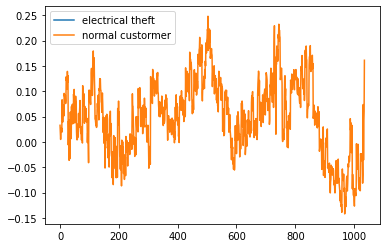

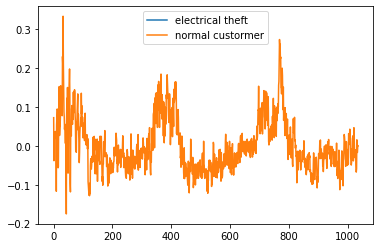

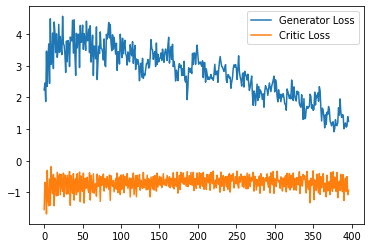

Step 8000: Generator loss: 1.5407594990730287, critic loss: -0.8918642785698176


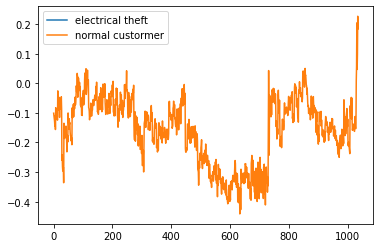

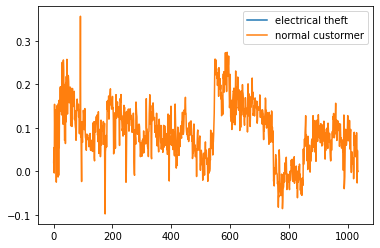

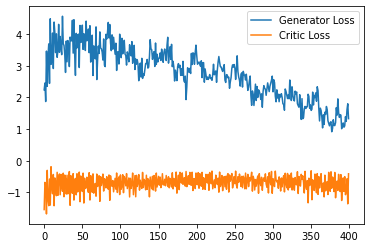

Step 8050: Generator loss: 1.116154106259346, critic loss: -0.9862796575129034


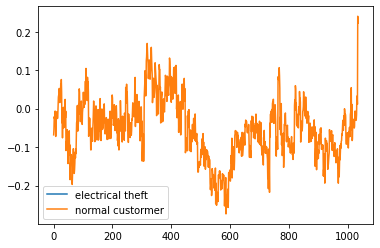

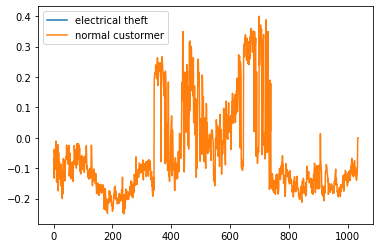

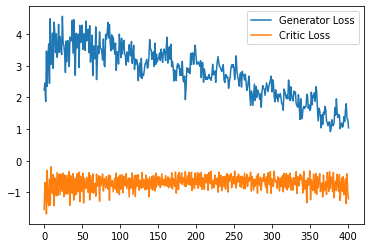

Step 8100: Generator loss: 1.311673903465271, critic loss: -0.8226731546670197


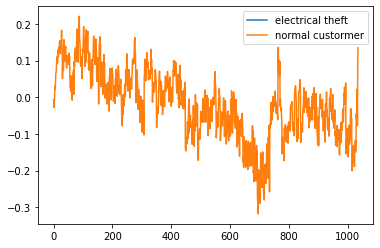

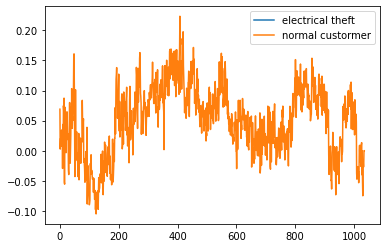

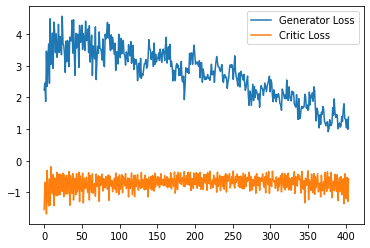

Step 8150: Generator loss: 1.4107860279083253, critic loss: -0.8104511049985886


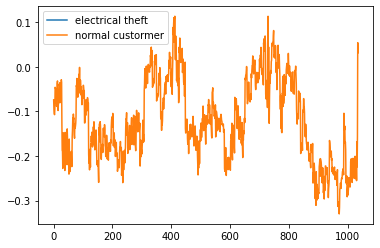

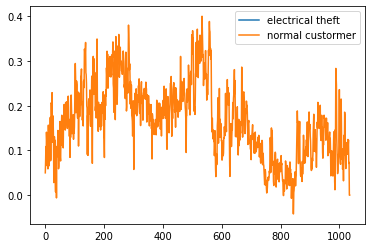

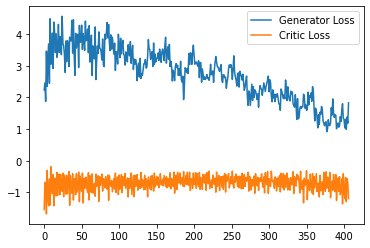

Step 8200: Generator loss: 1.5570732486248016, critic loss: -0.8397765449285505


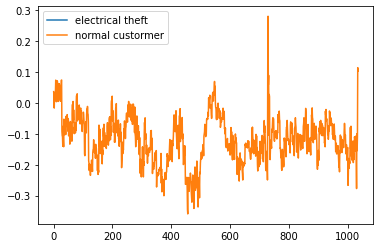

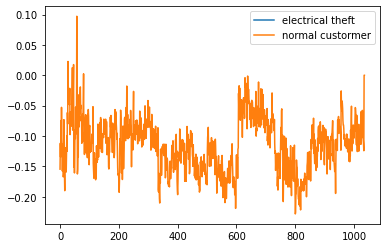

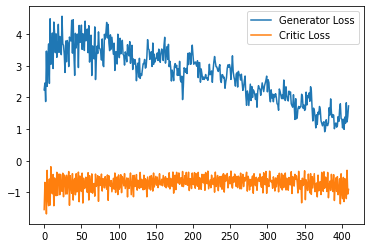

Step 8250: Generator loss: 1.770756302177906, critic loss: -1.0061180052012204


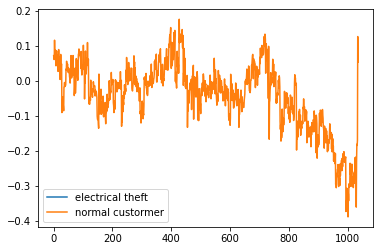

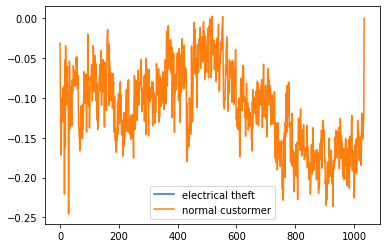

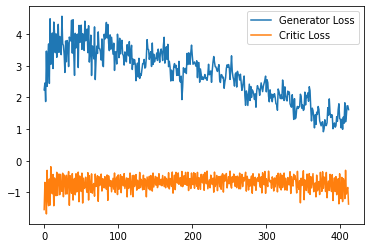

Step 8300: Generator loss: 2.0602292793989183, critic loss: -0.9566173365116122


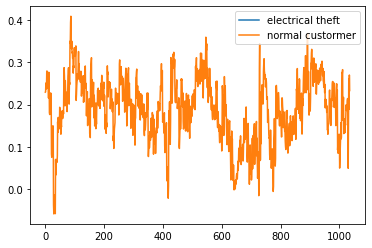

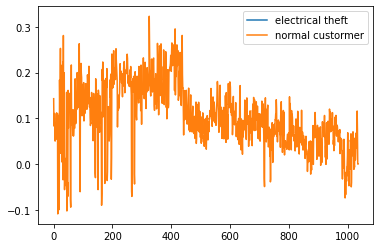

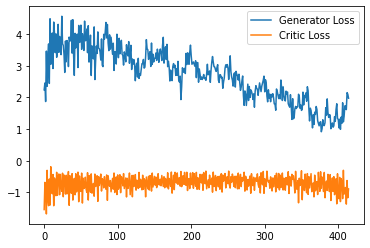

Step 8350: Generator loss: 1.8391730058193207, critic loss: -0.8416857314109805


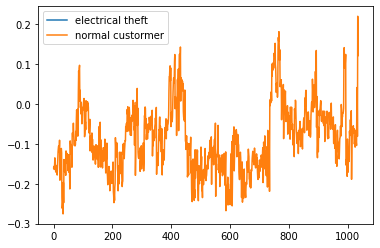

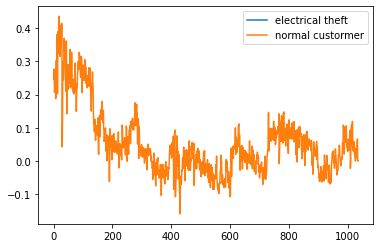

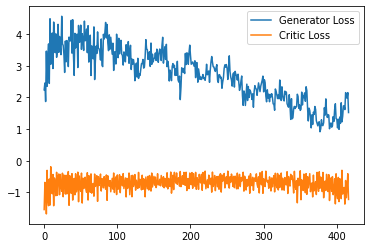

Step 8400: Generator loss: 2.160519049167633, critic loss: -0.8610753957927227


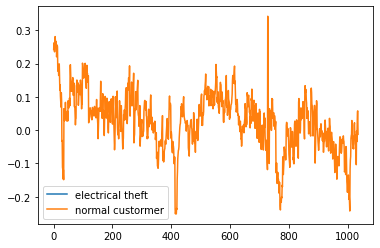

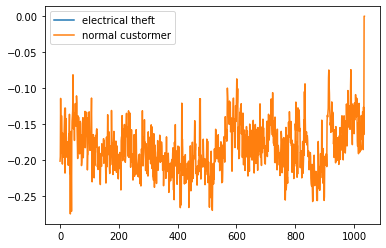

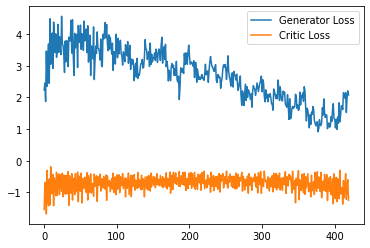

Step 8450: Generator loss: 2.282887109518051, critic loss: -1.053066486120224


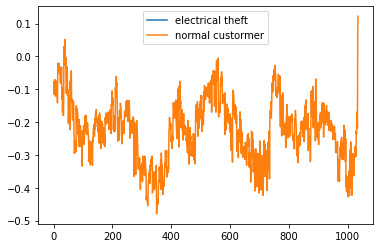

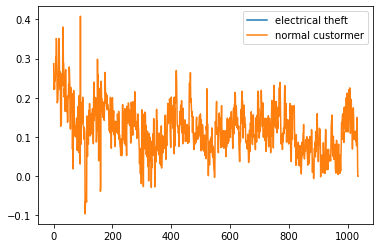

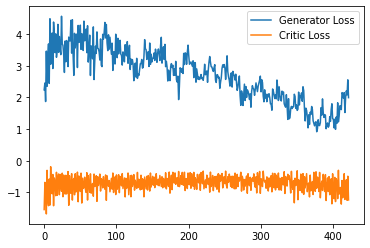

Step 8500: Generator loss: 2.20838844537735, critic loss: -0.9040484511852263


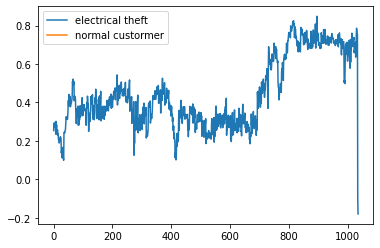

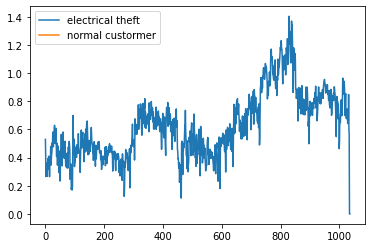

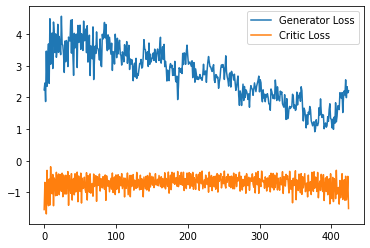

Step 8550: Generator loss: 2.6000919342041016, critic loss: -0.9653715253472331


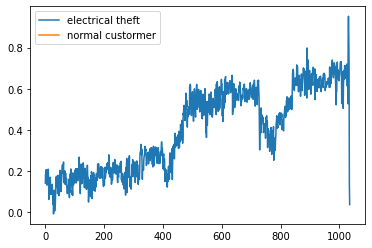

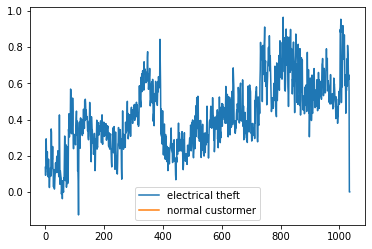

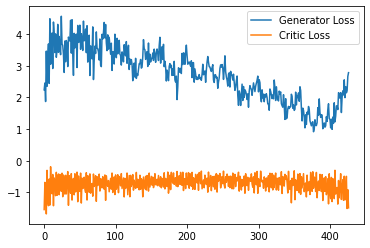

Step 8600: Generator loss: 2.583402976989746, critic loss: -0.42212150803208354


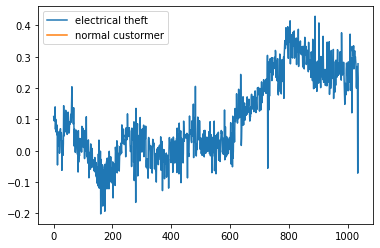

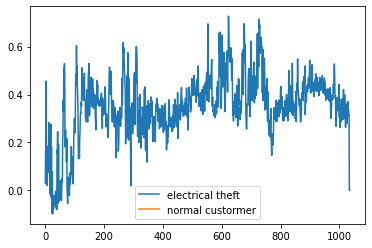

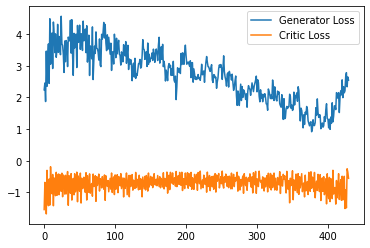

Step 8650: Generator loss: 2.1038347339630126, critic loss: -0.6427802421152592


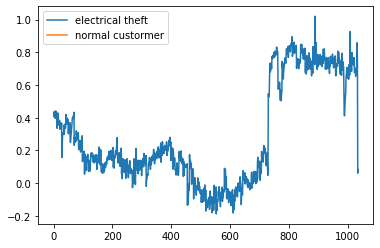

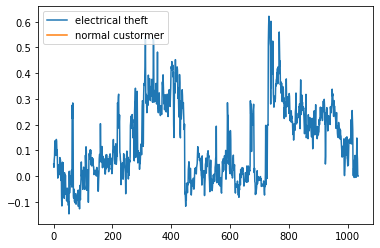

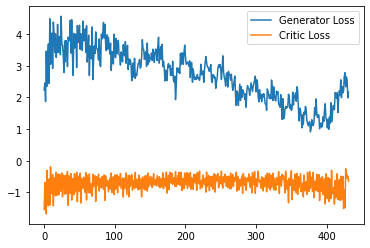

Step 8700: Generator loss: 2.0373605704307556, critic loss: -0.8335422235429287


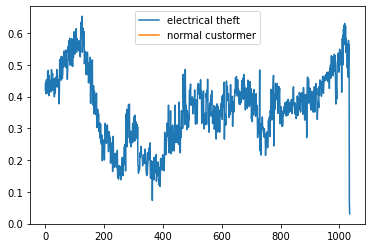

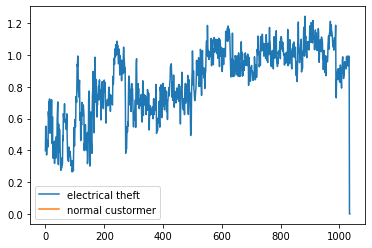

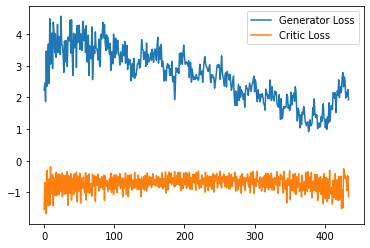

Step 8750: Generator loss: 1.9573890386521817, critic loss: -0.781438070833683


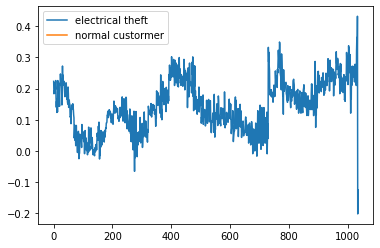

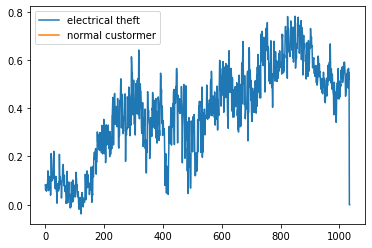

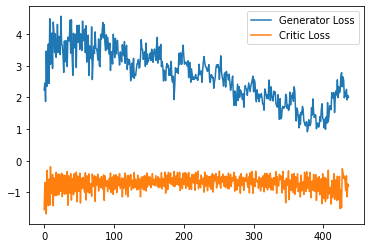

Step 8800: Generator loss: 2.058131606578827, critic loss: -0.5518325352072717


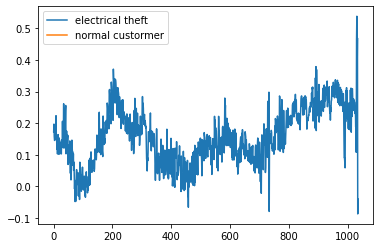

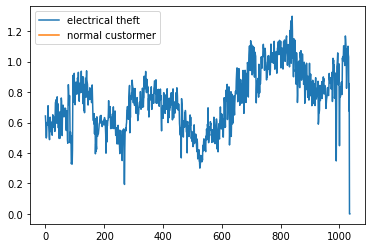

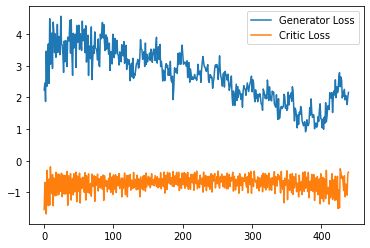

Step 8850: Generator loss: 2.028311734199524, critic loss: -0.5678324389159678


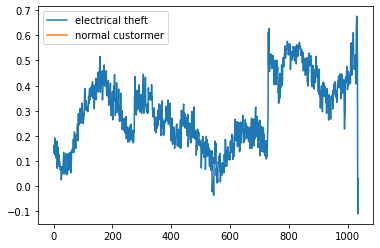

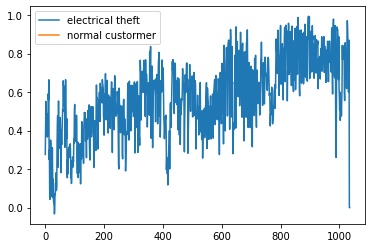

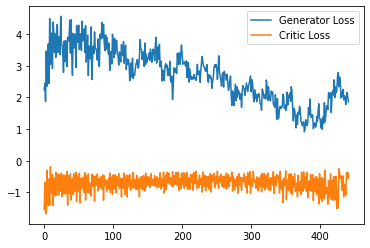

Step 8900: Generator loss: 1.8280410158634186, critic loss: -0.669105711132288


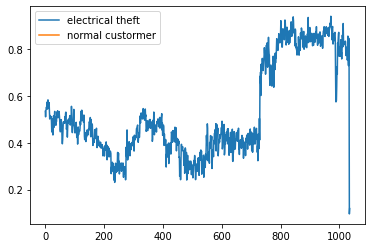

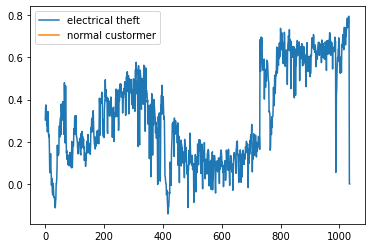

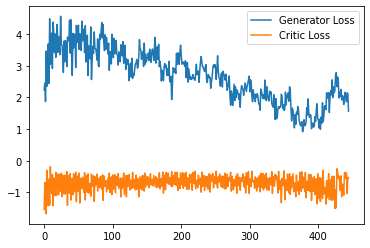

Step 8950: Generator loss: 2.1928598260879517, critic loss: -0.9800579518377782


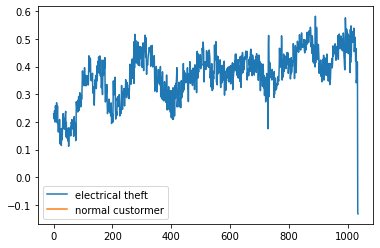

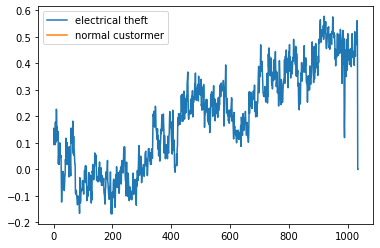

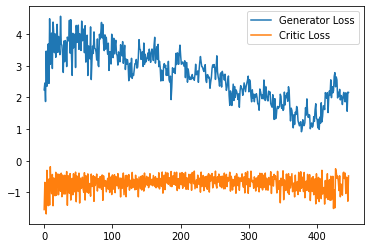

Step 9000: Generator loss: 2.1350588953495024, critic loss: -0.6866357319056986


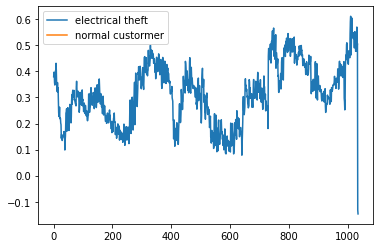

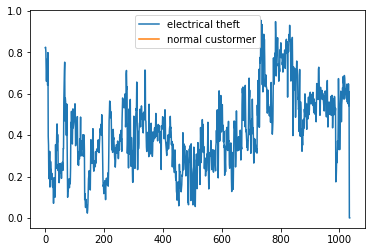

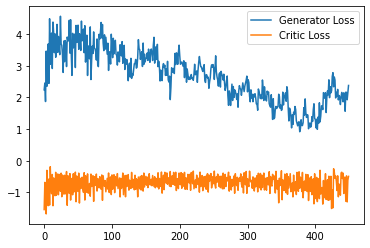

Step 9050: Generator loss: 2.0739263594150543, critic loss: -1.103579486757517


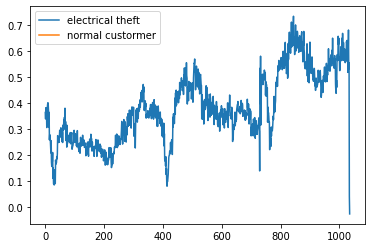

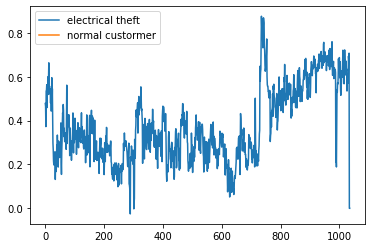

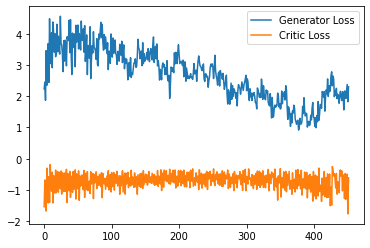

Step 9100: Generator loss: 2.2496083042025568, critic loss: -1.0783134375214578


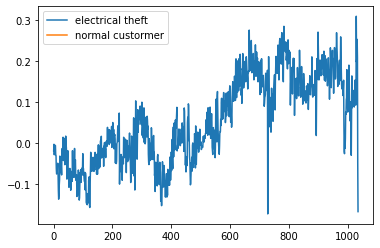

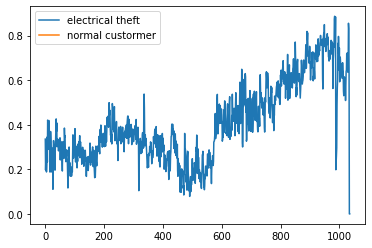

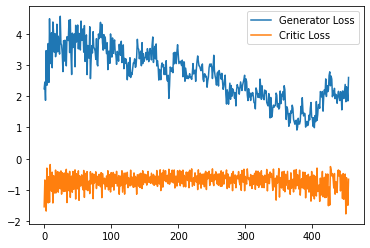

Step 9150: Generator loss: 2.5931063199043276, critic loss: -0.7541403393745422


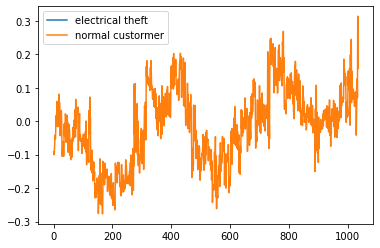

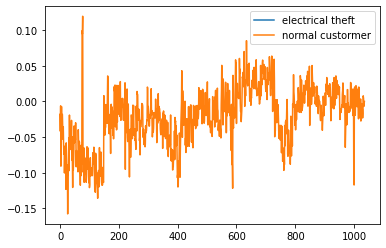

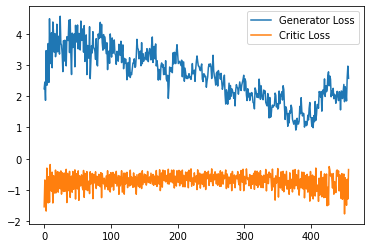

Step 9200: Generator loss: 2.393872611699626, critic loss: -0.78842970764637


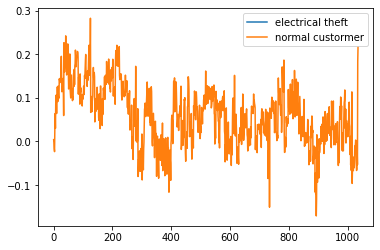

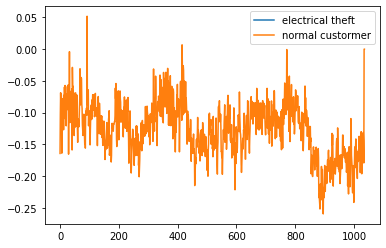

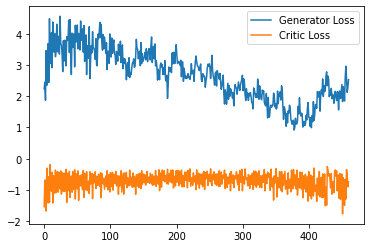

Step 9250: Generator loss: 2.326621584892273, critic loss: -0.897692975625396


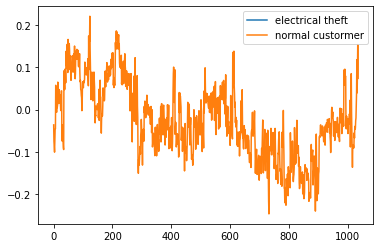

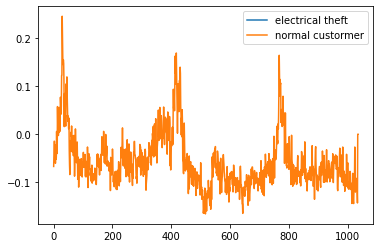

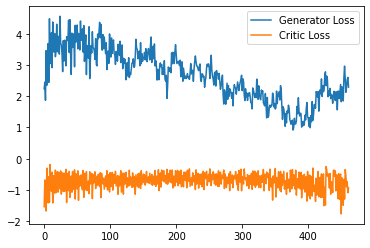

Step 9300: Generator loss: 1.9830260813236236, critic loss: -0.6990319793522357


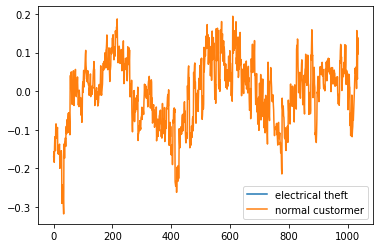

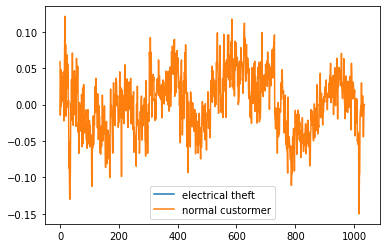

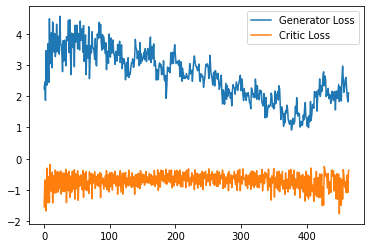

Step 9350: Generator loss: 2.242593331336975, critic loss: -0.6950755926072598


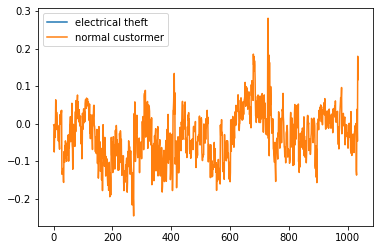

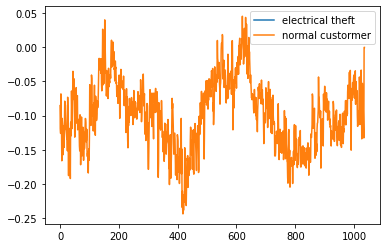

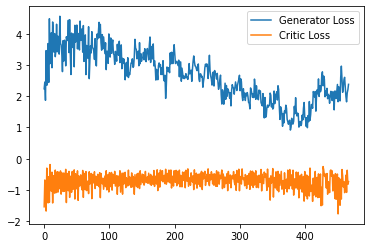

Step 9400: Generator loss: 2.302474398612976, critic loss: -0.8957346226572988


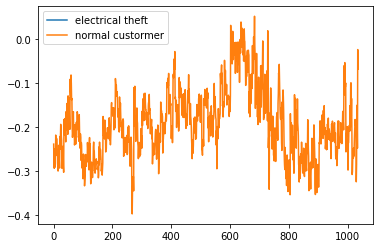

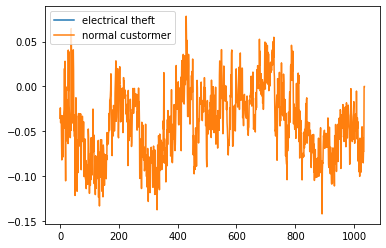

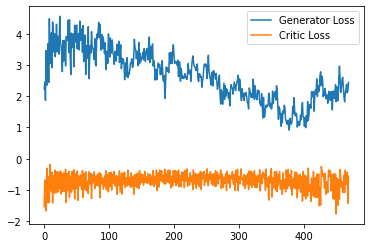

Step 9450: Generator loss: 2.345341668128967, critic loss: -0.8314691172838211


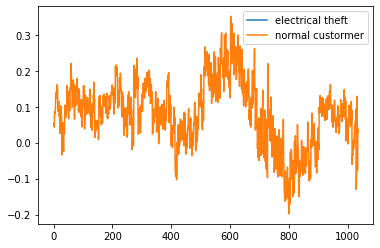

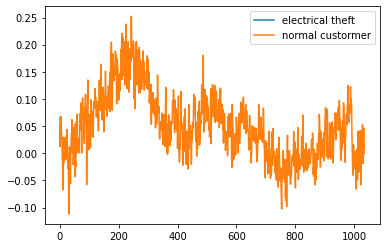

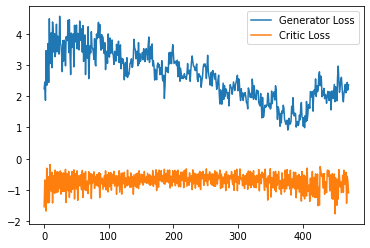

Step 9500: Generator loss: 2.3235571455955504, critic loss: -0.2271187958046794


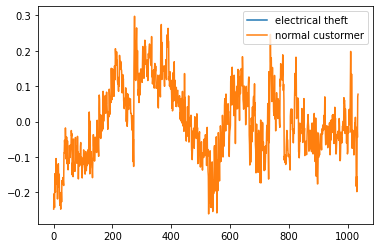

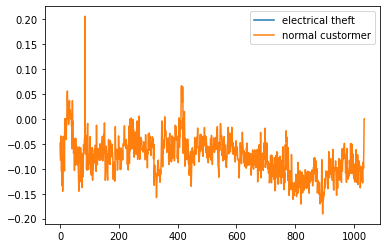

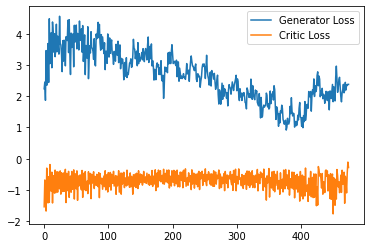

Step 9550: Generator loss: 2.207031075954437, critic loss: -0.4765238537937403


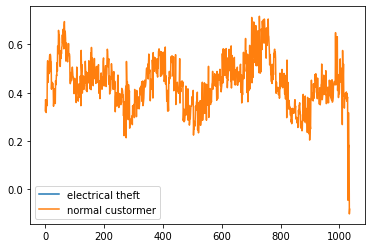

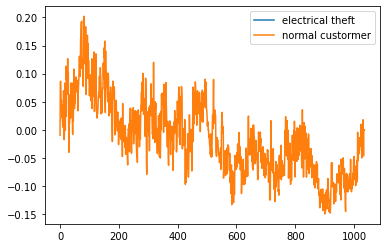

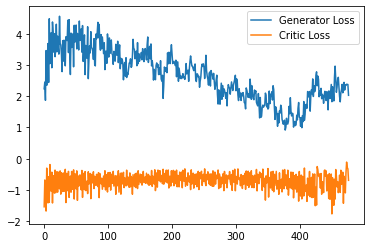

Step 9600: Generator loss: 2.2743197178840635, critic loss: -0.6177185664027928


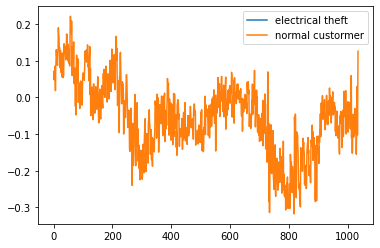

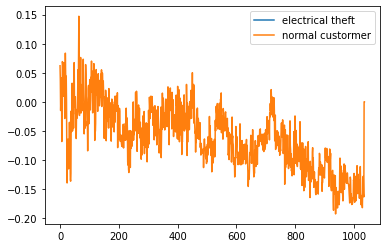

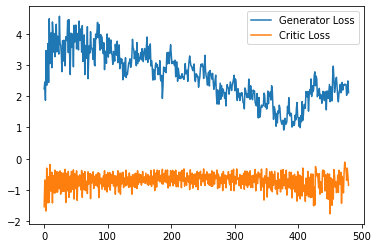

Step 9650: Generator loss: 2.1071041613817214, critic loss: -0.8540009216964244


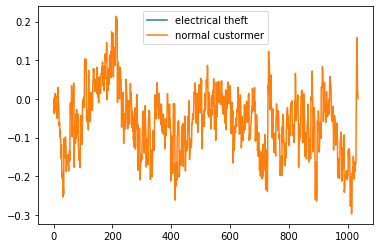

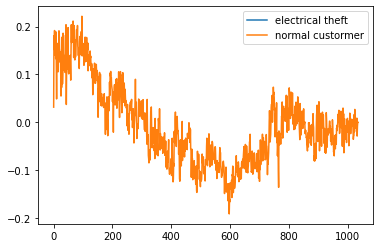

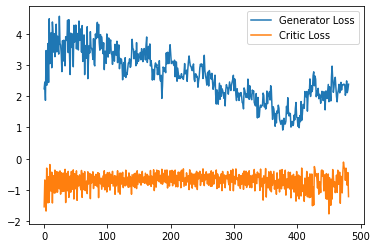

Step 9700: Generator loss: 1.9619750905036926, critic loss: -0.8769323131144049


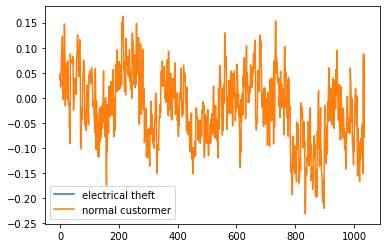

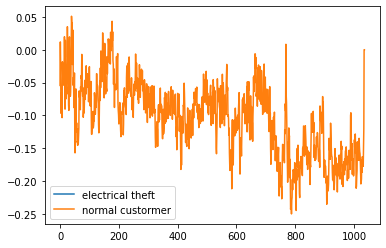

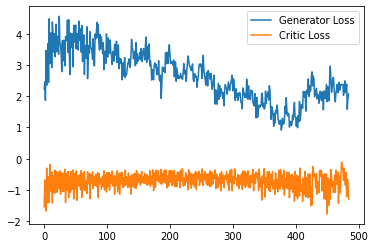

Step 9750: Generator loss: 1.9472139191627502, critic loss: -1.0279742475152012


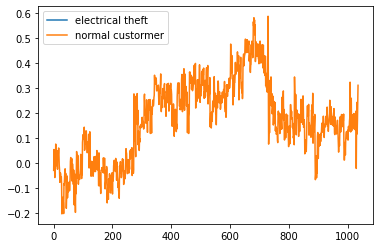

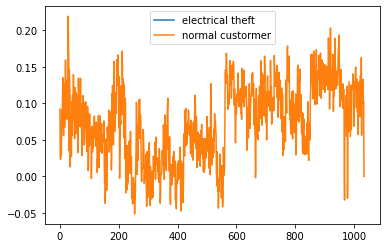

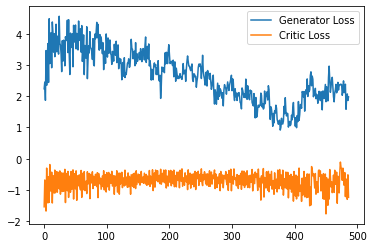

Step 9800: Generator loss: 2.2466663348674776, critic loss: -0.9852316288650035


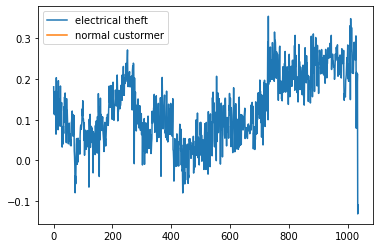

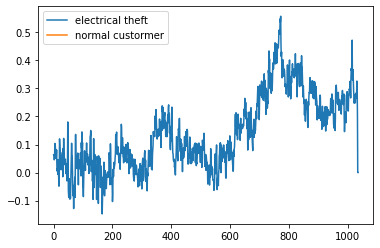

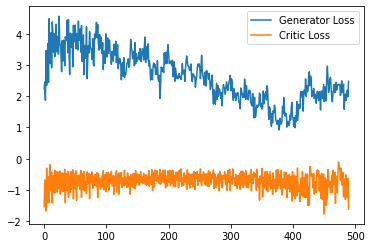

Step 9850: Generator loss: 1.9192269682884215, critic loss: -0.709676745533943


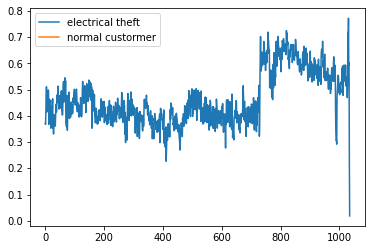

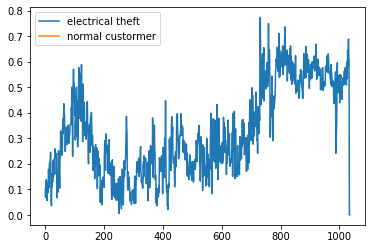

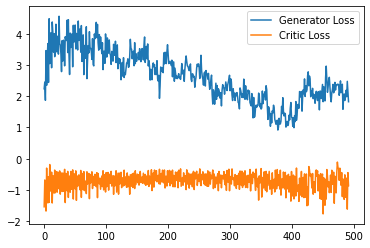

Step 9900: Generator loss: 2.1276617139577865, critic loss: -0.8691938452422621


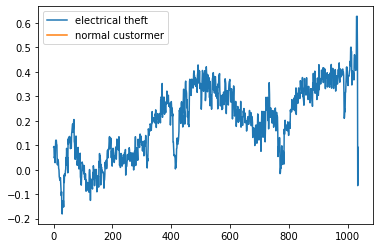

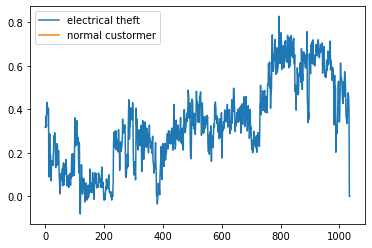

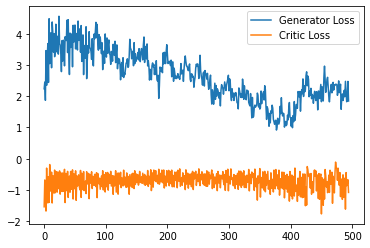

Step 9950: Generator loss: 1.9646302342414856, critic loss: -0.8996909639090298


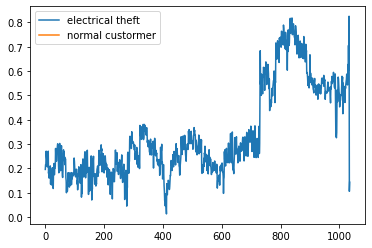

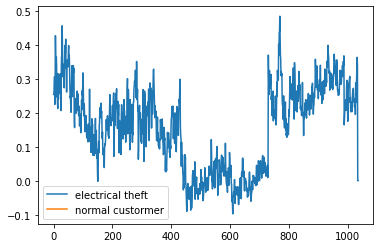

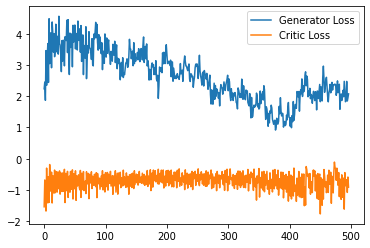

Step 10000: Generator loss: 2.157873830795288, critic loss: -0.912360287889838


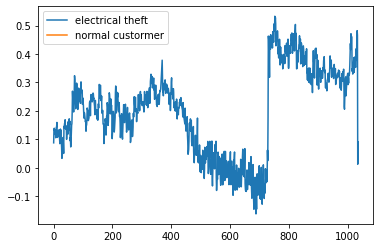

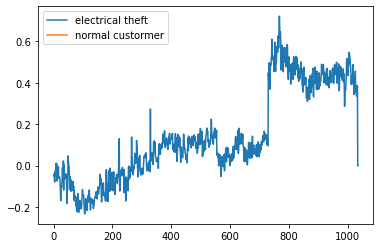

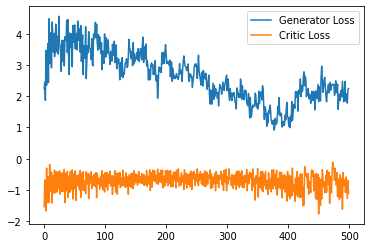

Step 10050: Generator loss: 2.4889600670337675, critic loss: -0.5985229926854372


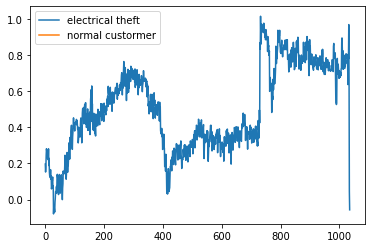

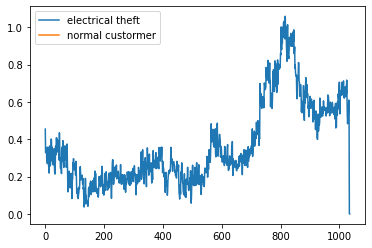

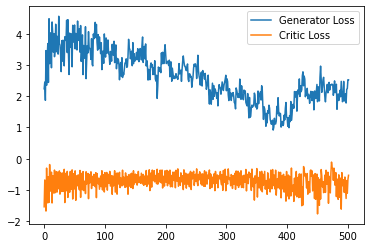

Step 10100: Generator loss: 1.9604585242271424, critic loss: -0.2612371421307325


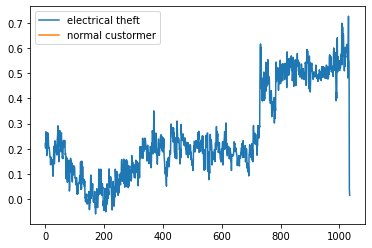

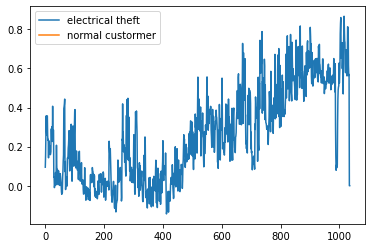

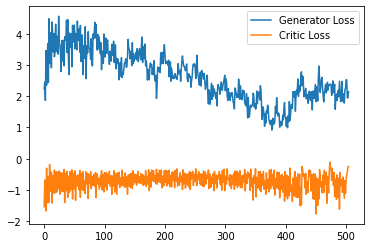

Step 10150: Generator loss: 2.217593331336975, critic loss: -0.4241074128299953


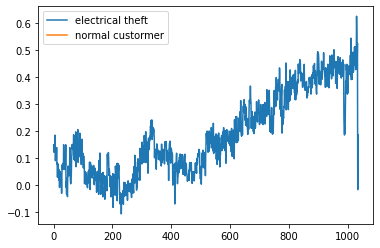

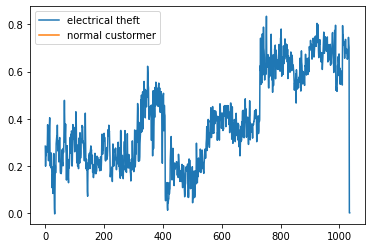

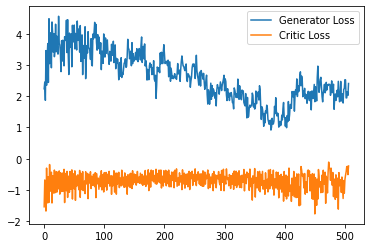

Step 10200: Generator loss: 2.5968904519081115, critic loss: -0.6914659160077571


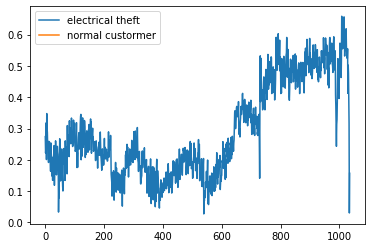

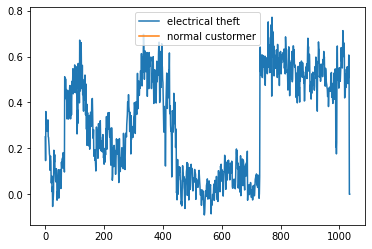

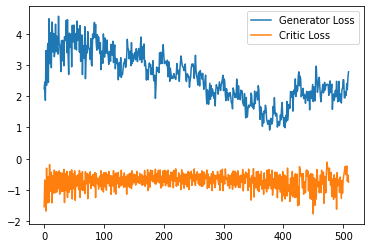

Step 10250: Generator loss: 2.8642795634269715, critic loss: -0.757067641913891


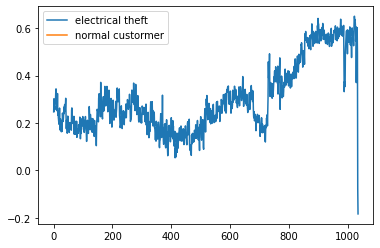

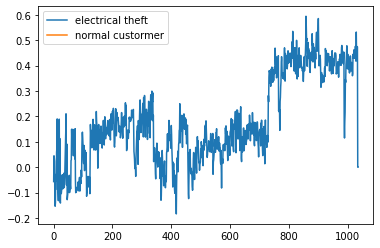

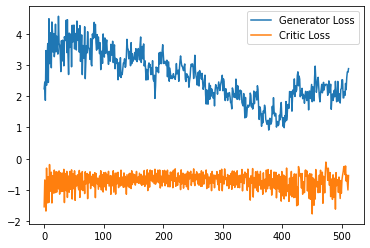

Step 10300: Generator loss: 2.539362835884094, critic loss: -0.8167515132129192


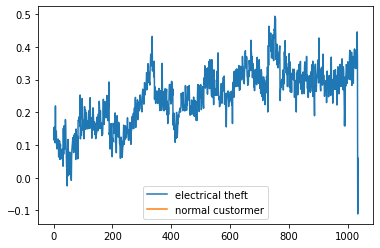

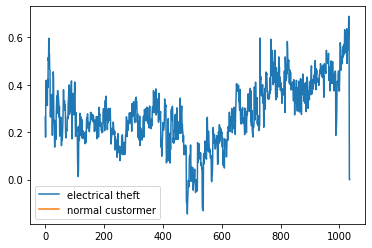

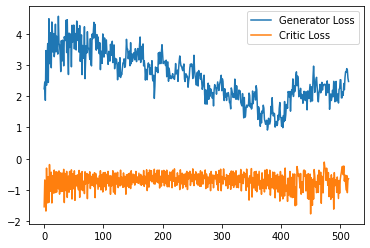

Step 10350: Generator loss: 2.6154007434844972, critic loss: -0.9837394126355646


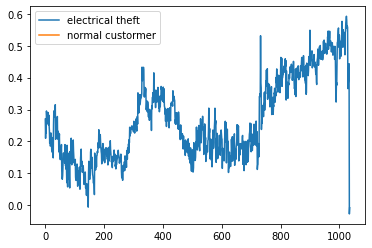

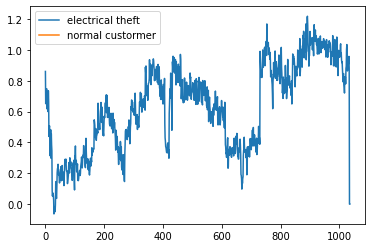

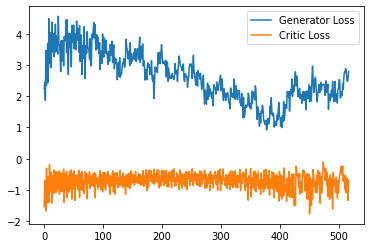

In [11]:
cur_step = 0
pretrain_loss = nn.MSELoss()
generator_losses = []
critic_losses = []

for epoch in range(10):
    random_batch = random_shuffle(X, Y, False)
    for batch in random_batch:
        real = batch[:, :batch.shape[1]-1, :]
        real_class = torch.unsqueeze(batch[:, -1, :], 1)
        one_hot_vector = get_one_hot_vector(real_class, device=device)
        cur_batch_size = len(real)
        real = real.to(device)
        
        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, weeks, z_dim, device=device)
        fake_2 = gen(torch.cat((fake_noise_2, one_hot_vector), 1))
        
        gen_loss = pretrain_loss(fake_2, real)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()
        print("pretrain generator loss:" + str(gen_loss.detach().cpu().numpy()))


for epoch in range(n_epochs):
    # Dataloader returns the batches
    random_batch = random_shuffle(X, Y, False)
    for batch in random_batch:
        real = batch[:, :batch.shape[1]-1, :]
        real_class = torch.unsqueeze(batch[:, -1, :], 1)
        one_hot_vector = get_one_hot_vector(real_class, device=device)
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, weeks, z_dim, device=device)
            fake = gen(torch.cat((fake_noise, one_hot_vector), 1))
            crit_fake_pred = crit(torch.cat((fake.detach(), one_hot_vector), 1))
            crit_real_pred = crit(torch.cat((real, one_hot_vector), 1))

            epsilon = torch.rand(len(real), 148, 7, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon, one_hot_vector)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, weeks, z_dim, device=device)
        fake_2 = gen(torch.cat((fake_noise_2, one_hot_vector), 1))
        crit_fake_pred = crit(torch.cat((fake_2, one_hot_vector), 1))
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake, real_class)
            show_tensor_images(real, real_class)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            #plt.savefig("GAN training loss",dpi=1200)
            plt.show()

        cur_step += 1

In [12]:
# save model
import os
if not os.path.exists("models"):
    os.mkdir("models")
torch.save(gen, "models/gen")
torch.save(crit, "models/crit")

# load model
# gen = torch.load("models/gen")
# crit = torch.load("models/crit")

# save fake data
if not os.path.exists("fake data"):
    os.mkdir("fake data")
generate_sample = 40000
real_class = torch.cat((torch.zeros(generate_sample//2, 1, 7), torch.ones(generate_sample//2, 1, 7)), 0)
one_hot_vector = get_one_hot_vector(real_class, device=device)
fake_noise = get_noise(generate_sample, weeks, z_dim, device=device)
fake = gen(torch.cat((fake_noise, one_hot_vector), 1))
torch.save(fake, "fake data/fake_X.trc")
torch.save((real_class[:, :, -1]).reshape(-1), "fake data/fake_Y.trc")

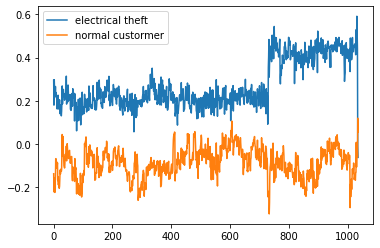

In [13]:
show_tensor_images(fake, real_class)

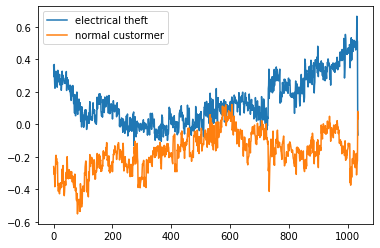

In [14]:
show_tensor_images(fake[::500], real_class[::500])

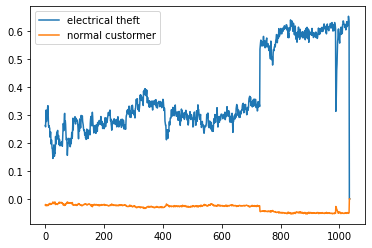

In [15]:
Y_class = torch.zeros(Y.shape[0], 1, 7)
Y_class[Y==1] = 1
show_tensor_images(X, Y_class)

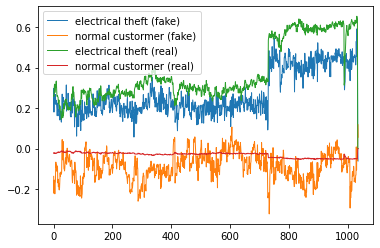

In [16]:
show_diff_images(X, Y_class, fake, real_class, True, "fake data and real data.png")